In [1]:
import sys
import os 
import tqdm
import pickle
import numpy as np 
import pandas as pd
import networkx as nx
import seaborn as sns
from functools import partial

import rdkit 
from rdkit import Chem
from rdkit.Chem import AllChem

import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})

# Makes the dataset that stores as the figures and data as it is generated.
if not os.path.exists("Datasets"):
    os.mkdir("Datasets")

# Version information is printed down the bottom of the jupyter notebook so that everything is imported first.

In [2]:
# Set random seeds

np.random.seed(10)
sklearn_random_state = 10
random_state = 10 

# Utility Functions

In [3]:
# Coefficient Functions

def gini(array):
    """
    Calculate the Gini coefficient of a numpy array.
    Taken from https://github.com/oliviaguest/gini
    
    Parameters 
    ----------
    array : np.array, shape=(N,)
        The array of values to compute the gini coefficients of.
    """
    # based on bottom eq: http://www.statsdirect.com/help/content/image/stat0206_wmf.gif
    # from: http://www.statsdirect.com/help/default.htm#nonparametric_methods/gini.htm
    array = array.flatten() #all values are treated equally, arrays must be 1d
    if np.amin(array) < 0:
        #array -= np.amin(array) #values cannot be negative
        array = np.abs(array)
    array += 0.0000001 #values cannot be 0
    array = np.sort(array) #values must be sorted
    index = np.arange(1,array.shape[0]+1) #index per array element
    n = array.shape[0]#number of array elements
    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array))) #Gini coefficient


# Graph Signal Processing Functions

In [4]:
from scipy.spatial.distance import cdist

# Distances

def difference(x,y):
    """
    Computes the Hamming distance between two equal length arrays
    
    Parameters
    ----------
    x, y : np.bool
        The two boolean representations to be compared
    
    Returns
    -------
    distance, int
        The distance between the two representations
    """
    return len(np.where(np.array(x) != np.array(y))[0])

def ham_ker(X,Y):
    return np.exp(-cdist(X,Y,metric="hamming")*100)

def tani_ker(X,Y):
    return cdist(X,Y,metric="dice")#*100)

In [5]:
# Graph Operations

def adj(X,metric):
    """
    Computes the adjacency matrix given a set of molecules, X, and a particular distance metric.
    
    Parameters 
    ----------
    X : iterable 
        An iterable 
        
    metric : func
        A function that operates on two instances to compute their similiarty/distance
    """
    return np.array([[metric(x,y) for y in X] for x in X])

def lap(adjacency):
    """
    Computes the Laplacian from a given adjacency matrix 
    """
    adj = np.copy(adjacency)
    np.fill_diagonal(adj,0)
    adj *= -1
    np.fill_diagonal(adj,np.sum(adj,0)*-1)
    return adj 

def fourier(arr,return_vals=False):
    """
    Computes and returns the fourier basis of a particular matrix. Assumes that the matrix is symmetric and uses np.eigh
    
    Parameters 
    ----------
    arr : np.array, (NxN)
        Assumed to be both square any symmetric in order to produce an orthogonal Fourier basis.
        
    return_vals : bool, default=False
        Whether or not to return the eigenvalues. Defaults to false as the point of this function is to compute the Fourier basis of a symmetric matrix.
        
    Returns
    -------
    q : np.array (NxN)
        Produces the eigenmatrix in which column i is the eigenvector corresponding to the ith eigenvector.
    """
    l, q = np.linalg.eigh(arr)
    if return_vals:
        return q, l
    else:
        return q
    
def gft(fourier_basis, signal):
    """
    Performs the Graph Fourier Transform on a signal and returns the unsorted coefficient spectrum.
    
    Parameters
    ----------
    fourier_basis : np.array (NxN)
        The fourier basis of interest. Note that the columns must be the eigenvectors, not the rows. This is the default behaviour of numpy.eigh
        
    signal : np.array (N,)
        The signal to be projected onto the Fourier basis. Dimensions of the two must match
        
    Returns 
    -------
    coefficients : np.array (N,)
        The coefficient spectrum of the signal projected onto the Fourier basis.
    """
    assert fourier_basis.shape[0] == signal.shape[0], "The number of eigenvectors must equal the dimension of the signal."
    
    return fourier_basis.T @ signal

def fourier_decomposition(X, K, S):
    r"""
    Computes the complete Fourier projection for a given set of representations (X), similarity measure, and signal defined over the graph.
    
    Parameters
    ----------
    X : np.array(NxM)
        An array containing N molecules with their associated M dimensional representation
        
    K : func 
        A similarity/kernel function that acts on X. It will return an X by X symmetric matrix of all possible pairwise similarities. Method must have 
        the same compute syntax as sklearn kernels or scipy's cdist module.
        
    S : np.array(N,)
        A signal in R^n that is going to projected onto the orthonormal eigenvases is K(X,X)
    
    Returns
    -------
    coeffs : np.array(N,)
        A numpy array of coefficients corresponding to the linear combination of eigenvectors required to reconstruct the signal.
    """
    adj = K(X,X)
    eigenvectors = fourier(adj)
    return gft(eigenvectors,S)

# Plotting



In [6]:
from matplotlib.offsetbox import AnchoredText

def signal_plot(coeffs,ylim=(-5,5),linewidth=1,gini=gini,ax=None,sort=False,spines=["top","right"],axlabels=True,figsize=(8,6),*args, **kwargs):
    """
    Plot a signal plot for the unsorted, signed coefficients of the Fourier expansion. 
    
    Parameters 
    ----------
    coeffs : np.array, (N,)
        The numpy array of expansion coefficients
        
    ylim : tuple, default=(-5,5)
        The y-limits of the plot formatted as (ymin,ymax)
        
    gini : func, default=gini
        A function to compute the gini coefficient of the spectra 
        
    Returns 
    -------
    signal plot, matplotlib.Axes
        The signal plot plotted on axes.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    ax.set_ylim(*ylim)
    if sort:
        coeffs = np.sort(np.abs(coeffs))
    for x,coeff in enumerate(coeffs):
        ax.plot((x,x),(0,coeff),linewidth=linewidth,c='k',*args, **kwargs)
    if gini is not None:
        ax.annotate(f"Gini Coefficient: {gini(coeffs):.4f}",xy=(0.1,ylim[1]-(ylim[1]/10)),fontsize=16)
        
    if spines is not None:
        for spine in spines:
            ax.spines[spine].set_visible(False)
    if axlabels:
        ax.set_xlabel(f"Eigenvector ($\mu_i$)",fontsize=16)
        ax.set_ylabel("Coefficient ($x_i$)",fontsize=16)
    return ax

def spectrum_plot(coeffs,ylim=(-5,5),gini=gini,ax=None,*args,**kwargs):
    """
    Plots the sorted coefficient spectra on the same plot along with their gini coefficient values
    
    Parameters
    ----------
    coeffs : {representation : np.array(N,)}
        A dictionary with names assigned to each coefficient array of N coefficients. 
        
    ylim : tuple, default=(-5,5)
        The y-limits of the plot formatted as (ymin,ymax)
        
    gini : func, default=gini
        A function to compute the gini coefficient of the spectra 

    Returns 
    -------
    ax : A matplotlib axis figure with all plots
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(16,6))
    for name,coeff in coeffs.items():
        coeff = np.sort(np.abs(np.array(coeff)))
        ax.plot(np.arange(len(coeff)), coeff,label=f"{name} ({gini(coeff):.4f})")
    ax.set_xlim(0,len(coeff))
    return ax

def plot_adj(adj,
             node_cmap=matplotlib.cm.get_cmap('Spectral'),
             edge_cmap=matplotlib.cm.get_cmap("Greys"),
             pos=nx.spring_layout,
             title=None,
             titlefontsize=24,
             ax=None,
             figsize=(8,8),
             signal=None,
             border_edge_cmap=None,
             return_pos=False,
             *args,
             **kwargs):
    """
    Produce a visualisation of a matrix using networkx.draw. 
    
    Parameters
    ----------
    adj : np.array(N,N)
        The adjacency matrix to be visualised.
        
    node_cmap : matplotlib.cm, default=matplotlib.cm.get_cmap("Spectral")
        The node colourmap used to colour the nodes.
    
    edge_cmap : matplotlib.cm, default=matplotlib.cm.get_cmap("Greys")
        The colormap used to colour edge weights.
    
    pos : func or dict, default=nx.spring_layout
        The network layout function used to compute the positions of the nodes. Alternatively, can explicitly pass dictionary of numpy coordinates to embed
        the vertices.
        
    title : str, default=None
        The string used to title the ax object.
            
    ax : matplotlib.Axes, default=None
        A matplob axis to perform the plot on.
        
    signal : np.array(N,), default=None
        The signal to be projected onto the nodes through face colouring.
        
    border_edge_cmap : dict, default=None
        A colourmap dictionary used to provide border colours to the nodes.
        
    edge_signal
        
    return_pos : bool, default=False
        Whether or not to return the positions dictionary.
        
    Returns 
    -------
    ax : matplotlib.Axes 
        Returns an axis object with the graph plot.
    """
    G = nx.from_numpy_array(adj)
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())
    
    if callable(pos):
        pos = pos(G)
        
    edge_colors = edge_cmap(weights)
    edge_colors[:,3] = 1-edge_colors[:,0]
    
    if node_cmap is None:
        colors = [(0.5,0.5,0.5,1) for x in range(len(G))]
    else:
        if signal is None:
            colors = node_cmap(np.linspace(0,1,len(G.nodes)))
        else:
            colors = node_cmap(signal)
        
    if border_edge_cmap is not None:
        edgecolors = border_edge_cmap
    else:
        edgecolors = "k"
    
    nx.draw(G,node_color=colors,pos=pos,edgecolors=edgecolors,edge_color=edge_colors,ax=ax, *args, **kwargs)
    
    if title is not None:
        ax.set_title(title,fontsize=titlefontsize)
    
    if return_pos:
        return ax, pos 
    else:
        return ax

def save(name,directory='/'.join(os.getcwd().split('/')[:-1]) + "/Images",sub_dir=None,*args, **kwargs):
    """
    Custom save function to save images just how I like them.
    
    Parameters
    ----------
    name : str 
        The filename used to save the file
        
    directory : str, default='/'.join(os.getcwd().split('/')[:-1]) + "/Images"
        The directory to save the files into. Defaults to the Images subdirectory in the 
        directory above (assumes this is executed in a code subdirectory.)
        
    sub_dir : str, default=None
        Places the images into a sub directory within images.
    """
    assert name.count('.') <= 1, "Names with multiple periods are poor practice and not supported."
    
    if sub_dir is not None:
        if not os.path.exists('/'.join(os.getcwd().split('/')[:-1])+"/Images/" + f"{sub_dir}"):
            os.mkdir('/'.join(os.getcwd().split('/')[:-1])+"/Images/" + f"{sub_dir}")
    
        fname = directory + "/" + f"{sub_dir}/" + name
    else:
        fname = directory + "/" + name 
        
    if name.split('.')[-1] == ".png" or name.count('.') == 0:
        plt.savefig(fname,dpi=300,bbox_inches="tight",transparent=True, *args, **kwargs)
    elif name.split('.')[-1] == ".pdf":
        plt.savefig(fname,bbox_inches="tight",*args, **kwargs)
    elif name.split('.')[-1] == '.svg':
        plt.savefig(fname, bbox_inches='tight',transparent=True, *args, **kwargs)
    else:
        plt.savefig(fname,bbox_inches="tight",*args,**kwargs)

# Molecular Representations

## Coordinate Based Representations

All of the datasets in this system have coordinate based representations and as a result are used with a different set of molecular representations

In [7]:
# Datasets
# Wrote this before I found RDkit moltoxyz file.

def gen_xyz(mol,idx,directory=None,prefix=None,pad=0):
    """
    Converts an RDKit mol file to an xyz coordinate file.
    
    Parameters 
    ----------
    mol : rdkit.Chem.rdchem.Mol
        The mol to be converted.
        
    idx : int
        The integer index of the mol format in its dataframe.
        
    directory : str, default=None
        The directory to save the xyz files into.
        
    prefix : str, default=None
        The prefix to be preprended before the idx.
        
    pad : int, default=0
        How many zeros to pad the index with in the python strings
    """
    coords = mol.GetConformer().GetPositions()
    atoms = np.array([atom.GetSymbol() for atom in mol.GetAtoms()]).reshape(-1,1)
    combined = np.concatenate([atoms,coords],axis=1)
    
    name = f"{str(idx).zfill(pad)}.xyz"        

    if prefix is not None:
        name = prefix + name
    
    if directory is not None:
        if not directory.endswith("/"):
            directory += "/"
        name = directory + name
        
    with open(name, "w") as f:
        f.write(str(len(combined)))
        f.write("\n\n")
        for row in combined:
            f.write("\t".join(row))
            f.write("\n")
            
    return 1

## QM9 Preprocessing

In [8]:
qm9 = pd.read_csv("Datasets/QM9/QM9_Data.csv")

num_atoms = [len(Chem.MolFromSmiles(mol).GetAtoms()) for mol in tqdm.tqdm(qm9["SMILES"],position=0, leave=True)]
qm9["Num_Atoms"] = num_atoms

qm9_subset = qm9[qm9["Num_Atoms"] < 9]

100%|████████████████████████████████| 133885/133885 [00:03<00:00, 34528.96it/s]


In [9]:
qm9_data = pd.read_csv("Datasets/QM9/gdb9.sdf.csv")
qm9 = open('Datasets/QM9/gdb9.sdf','rb')

qm9_mols = []
qm9_idxs = []

for idx,mol in enumerate(Chem.ForwardSDMolSupplier(qm9,removeHs = False)):
    if mol is None: continue#print(f"Molecule {idx} failed")
    qm9_mols.append(mol)
    qm9_idxs.append(idx)

FileNotFoundError: [Errno 2] No such file or directory: 'Datasets/QM9/gdb9.sdf.csv'

In [ ]:
for idx,mol in tqdm.tqdm(zip(qm9_idxs,qm9_mols),position=0, leave=True):
    gen_xyz(mol,idx=idx,directory="Datasets/QM9/Mols",prefix="QM9_",pad=6)

## QM8 Preprocessing

In both QM7 and QM8 preprocessing, files that rdkit cannot convert are removed. The qm7_idxs and qm8_idxs objects track which indices have been successfully converted and should be used to access the data from the dataframes that contain valid molecules

In [13]:
qm8_data = pd.read_csv("Datasets/QM8/qm8.sdf.csv")
qm8 = open('Datasets/QM8/qm8.sdf','rb')

qm8_mols = []
qm8_idxs = []

for idx,mol in enumerate(Chem.ForwardSDMolSupplier(qm8,removeHs = False)):
    if mol is None: continue#print(f"Molecule {idx} failed")
    qm8_mols.append(mol)
    qm8_idxs.append(idx)

RDKit WARNING: [11:50:22] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:22] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit ERROR: [11:50:22] Explicit valence for atom # 0 N, 4, is greater than permitted
[11:50:22] Explicit valence for atom # 0 N, 4, is greater than permitted
RDKit ERROR: [11:50:22] ERROR: Could not sanitize molecule ending on line 7254
RDKit ERROR: [11:50:22] ERROR: Explicit valence for atom # 0 N, 4, is greater than permitted
[11:50:22] ERROR: Could not sanitize molecule ending on line 7254
[11:50:22] ERROR: Explicit valence for atom # 0 N, 4, is greater than permitted
[11:50:22] Explicit valence for atom # 2 N, 4, is greater than permitted
RDKit ERROR: [11:50:22] Explicit valence for atom # 2 N, 4, is greater than permitted
RDKit ERROR: [11:50:22] ERROR: Could not sanitize molecule ending on line 7619
[11:50:22] ERROR: Could not sanitize molecule ending on line 7619
RDKit WARNING: [11:50:22] Warning: molecule is tagged as 3D,

In [14]:
for idx,mol in tqdm.tqdm(zip(qm8_idxs,qm8_mols),position=0, leave=True):
    gen_xyz(mol,idx=idx,directory="Datasets/QM8/Mols",prefix="QM8_",pad=5)

21747it [00:06, 3513.73it/s]


## QM7 Preprocessing

In [15]:
qm7_data = pd.read_csv("Datasets/QM7/gdb7.sdf.csv")
qm7 = open("Datasets/QM7/gdb7.sdf","rb")

qm7_mols = []
qm7_idxs = []

for idx,mol in enumerate(Chem.ForwardSDMolSupplier(qm7, removeHs = False)):
    if mol is None: continue#print(f"Molecule {idx} failed")
    qm7_mols.append(mol)
    qm7_idxs.append(idx)
    
# These two sdf files are not correct and as such are removed.
del qm7_idxs[5505]
del qm7_idxs[5505]
del qm7_idxs[6213]
del qm7_idxs[6213]

del qm7_mols[5505]
del qm7_mols[5505]
del qm7_mols[6213]
del qm7_mols[6213]

RDKit WARNING: [11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit WARNING: [11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit WARNING: [11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit WARNING: [11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit WARNING: [11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit WARNING: [11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
[11:50:31] Warning: molecule is tagged as 3D, but all Z coords are zero
RDKit WARNING: [11:50:31] Warning: molecule is

In [16]:
for idx,mol in tqdm.tqdm(zip(qm7_idxs,qm7_mols),position=0, leave=True):
    gen_xyz(mol,idx=idx,directory="Datasets/QM7/Mols",prefix="QM7_",pad=4)

6834it [00:01, 3581.60it/s]


# DScribe/ASE setup

In [12]:
import os
import tqdm
import ase
import dscribe
import sklearn
from dscribe.descriptors import SOAP,CoulombMatrix, MBTR
from dscribe.kernels import REMatchKernel
from ase.build import molecule
from ase.io import read
from ase import Atoms

if not os.path.exists("Representations"):
    os.mkdir("Representations")

# QM9_setup 

species = ["H", "C", "O", "N","F"]
rcut = 6.0
nmax = 8
lmax = 6

# Setting up the SOAP descriptor
qm9_soap = SOAP(
    species=species,
    periodic=False,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
)

qm9_average_soap = SOAP(
    species=species,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
    average="inner",
    sparse=False
)

# Setting up the CM descriptor
qm9_cm = CoulombMatrix(
    n_atoms_max=26,
)

# Setting up the MBTR descriptor
qm9_mbtr = MBTR(
    species=["H", "C", "O", "N","F"],
    k1={
        "geometry": {"function": "atomic_number"},
        "grid": {"min": 0, "max": 9, "n": 100, "sigma": 0.1},
    },
    k2={
        "geometry": {"function": "inverse_distance"},
        "grid": {"min": 0, "max": 1, "n": 100, "sigma": 0.1},
        "weighting": {"function": "exp", "scale": 0.5, "threshold": 1e-3},
    },
    k3={
        "geometry": {"function": "cosine"},
        "grid": {"min": -1, "max": 1, "n": 100, "sigma": 0.1},
        "weighting": {"function": "exp", "scale": 0.5, "threshold": 1e-3},
    },
    periodic=False,
    normalization="l2_each",
)



In [5]:
qm9_mols = [f"Datasets/QM9/QM9/dsgdb9nsd_{str(x+1).zfill(6)}.xyz" for x in tqdm.tqdm(qm9_subset.index)]
qm9_mols_read = [read(xyz) for xyz in tqdm.tqdm(qm9_mols,position=0, leave=True)]

NameError: name 'qm9_subset' is not defined

In [10]:
from sklearn.preprocessing import normalize

# Coulomb Matrix
if os.path.exists("Representations/qm9_cm_mols.npy"):
    qm9_cm_mols = np.load("Representations/qm9_cm_mols.npy")
else:
    qm9_cm_mols = np.array([qm9_cm.create(mol) for mol in tqdm.tqdm(qm9_mols_read,position=0, leave=True)])

# Average SOAP
if os.path.exists("Representations/qm9_avsoap_mols.npy"):
    qm9_avsoap_mols = np.load("Representations/qm9_avsoap_mols.npy")
else:
    qm9_soap_mols = np.array([qm9_soap.create(mol) for mol in tqdm.tqdm(qm9_mols_read,position=0, leave=True)])
    qm9_avsoap_mols = np.array([qm9_average_soap.create(mol) for mol in tqdm.tqdm(qm9_mols_read,position=0, leave=True)])

# Many Body Tensor Representations
if os.path.exists("Representations/qm9_mbtr_mols.npy"):
    qm9_mbtr_mols = np.load("Representations/qm9_mbtr_mols.npy")
else:
    qm9_mbtr_mols = np.array([qm9_mbtr.create(mol) for mol in tqdm.tqdm(qm9_mols_read,position=0,leave=True)])

    
qm9_cm_mols = normalize(qm9_cm_mols)
qm9_avsoap_mols = normalize(qm9_avsoap_mols)
qm9_mbtr_mols = normalize(qm9_mbtr_mols)

In [34]:
# QM9

#np.save("Representations/qm9_cm_mols.npy",qm9_cm_mols)
#np.save("Representations/qm9_avsoap_mols.npy",qm9_avsoap_mols)
#np.save("Representations/qm9_mbtr_mols.npy",qm9_mbtr_mols)

In [1217]:
# Time taken for a ~22500x~22500 matrix, about 90 minutes on this machine

import datetime
print(hold.shape)
print(datetime.datetime.now())
np.linalg.eig(hold)
print(datetime.datetime.now())

(22291, 22291)
2021-08-30 14:28:54.142331
2021-08-30 16:00:03.286206


In [11]:
# QM8_setup 

species = ["H", "C", "O", "N","F"]
rcut = 6.0
nmax = 8
lmax = 6

# Setting up the SOAP descriptor
qm8_soap = SOAP(
    species=species,
    periodic=False,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
)

qm8_average_soap = SOAP(
    species=species,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
    average="inner",
    sparse=False
)

# Setting up the CM descriptor
qm8_cm = CoulombMatrix(
    n_atoms_max=26,
)
# Setting up the MBTR descriptor
qm8_mbtr = MBTR(
    species=["H", "C", "O", "N","F"],
    k1={
        "geometry": {"function": "atomic_number"},
        "grid": {"min": 0, "max": 9, "n": 100, "sigma": 0.1},
    },
    k2={
        "geometry": {"function": "inverse_distance"},
        "grid": {"min": 0, "max": 1, "n": 100, "sigma": 0.1},
        "weighting": {"function": "exp", "scale": 0.5, "threshold": 1e-3},
    },
    k3={
        "geometry": {"function": "cosine"},
        "grid": {"min": -1, "max": 1, "n": 100, "sigma": 0.1},
        "weighting": {"function": "exp", "scale": 0.5, "threshold": 1e-3},
    },
    periodic=False,
    normalization="l2_each",
)

qm8_mols = [f"Datasets/QM8/Mols/QM8_{str(x).zfill(5)}.xyz" for x in tqdm.tqdm(qm8_idxs)]
qm8_mols_read = [read(xyz) for xyz in tqdm.tqdm(qm8_mols,position=0, leave=True)]

NameError: name 'SOAP' is not defined

In [17]:
if os.path.exists("Representations/qm8_cm_mols.npy"):
    qm8_cm_mols = np.load("Representations/qm8_cm_mols.npy")
else:
    qm8_cm_mols = np.array([qm8_cm.create(mol) for mol in tqdm.tqdm(qm8_mols_read,position=0, leave=True)])

if os.path.exists("Representations/qm8_avsoap_mols.npy"):
    qm8_avsoap_mols = np.load("Representations/qm8_avsoap_mols.npy")
else:    
    qm8_soap_mols = np.array([qm8_soap.create(mol) for mol in tqdm.tqdm(qm8_mols_read,position=0, leave=True)])
    qm8_avsoap_mols = np.array([qm8_average_soap.create(mol) for mol in tqdm.tqdm(qm8_mols_read,position=0, leave=True)])

if os.path.exists("Representations/qm8_mbtr_mols.npy"):
    qm8_mbtr_mols = np.load("Representations/qm8_mbtr_mols.npy") 
else:
    qm8_mbtr_mols = np.array([qm8_mbtr.create(mol) for mol in tqdm.tqdm(qm8_mols_read,position=0,leave=True)])

qm8_cm_mols = normalize(qm8_cm_mols)
qm8_avsoap_mols = normalize(qm8_avsoap_mols)
qm8_mbtr_mols = normalize(qm8_mbtr_mols)

In [38]:
# QM8 
#np.save("Representations/qm8_cm_mols.npy",qm8_cm_mols)
#np.save("Representations/qm8_avsoap_mols.npy",qm8_avsoap_mols)
#np.save("Representations/qm8_mbtr_mols.npy",qm8_mbtr_mols)

In [92]:
# QM7_setup 

species = ["H","C","O","N","S"]
rcut = 6.0
nmax = 8
lmax = 6

# Setting up the SOAP descriptor
qm7_soap = SOAP(
    species=species,
    periodic=False,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
)

qm7_average_soap = SOAP(
    species=species,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
    average="inner",
    sparse=False
)

# Setting up the CM descriptor
qm7_cm = CoulombMatrix(
    n_atoms_max=22,
)

# Setting up the MBTR descriptor
qm7_mbtr = MBTR(
    species=["H", "C", "O", "N","S"],
    k1={
        "geometry": {"function": "atomic_number"},
        "grid": {"min": 0, "max": 16, "n": 100, "sigma": 0.1},
    },
    k2={
        "geometry": {"function": "inverse_distance"},
        "grid": {"min": 0, "max": 1, "n": 100, "sigma": 0.1},
        "weighting": {"function": "exp", "scale": 0.5, "threshold": 1e-3},
    },
    k3={
        "geometry": {"function": "cosine"},
        "grid": {"min": -1, "max": 1, "n": 100, "sigma": 0.1},
        "weighting": {"function": "exp", "scale": 0.5, "threshold": 1e-3},
    },
    periodic=False,
    normalization="l2_each"
)

qm7_mols = [f"Datasets/QM7/Mols/QM7_{str(x).zfill(4)}.xyz" for x in tqdm.tqdm(qm7_idxs)]
qm7_mols_read = [read(xyz) for xyz in tqdm.tqdm(qm7_mols,position=0, leave=True)]


100%|██████████| 6838/6838 [00:08<00:00, 837.47it/s] 


In [18]:
if os.path.exists("Representations/qm7_cm_mols.npy"):
    qm7_cm_mols = np.load("Representations/qm7_cm_mols.npy")
else:
    qm7_cm_mols = np.array([qm7_cm.create(mol) for mol in tqdm.tqdm(qm7_mols_read,position=0, leave=True)])

if os.path.exists("Representations/qm7_avsoap_mols.npy"):
    qm7_avsoap_mols = np.load("Representations/qm7_avsoap_mols.npy")
else:
    qm7_soap_mols = np.array([qm7_soap.create(mol) for mol in tqdm.tqdm(qm7_mols_read,position=0, leave=True)])
    qm7_avsoap_mols = np.array([qm7_average_soap.create(mol) for mol in tqdm.tqdm(qm7_mols_read,position=0, leave=True)])

if os.path.exists("Representations/qm7_mbtr_mols.npy"):
    qm7_mbtr_mols = np.load("Representations/qm7_mbtr_mols.npy")
else:
    qm7_mbtr_mols = np.array([qm7_mbtr.create(mol) for mol in tqdm.tqdm(qm7_mols_read,position=0,leave=True)])

qm7_cm_mols = normalize(qm7_cm_mols)
qm7_avsoap_mols = normalize(qm7_avsoap_mols)
qm7_mbtr_mols = normalize(qm7_mbtr_mols)

#qm7_mol_features = [normalize(soap_mol) for soap_mol in tqdm.tqdm(qm7_soap_mols,position=0, leave=True)]

In [96]:
# QM7
#np.save("Representations/qm7_cm_mols.npy",qm7_cm_mols)
#np.save("Representations/qm7_avsoap_mols.npy",qm7_avsoap_mols)
#np.save("Representations/qm7_mbtr_mols.npy",qm7_mbtr_mols)

# SMILES Based Descriptors

All of the datasets in this section only have SMILES as their available descriptor. The following section loads the datasets and generates the descriptors of interest for each one.


In [23]:
import mhfp
from mhfp.encoder import MHFPEncoder
from rdkit.Chem import Descriptors

# Datasets
ESOL = pd.read_csv("Datasets/ESOL.csv")
FreeSolv = pd.read_csv("Datasets/FreeSolv.csv")
Lipophilicity = pd.read_csv("Datasets/Lipophilicity.csv")
Clintox = pd.read_csv("Datasets/Clintox.csv")
BBBP = pd.read_csv("Datasets/BBBP.csv")
BACE = pd.read_csv("Datasets/BACE.csv")
SIDER = pd.read_csv("Datasets/SIDER.csv")

regression_datasets = {"ESOL" : ESOL, 
            "FreeSolv" : FreeSolv,
            "Lipophilicity" : Lipophilicity, 
            "BACE" : BACE, 
            "QM9" : qm9_subset}

In [24]:
def fold(hash_values, length=2048):
        """Folds the hash values to a binary vector of a given length.
    Arguments:
      hash_value {numpy.ndarray} -- An array containing the hash values.
      length {int} -- The length of the folded fingerprint (default: {2048})
    
    Returns:
      numpy.ndarray -- The folded fingerprint.
    """

        folded = np.zeros(length, dtype=np.uint8)
        folded[hash_values % length] = 1

        return folded

def parse_fingerprints(smiles,encoder,return_idxs=True,debug=False):
    """
    Function that parses the fingerprints of all SMILES in a particular pandas dataframe. This is written 
    as a separate function because in many of the dataframes there are SMILES strings which cannot be 
    processed by RDKit. This function removes them from the pool and returns a debug list telling the user
    which smiles failed and why.
    
    Parameters
    ----------
    smiles : iter
        An iterable of smiles to be converted.
        
    encoder : func
        An encoder function that converts the SMILES string into a particular fingerprint.
        
    return_idxs : bool, default=True
        Whether or not to return the indices associated with the SMILES that succeeded.
        
    debug : bool, default=False
        Whether or not to return the debug list.
    """
    fps = []
    fps_idxs = []
    failed = []
    for idx,mol in enumerate(smiles):
        try: 
            mol = Chem.MolFromSmiles(mol)
            fps.append(encoder(mol))
            if return_idxs:
                fps_idxs.append(idx)
                
        except Exception as e: 
            print(f"{idx} failed")
            if debug:
                failed.append(f"{idx} failed: {e}")
        
    if return_idxs and debug:
        return fps, fps_idxs, failed
    elif return_idxs:
        return fps, fps_idxs
    elif debug:
        return fps, failed
    else:
        return fps
    
props = ['CalcTPSA',
         'CalcLabuteASA',
         'CalcExactMolWt',
         'CalcNumAliphaticCarbocycles',
         'CalcNumAliphaticHeterocycles',
         'CalcNumAliphaticRings',
         'CalcNumAmideBonds',
         'CalcNumAromaticCarbocycles',
         'CalcNumAromaticHeterocycles',
         'CalcNumAromaticRings',
         'CalcNumAtomStereoCenters',
         'CalcNumBridgeheadAtoms',
         'CalcNumHBA',
         'CalcNumHBD',
         'CalcNumHeteroatoms',
         'CalcNumHeterocycles',
         'CalcNumLipinskiHBA',
         'CalcNumLipinskiHBD',
         'CalcNumRings',
         'CalcNumRotatableBonds',
         'CalcNumSaturatedCarbocycles',
         'CalcNumSaturatedHeterocycles',
         'CalcNumSaturatedRings',
         'CalcNumSpiroAtoms',
         'CalcNumUnspecifiedAtomStereoCenters']

def calc_vector(x,props=props):
    """
    Calculates the property vector using the available RDKit descriptors.
    
    Parameters 
    ----------
    x : str
        The SMILES to have its vector representation calculated.
        
    props : [str], default=props 
        The list of descriptor functions to calculate for the molecule of interest.
        
    Returns 
    -------
    y : np.array(len(props),)
        A numpy array the length of the property list.
    """
    if isinstance(x,str):
        x = Chem.MolFromSmiles(x)
    y = np.zeros((len(props),))
    for i in range(len(y)):
        y[i] = getattr(Descriptors.rdMolDescriptors, props[i])(x)
    return y 

In [28]:
!pip3 install pickle5
import pickle5 as pickle

mhfp_encoder = MHFPEncoder()

fingerprint_methods = {"RDKit" : Chem.RDKFingerprint,
                       "ErG" : rdkit.Chem.AllChem.GetErGFingerprint,
                       "MHFP" : mhfp_encoder.encode_mol,
                       "Descriptor" : calc_vector}

if os.path.exists("Fingerprints/regression.pkl"):
    print("Loading pre-existing fingerprints")
    with open('Fingerprints/regression.pkl', 'rb') as handle:
        regression_fingerprints = pickle.load(handle)

else:
    print("Calculating new fingerprints")
    regression_fingerprints = {}
    for dataset_name,dataset in regression_datasets.items():

        processed_datasets = {}
        for name,fingerprint_encoder in fingerprint_methods.items():

            fps, idxs, fail = parse_fingerprints(dataset["SMILES"],fingerprint_encoder,debug=True)
            processed_datasets[name] = [fps, idxs]

        regression_fingerprints[dataset_name] = processed_datasets

        print(f"{dataset_name} - Complete")

    # Manually apply the fold function from the mhfp library (copied above) as it helps remove errors that occur
    # if mhfp itself calls it.

    for dset in regression_fingerprints.keys():
        regression_fingerprints[dset]["MHFP"][0] = list(map(fold,regression_fingerprints[dset]["MHFP"][0]))
        
    # Checks that all of them are the same length

    for dset in regression_datasets:
        assert len(regression_fingerprints[dset]["MHFP"][0]) == len(regression_fingerprints[dset]["RDKit"][0]) == len(regression_fingerprints[dset]["ErG"][0]) == len(regression_fingerprints[dset]["Descriptor"][0]), f"{dset} has an inconsistency."
        print(f"{dset} - Passed")

    print("\nAll regression datasets passed the test.")
    
    with open('Fingerprints/regression.pkl', 'wb') as handle:
        pickle.dump(regression_fingerprints, handle, protocol=pickle.HIGHEST_PROTOCOL)

    with open('Fingerprints/regression.pkl', 'rb') as handle:
        test_fingerprints = pickle.load(handle)

    for dset in regression_fingerprints.keys():
        for name, fps in regression_fingerprints[dset].items():   
            assert np.all(np.array(regression_fingerprints[dset][name][0]) == np.array(test_fingerprints[dset][name][0])), f"Loading saved dictionary failed for {dset} - {name}"

    print("Saved file is identical to one just computed")

     |████████████████████████████████| 256 kB 8.0 MB/s eta 0:00:01
Loading pre-existing fingerprints


In [29]:
classification_datasets = {"SIDER"   : SIDER,
                           "BBBP"    : BBBP,
                           "Clintox" : Clintox}

if os.path.exists("Fingerprints/classification.pkl"):
    print("Loading pre-existing classification fingerprints")
    with open('Fingerprints/classification.pkl', 'rb') as handle:
        classification_fingerprints = pickle.load(handle)

else:
    print("Calculating new fingerprints")
    classification_fingerprints = {}
    for dataset_name,dataset in classification_datasets.items():

        processed_datasets = {}
        for name,fingerprint_encoder in fingerprint_methods.items():

            fps, idxs, fail = parse_fingerprints(dataset["SMILES"],fingerprint_encoder,debug=True)
            processed_datasets[name] = [fps, idxs]

        classification_fingerprints[dataset_name] = processed_datasets

        print(f"{dataset_name} - Complete")

    # Manually apply the fold function from the mhfp library (copied above) as it helps remove errors that occur
    # if mhfp itself calls it.

    for dset in classification_fingerprints.keys():
        classification_fingerprints[dset]["MHFP"][0] = list(map(fold,classification_fingerprints[dset]["MHFP"][0]))
        
    # Checks that all of them are the same length

    for dset in classification_datasets:
        assert len(classification_fingerprints[dset]["MHFP"][0]) == len(classification_fingerprints[dset]["RDKit"][0]) == len(classification_fingerprints[dset]["ErG"][0]), f"{dset} has an inconsistency."
        print(f"{dset} - Passed")

    print("\nAll classification datasets passed the test.")
    
    import pickle

    with open('Fingerprints/classification.pkl', 'wb') as handle:
        pickle.dump(classification_fingerprints, handle, protocol=pickle.HIGHEST_PROTOCOL)

    with open('Fingerprints/classification.pkl', 'rb') as handle:
        test_fingerprints = pickle.load(handle)

    for dset in classification_fingerprints.keys():
        for name, fps in classification_fingerprints[dset].items():   
            assert np.all(np.array(classification_fingerprints[dset][name][0]) == np.array(test_fingerprints[dset][name][0])), f"Loading saved dictionary failed for {dset} - {name}"

    print("Saved file is identical to one just computed")

Loading pre-existing classification fingerprints


In [30]:
full_props = [x for x in dir(Descriptors.rdMolDescriptors) if x.startswith("Calc")]
full_props

['CalcAUTOCORR2D',
 'CalcAUTOCORR3D',
 'CalcAsphericity',
 'CalcChi0n',
 'CalcChi0v',
 'CalcChi1n',
 'CalcChi1v',
 'CalcChi2n',
 'CalcChi2v',
 'CalcChi3n',
 'CalcChi3v',
 'CalcChi4n',
 'CalcChi4v',
 'CalcChiNn',
 'CalcChiNv',
 'CalcCoulombMat',
 'CalcCrippenDescriptors',
 'CalcEEMcharges',
 'CalcEccentricity',
 'CalcExactMolWt',
 'CalcFractionCSP3',
 'CalcGETAWAY',
 'CalcHallKierAlpha',
 'CalcInertialShapeFactor',
 'CalcKappa1',
 'CalcKappa2',
 'CalcKappa3',
 'CalcLabuteASA',
 'CalcMORSE',
 'CalcMolFormula',
 'CalcNPR1',
 'CalcNPR2',
 'CalcNumAliphaticCarbocycles',
 'CalcNumAliphaticHeterocycles',
 'CalcNumAliphaticRings',
 'CalcNumAmideBonds',
 'CalcNumAromaticCarbocycles',
 'CalcNumAromaticHeterocycles',
 'CalcNumAromaticRings',
 'CalcNumAtomStereoCenters',
 'CalcNumBridgeheadAtoms',
 'CalcNumHBA',
 'CalcNumHBD',
 'CalcNumHeteroatoms',
 'CalcNumHeterocycles',
 'CalcNumLipinskiHBA',
 'CalcNumLipinskiHBD',
 'CalcNumRings',
 'CalcNumRotatableBonds',
 'CalcNumSaturatedCarbocycles',
 'Cal

# Kernels

In [32]:
from sklearn.gaussian_process.kernels import ExpSineSquared, RBF, WhiteKernel, DotProduct, Matern
from rdkit import DataStructs

def fps_kernel(X,Y,sim=DataStructs.FingerprintSimilarity, metric=DataStructs.TanimotoSimilarity):
    """
    Computes the kernel covariance matrix using RDKit fingerprint similarity methods.
    """
    f = partial(sim, metric=metric)
    return np.array([[f(x,y) for y in X] for x in X])


# Adjacency

## FPS Adjacency

In [34]:
fps = [Chem.RDKFingerprint(Chem.MolFromSmiles(x)) for x in list(qm9["SMILES"].iloc[:2500])]
fps_adj = adj(fps,f)

NameError: name 'f' is not defined

## Coulomb Matrix

In [35]:
# 35-40 is a good value for visualisation (40 is used for projection plot, 35 for combined signal plot)
RBF_kernel = RBF(100) #599 ZPVE
cm_adj = RBF_kernel(cm_mols[:200])
#cm_adj_signals = RBF(600)(cm_mols)

NameError: name 'cm_mols' is not defined

## SOAP

### REMatch

In [249]:
# Any metric supported by scikit-learn will work: e.g. a Gaussian.
re = REMatchKernel(metric="rbf", gamma=10, alpha=0.1, threshold=1e-6)
re_kernel = re.create(mol_features[:50])

### Average SOAP

In [269]:
avsoap_adj = RBF(75)(avsoap_mols)

## Random Adjacency

In [ ]:
random = np.random.randn(2500,1)
RBF_kernel = RBF(10)
random_adj = RBF_kernel(random)


## RDKit Fingerprints

In [259]:
fps_adj = adj(fps,f)

TypeError: 'list' object is not callable

# Comparing Graph Visualisations

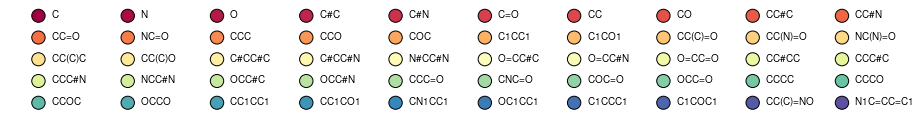

In [113]:
sub_dir = "Graph_Visualisation_Comparison"

smiles = qm9.iloc[:50]["SMILES"]

new_smiles = [smile.replace("#","\#") for smile in smiles] # Used to ensure that Latex can process the strings.

cols, rows = 5,10
xx,yy = np.meshgrid(np.arange(rows),np.arange(cols))

fig = plt.figure(figsize=(16,2))
ax = plt.gca()
ax.set_ylim(0.3,0.8)
color_range = np.linspace(0,1,len(smiles))
node_cmap=matplotlib.cm.get_cmap('Spectral')

for i, coord in enumerate(np.concatenate([xx.reshape(-1,1), yy.reshape(-1,1)],axis=1)):
    coord = coord * 0.1
    ax.annotate(f"{new_smiles[i]}",xy=(coord[0]+0.05,1-(coord[1]+0.25)))
    ax.add_artist(mpl.patches.Ellipse((coord[0]+0.035,1-(coord[1]+0.24)),edgecolor="k",width=0.015,height=0.06,facecolor=node_cmap(color_range[i]),linewidth=1))

plt.axis('off')    
#save("Graph_Visualisation_Legend.pdf",sub_dir=sub_dir)
plt.show()

In [176]:
freesolv_rdkit = RBF(5)(np.array(fingerprints["FreeSolv"]["RDKit"][0][:50]))
freesolv_erg   = RBF(0.05)(np.array(fingerprints["FreeSolv"]["ErG"][0][:200]))
freesolv_desc  = RBF(20)(np.array(fingerprints["FreeSolv"]["Descriptor"][0][:200]))


In [ ]:
fig, ax = plt.subplots(1,1,figsize=(16,16))

plot_adj(freesolv_rdkit, pos=nx.circular_layout,title="Test",node_size=50,width=0.25,ax=ax)
plt.show()

fig, ax = plt.subplots(1,1,figsize=(16,16))

plot_adj(freesolv_desc, pos=nx.circular_layout,title="Test",node_size=100,width=0.25,ax=ax)
plt.show()

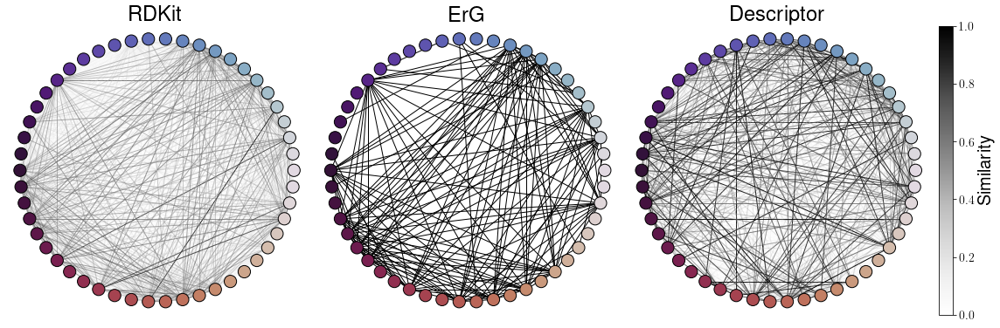

In [200]:
#fps_adj = (qm9["SMILES"].iloc[:50],DataStructs.FingerprintSimilarity)

freesolv_rdkit = RBF(5)(np.array(fingerprints["FreeSolv"]["RDKit"][0][:50]))
freesolv_erg   = RBF(0.05)(np.array(fingerprints["FreeSolv"]["ErG"][0][:200]))
freesolv_desc  = RBF(20)(np.array(fingerprints["FreeSolv"]["Descriptor"][0][:200]))
this_cmap = sns.color_palette("crest_r", as_cmap=True)


new_smiles = [smile.replace("#","\#") for smile in smiles] # Used to ensure that Latex can process the strings.

fig, axs = plt.subplots(1,4,figsize=(16,5.33), gridspec_kw={'width_ratios' : [5.25,5.25,5.25,0.25]})

for adjacency, ax, title in zip([freesolv_rdkit,freesolv_erg ,freesolv_desc],
                                [(0),(1),(2)],
                                ["RDKit","ErG", "Descriptor"]):
    
    plot_adj(adjacency[:50,:50], pos=nx.circular_layout,ax=axs[ax],title=title,node_size=200,node_cmap=matplotlib.cm.get_cmap('twilight'))

cmap = mpl.cm.Greys
norm = mpl.colors.Normalize(vmin=0, vmax=1)
    
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),cax=axs[3], orientation='vertical')    
cbar.set_label("Similarity",size=20,x=2.5)
cbar.ax.tick_params(labelsize=14)

#gs2 = axs[1,0].get_gridspec()
#for ax in axs[1,:]:
#    ax.remove()

#axbig = fig.add_subplot(gs2[1, :])
#color_range = np.linspace(0,1,len(smiles))
#node_cmap=matplotlib.cm.get_cmap('Spectral')

#for i, coord in enumerate(np.concatenate([xx.reshape(-1,1), yy.reshape(-1,1)],axis=1)):
#    coord = coord * 0.1
#    axbig.annotate(f"{new_smiles[i]}",xy=(coord[0]+0.05,1-(coord[1]+0.25)),fontsize=14)
#    axbig.add_artist(mpl.patches.Ellipse((coord[0]+0.035,1-(coord[1]+0.225)),edgecolor="k",width=0.0125,height=0.075,facecolor=node_cmap(color_range[i]),linewidth=1))

#axbig.set_ylim(0.325,0.825)   
#plt.axis('off')    
    
fig.tight_layout(h_pad=0)
save("Graph_Visualisation_Linear_Alternate.pdf",sub_dir=sub_dir)
plt.show()

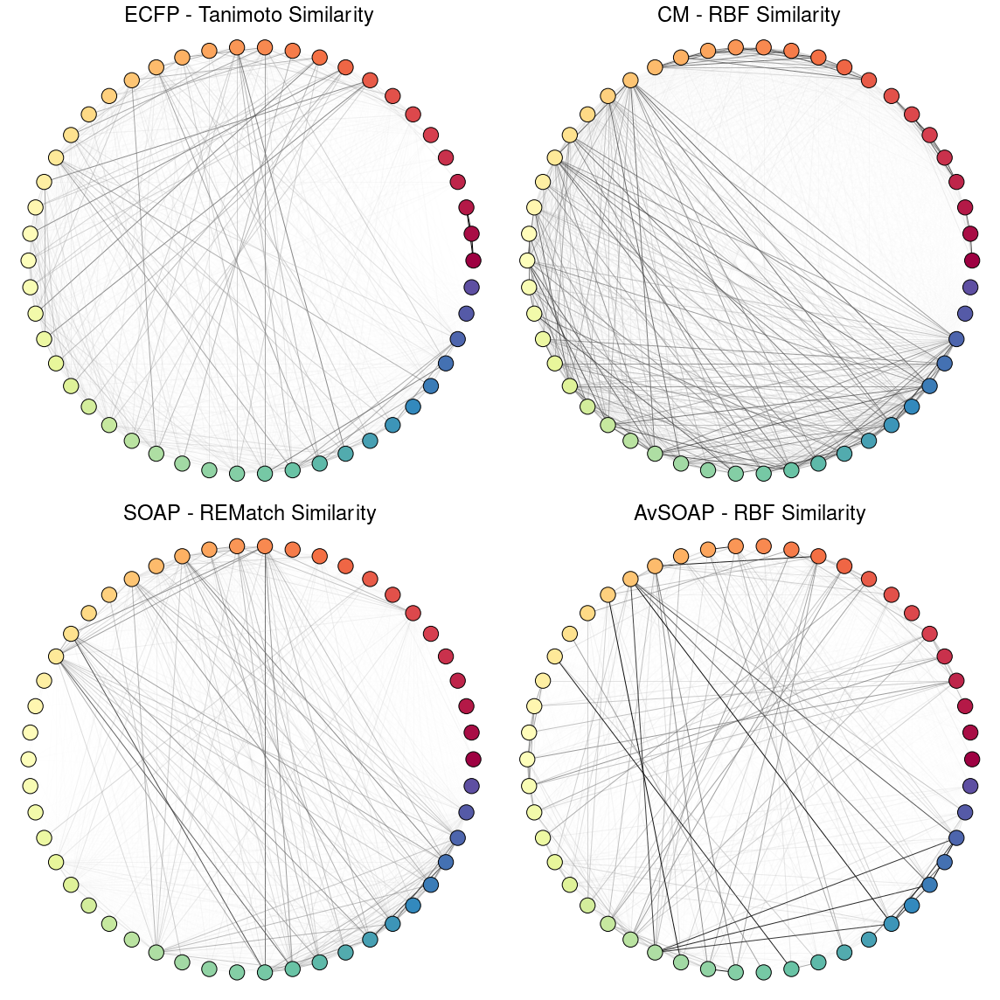

In [291]:
fps_adj = adj(fps[:50],f)

fig, axs = plt.subplots(2,2,figsize=(16,16))
for adjacency, ax, title in zip([fps_adj,cm_adj,re_kernel,avsoap_adj],[(0,0),(0,1),(1,0),(1,1)],["ECFP - Tanimoto Similarity","CM - RBF Similarity", "SOAP - REMatch Similarity","AvSOAP - RBF Similarity"]):
    plot_adj(adjacency[:50,:50], pos=nx.circular_layout,ax=axs[ax],title=title)

fig.tight_layout()
save("Graph_Visualisation.pdf",sub_dir=sub_dir)
plt.show()

# Signal Decomposition Tutorial

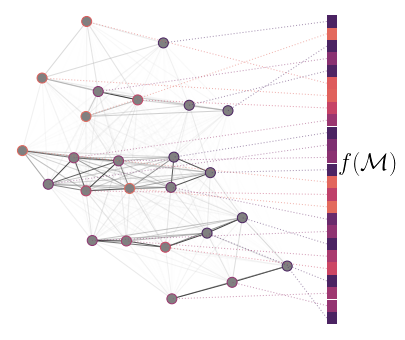

In [73]:
from sklearn.preprocessing import MinMaxScaler

cm_mols = qm9_cm_mols[:250]

# Loading Positions
#with open('adj25_visualisation.pickle', 'wb') as handle:
#    pickle.dump(pos, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('obj/adj25_visualisation.pickle', 'rb') as handle:
    adj25 = pickle.load(handle)

sub_dir = "Signal_Decomposition"

RBF_kernel = RBF(40) #599 ZPVE
cm_adj = RBF_kernel(cm_mols)

pos = adj25

signal = qm9.iloc[:150]["Dipole Moment"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))

fig, ax = plt.subplots(1,1,figsize=(6,6))

sns_cmap = sns.color_palette("flare_r", as_cmap=True)

height = 0.0825

vals = scaled_signal[:25]
vectors = np.linspace(-1,1,len(vals))
for i,(node,p) in enumerate(pos.items()):
    ax.plot((0.75,p[0]),(vectors[i],p[1]),'-',alpha=0.5,dashes=(1,2),linewidth=1,c=sns_cmap(vals[i])[0])
    ax.add_artist(mpl.patches.Rectangle((0.75,vectors[i]-(height/2)),height=height,width=0.04,facecolor=sns_cmap(vals[i])[0]))

ax.annotate(r"$f(\mathcal{M})$",(0.8,0.),fontsize=24)
    
plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=None,ax=ax,border_edge_cmap=sns_cmap(vals.flatten()),width=1)

#plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=sns_cmap,ax=ax[1],signal=vals.flatten())

save("Spring_CM_Signal_Projection.svg",sub_dir=sub_dir,dpi=300)
plt.show()

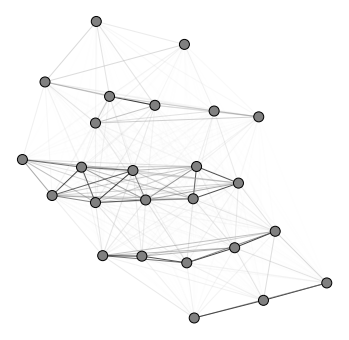

In [71]:
from sklearn.preprocessing import MinMaxScaler

cm_mols = qm9_cm_mols[:250]

# Loading Positions
#with open('adj25_visualisation.pickle', 'wb') as handle:
#    pickle.dump(pos, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('obj/adj25_visualisation.pickle', 'rb') as handle:
    adj25 = pickle.load(handle)

sub_dir = "Signal_Decomposition"

RBF_kernel = RBF(40) #599 ZPVE
cm_adj = RBF_kernel(cm_mols)

pos = adj25

signal = qm9.iloc[:150]["Dipole Moment"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))

fig, ax = plt.subplots(1,1,figsize=(6,6))

sns_cmap = sns.color_palette("flare_r", as_cmap=True)

height = 0.0825

vals = scaled_signal[:25]
vectors = np.linspace(-1,1,len(vals))
#for i,(node,p) in enumerate(pos.items()):
#    ax.plot((0.75,p[0]),(vectors[i],p[1]),'-',alpha=0.5,dashes=(1,2),linewidth=1,c=sns_cmap(vals[i])[0])
#    ax.add_artist(mpl.patches.Rectangle((0.75,vectors[i]-(height/2)),height=height,width=0.04,facecolor=sns_cmap(vals[i])[0]))

#ax.annotate(r"$f(\mathcal{M})$",(0.8,0.),fontsize=24)
    
plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=None,ax=ax)#,border_edge_cmap=sns_cmap(vals.flatten()),width=1)

#plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=sns_cmap,ax=ax[1],signal=vals.flatten())

save("Spring_CM_Signal_Blank.svg",sub_dir=sub_dir)
plt.show()

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


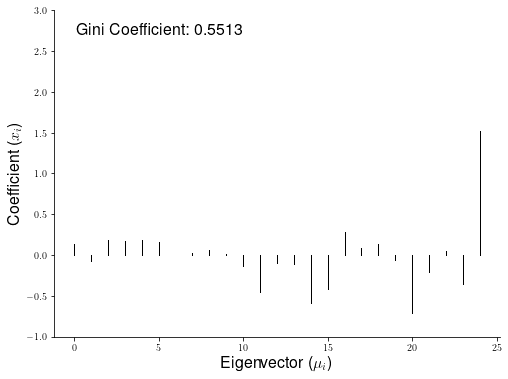

In [87]:
signal_plot(gft(fourier(RBF(100)(cm_adj[:25,:25])),vals),ylim=(-1,3))
save("Signal_Decomposition.svg",sub_dir=sub_dir)

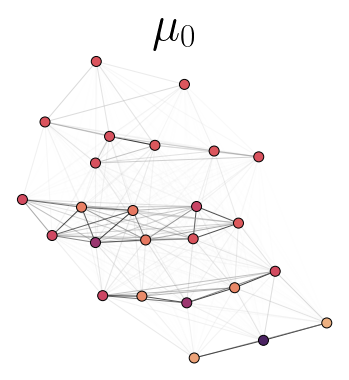

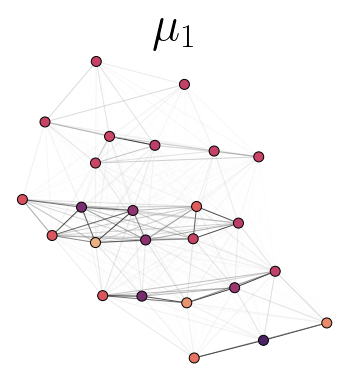

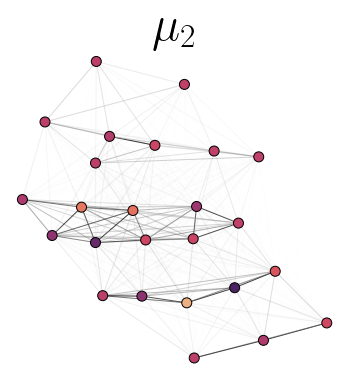

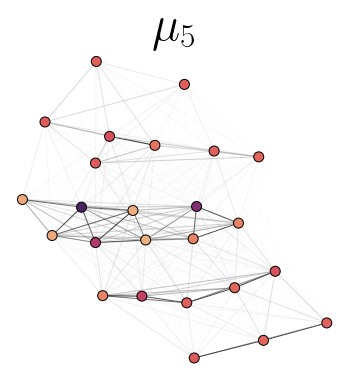

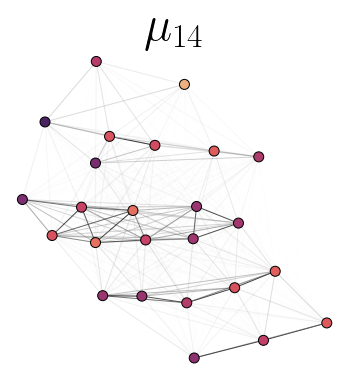

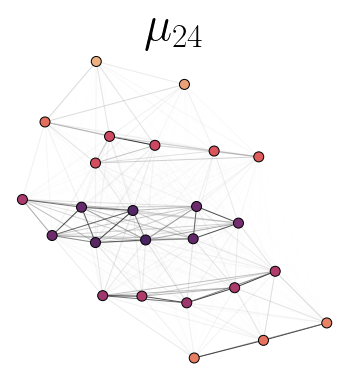

In [85]:
# Visualizing the eigenfunctions
q = fourier(cm_adj[:25,:25])

for i in [5,14,24]:
    scaler = MinMaxScaler()
    coeffs = scaler.fit_transform(q[:,i].reshape(-1,1))
    fig, ax = plt.subplots(1,1,figsize=(6,6))
    plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=sns_cmap,signal=coeffs.flatten(),ax=ax)
    ax.set_title(r"$\mu_{%i}$" % (i),fontsize=48)
    save(f"eig_{i}.svg",sub_dir=sub_dir)

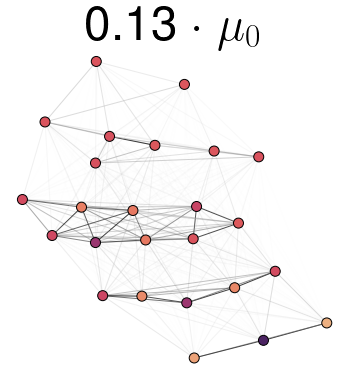

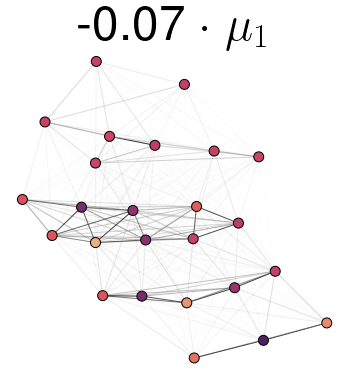

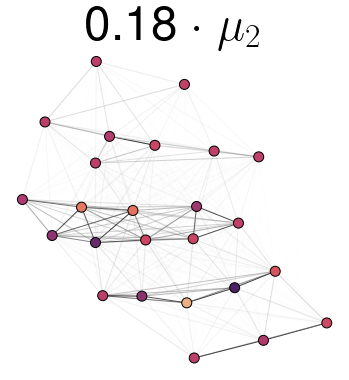

In [107]:
# Visualizing the eigenfunctions
q = fourier(cm_adj[:25,:25])

for i in [0,1,2]:
    scaler = MinMaxScaler()
    coeffs = scaler.fit_transform(q[:,i].reshape(-1,1))
    fig, ax = plt.subplots(1,1,figsize=(6,6))
    coefficients = gft(fourier(RBF(100)(cm_adj[:25,:25])),vals)
    plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=sns_cmap,signal=coeffs.flatten(),ax=ax)
    ax.set_title(r"%.2f $\cdot$ $\mu_{%i}$" % (coefficients[i],i),fontsize=48)
    save(f"eig_{i}.svg",sub_dir=sub_dir)

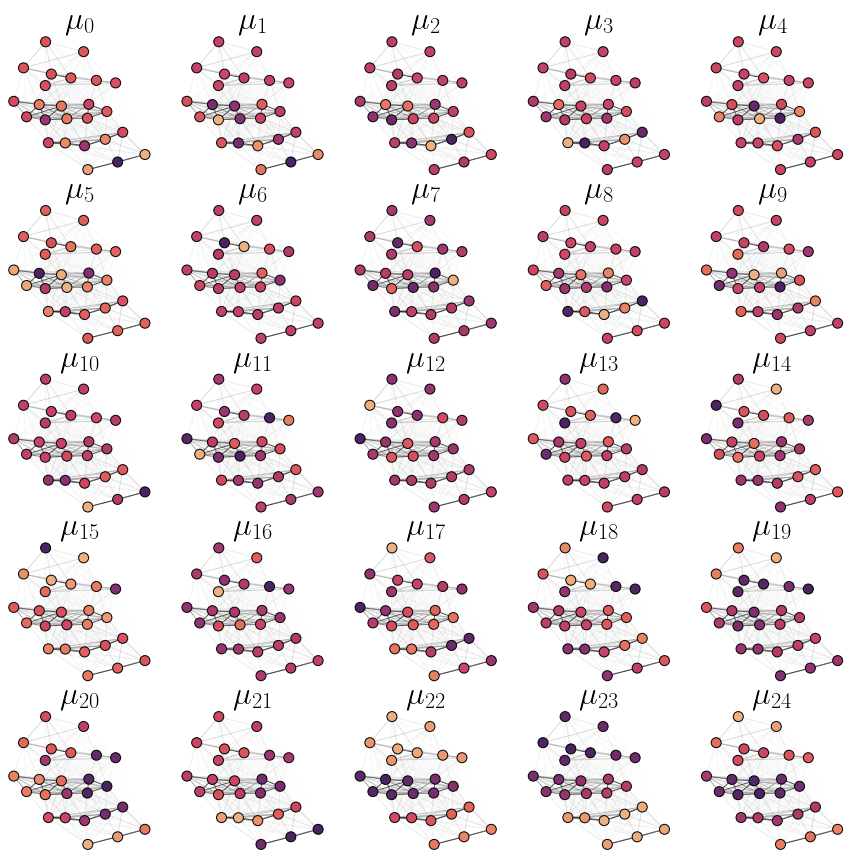

In [110]:
sub_dir = "Signal_Decomposition"

q, vals = fourier(cm_adj[:25,:25],return_vals=True)

fig, axs = plt.subplots(5,5,figsize=(15,15))

for i in [0,1,2,3,4]:
    for j in [0,1,2,3,4]:
        scaler = MinMaxScaler()
        coeffs = scaler.fit_transform(q[:,i*5+j].reshape(-1,1))
        plot_adj(cm_adj[:25,:25], pos=pos,node_size=100,node_cmap=sns_cmap,ax=axs[i,j],signal=coeffs.flatten())
        axs[i,j].set_title(r"$\mu_{%i}$ - {%.2f}" % (i*5+j, vals[i]),fontsize=32)

save("25_adj_eigs.pdf",sub_dir=sub_dir)

In [111]:
scaler = MinMaxScaler()
eig = scaler.fit_transform(q[:,10].reshape(-1,1))
#plot_adj(cm_adj[:50,:50], pos=nx.spring_layout,node_size=100,node_cmap=sns_cmap,signal=eig.flatten())

# Bigger Graphs

[[0.         0.         0.         1.        ]
 [0.11835448 0.11835448 0.11835448 1.        ]
 [0.44844291 0.44844291 0.44844291 1.        ]
 ...
 [0.         0.         0.         1.        ]
 [0.77088812 0.77088812 0.77088812 1.        ]
 [0.         0.         0.         1.        ]]
[[0.         0.         0.         1.        ]
 [0.11835448 0.11835448 0.11835448 0.88164552]
 [0.44844291 0.44844291 0.44844291 0.55155709]
 ...
 [0.         0.         0.         1.        ]
 [0.77088812 0.77088812 0.77088812 0.22911188]
 [0.         0.         0.         1.        ]]


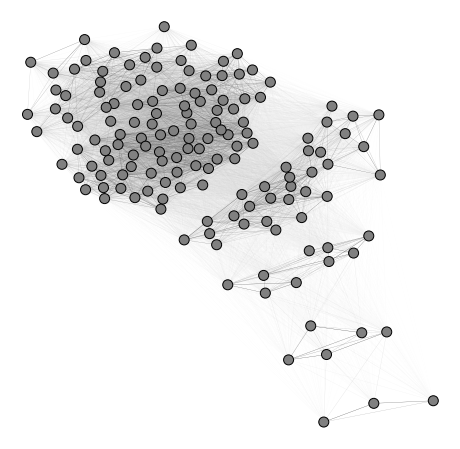

In [49]:
from sklearn.preprocessing import MinMaxScaler

#with open('adj150.pickle', 'wb') as handle:
#    pickle.dump(adj150_pos, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('obj/adj150.pickle', 'rb') as handle:
    adj150_pos = pickle.load(handle)
    
sub_dir = "Signal_Comparison"

ax = plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=None,width=0.25)
save("Spring_CM_Grey_New.pdf",sub_dir=sub_dir)

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)
/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)
/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested se

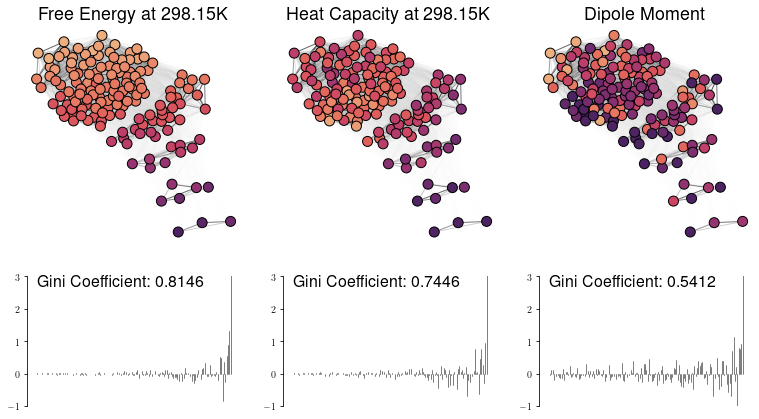

In [69]:
with open('obj/adj150.pickle', 'rb') as handle:
    adj150_pos = pickle.load(handle)

RBF_kernel = RBF(0.25) #599 ZPVE
cm_adj = RBF_kernel(qm9_cm_mols[:250])

fig, axs = plt.subplots(2,3,figsize=(3.25*4,1.75*4),gridspec_kw={'height_ratios' : [5,3]})

signal = qm9_subset.iloc[:150]["Free Energy at 298.15K"].to_numpy()*(-1)
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
sns_cmap = sns.color_palette("flare_r", as_cmap=True)
plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,),ax=axs[0,0],title="Free Energy at 298.15K",titlefontsize=18)
save("Spring_CM_FreeEn.svg")

signal_plot(gft(fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=gini,ax=axs[1,0],linewidth=0.5,axlabels=False)
axs[1,0].tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
save("Spring_CM_FreeEn_Signal.svg")

signal = qm9_subset.iloc[:150]["Heat Capacity at 298.15K"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
sns_cmap = sns.color_palette("flare_r", as_cmap=True)
plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,),ax=axs[0,1],title="Heat Capacity at 298.15K",titlefontsize=18)

signal_plot(gft(fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=gini,ax=axs[1,1],linewidth=0.5,axlabels=False)
axs[1,1].tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

signal = qm9_subset.iloc[:150]["Dipole Moment"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
sns_cmap = sns.color_palette("flare_r", as_cmap=True)
ax = plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,),ax=axs[0,2],title="Dipole Moment",titlefontsize=18)
save("Spring_CM_DipMom.svg")

signal_plot(gft(fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=gini,ax=axs[1,2],linewidth=0.5,axlabels=False)
axs[1,2].tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
save("Spring_CM_Combined_Signals_TOC.pdf",sub_dir=sub_dir)

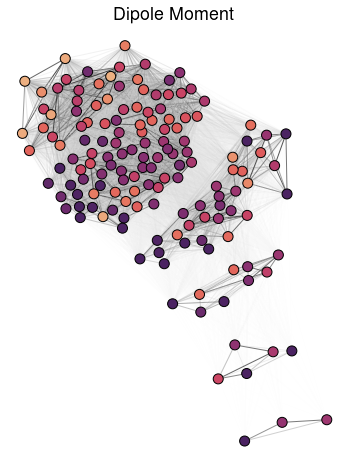

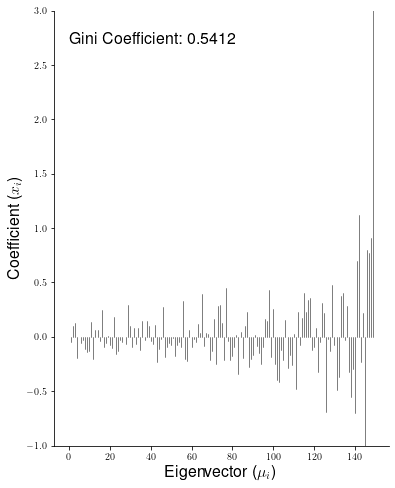

In [80]:
ax = plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,),title="Dipole Moment",titlefontsize=18,figsize=(6,8))
save("Spring_CM_DipMom.svg")
save("Spring_CM_DipMom.png",dpi=200)

signal_plot(gft(fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right'],gini=gini,linewidth=0.5,figsize=(6,8))
save("Signal_CM_DipMOM.svg")

# GPR on Coordinate Representations

## QM9 GPR

In [420]:
import math
import torch
import gpytorch
from sklearn.metrics import r2_score
from scipy.stats import spearmanr

In [409]:
qm9_props_complete = list(qm9_subset)[2:17]
qm9_props_complete

['Rotational Constant A',
 'Rotational Constant B',
 'Rotational Constant C',
 'Dipole Moment',
 'Isotropic Polarizability',
 'Energy of HOMO',
 'Energy of LUMO',
 'HOMO-LUMO Gap',
 'Electronic Spatial Extent',
 'ZPVE',
 'Internal Energy at 0K',
 'Internal Energy at 298.15K',
 'Enthalpy at 298.15K',
 'Free Energy at 298.15K',
 'Heat Capacity at 298.15K']

In [12]:
results = pd.DataFrame({"Props" : qm9_props_complete,
                        "CM" : np.zeros(len(qm9_props_complete)),
                        "AvSOAP" : np.zeros(len(qm9_props_complete)),
                        "MBTR" : np.zeros(len(qm9_props_complete))})
results.set_index("Props",inplace=True)

kernel_lengths = pd.DataFrame({"Props" : qm9_props_complete,
                        "CM" : np.zeros(len(qm9_props_complete)),
                        "AvSOAP" : np.zeros(len(qm9_props_complete)),
                        "MBTR" : np.zeros(len(qm9_props_complete))})
kernel_lengths.set_index("Props",inplace=True)

In [16]:
training_idxs = []
testing_idxs = []

for i,seed in enumerate(range(10,15)):

    np.random.seed(seed)
    training_idxs.append(np.random.choice(len(qm9_subset), size=(11150),replace=False))
    print(training_idxs[i])
    testing_idxs.append(np.setdiff1d(np.arange(len(qm9_subset)), training_idxs[i]))
    print(testing_idxs[i])

[14136 16106  6611 ...  4965  4026  7208]
[    1     2     3 ... 22279 22286 22288]
[19455  8140 11425 ... 14787 14803 11570]
[    2     5     7 ... 22285 22288 22289]
[15935  2021  9934 ... 14652  2182 18249]
[    1     5     9 ... 22282 22286 22290]
[ 8156  3210  4290 ...  5868  6287 22001]
[    0     1     2 ... 22288 22289 22290]
[ 4812  2279  2159 ... 10288  7232  3620]
[    2     6     9 ... 22286 22288 22290]


In [13]:
inverse=False

np.random.seed(10)
if inverse == False:
    train_idxs = np.random.choice(len(qm9_subset), size=(11150),replace=False)
    train_idxs
    test_idxs = np.setdiff1d(np.arange(len(qm9_subset)), train_idxs)
    test_idxs

else:
    test_idxs = np.random.choice(len(qm9_subset), size=(11150),replace=False)
    train_idxs = np.setdiff1d(np.arange(len(qm9_subset)), test_idxs)
    
train_idxs

array([14136, 16106,  6611, ...,  4965,  4026,  7208])

In [14]:
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel())

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

In [32]:
# Recompute the GP with non-inverse true.

In [16]:
#results = pd.read_csv("QM9_Complete_Results_Normalized_Inverse.csv",index_col="Props")

from sklearn.preprocessing import StandardScaler

qm9_reps = {"CM" : qm9_cm_mols,
            "AvSOAP" : qm9_avsoap_mols,
            "MBTR" : qm9_mbtr_mols}

for name,representation in qm9_reps.items():
    for prop in tqdm.tqdm(qm9_props_complete,position=0, leave=True):
        #if name == "CM":
        #    if prop in results.index[:12]:
        #        continue
        
        if results[name][prop] != 0:
            print(f"{name} - {prop} already done")
            continue
            
        print(f"{name} - {prop} computing")

        
        train_x = torch.Tensor(representation[train_idxs])
        test_x = torch.Tensor(representation[test_idxs])
        
        # Get the signal of interest and normalize it.
        y = qm9_subset[prop].to_numpy().reshape(-1,1)

        train_scaler = StandardScaler()
        train_scaler.fit(y[train_idxs])

        train_y = torch.Tensor(train_scaler.transform(y[train_idxs]).flatten())
        test_y  = torch.Tensor(train_scaler.transform(y[test_idxs]).flatten())
        
        # Setup training parameters
        training_iter = 30

        # We will use the simplest form of GP model, exact inference
        # initialize likelihood and model
        likelihood = gpytorch.likelihoods.GaussianLikelihood()
        model = ExactGPModel(train_x, train_y, likelihood)

        hypers = {
            'covar_module.base_kernel.lengthscale': torch.tensor(0.5),
        }

        model.initialize(**hypers)

        # Find optimal model hyperparameters
        model.train()
        likelihood.train()

        # Use the adam optimizer
        optimizer = torch.optim.Adam(model.parameters(), lr=0.1)  # Includes GaussianLikelihood parameters

        # "Loss" for GPs - the marginal log likelihood
        mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

        for i in range(training_iter):
            # Zero gradients from previous iteration
            optimizer.zero_grad()
            # Output from model
            output = model(train_x)
            
            # Calc loss and backprop gradients
            loss = -mll(output, train_y)
            loss.backward()
            optimizer.step()

        model.eval()
        likelihood.eval()

        with torch.no_grad(), gpytorch.settings.fast_pred_var():
            observed_pred = likelihood(model(test_x))

        results[name][prop] = r2_score(test_y.numpy(), observed_pred.mean.numpy())
        print(results)
        results.to_csv("QM9_Complete_Results_NormalizedNoLeak.csv")
        
        #kernel_lengths[name][prop] = float(model.covar_module.base_kernel.raw_lengthscale[0])
        
        torch.save(model.state_dict(), f"GPR_Models/{name}_{prop.replace(' ','_')}_NoLeak.pth")
        

  0%|                                                                        | 0/15 [00:00<?, ?it/s]

CM - Rotational Constant A computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
  7%|████▎                                                           | 1/15 [01:36<22:34, 96.72s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.000000     0.0   0.0
Rotational Constant C       0.000000     0.0   0.0
Dipole Moment               0.000000     0.0   0.0
Isotropic Polarizability    0.000000     0.0   0.0
Energy of HOMO              0.000000     0.0   0.0
Energy of LUMO              0.000000     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Rotational Constant B computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 13%|████████▌                                                       | 2/15 [02:59<19:07, 88.27s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.000000     0.0   0.0
Dipole Moment               0.000000     0.0   0.0
Isotropic Polarizability    0.000000     0.0   0.0
Energy of HOMO              0.000000     0.0   0.0
Energy of LUMO              0.000000     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Rotational Constant C computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 20%|████████████▊                                                   | 3/15 [04:21<17:05, 85.49s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.000000     0.0   0.0
Isotropic Polarizability    0.000000     0.0   0.0
Energy of HOMO              0.000000     0.0   0.0
Energy of LUMO              0.000000     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Dipole Moment computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 27%|█████████████████                                               | 4/15 [05:51<16:00, 87.29s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.000000     0.0   0.0
Energy of HOMO              0.000000     0.0   0.0
Energy of LUMO              0.000000     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Isotropic Polarizability computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 33%|█████████████████████▎                                          | 5/15 [07:09<14:00, 84.02s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.000000     0.0   0.0
Energy of LUMO              0.000000     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Energy of HOMO computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 40%|█████████████████████████▌                                      | 6/15 [08:42<13:03, 87.01s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.000000     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Energy of LUMO computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 47%|█████████████████████████████▊                                  | 7/15 [10:06<11:27, 85.98s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.000000     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - HOMO-LUMO Gap computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 53%|██████████████████████████████████▏                             | 8/15 [11:36<10:10, 87.26s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.000000     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Electronic Spatial Extent computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 60%|██████████████████████████████████████▍                         | 9/15 [12:56<08:30, 85.05s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.000000     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - ZPVE computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 67%|██████████████████████████████████████████                     | 10/15 [14:15<06:55, 83.09s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.996301     0.0   0.0
Internal Energy at 0K       0.000000     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Internal Energy at 0K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 73%|██████████████████████████████████████████████▏                | 11/15 [15:36<05:30, 82.66s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.996301     0.0   0.0
Internal Energy at 0K       0.986677     0.0   0.0
Internal Energy at 298.15K  0.000000     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Internal Energy at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 80%|██████████████████████████████████████████████████▍            | 12/15 [16:56<04:05, 81.81s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.996301     0.0   0.0
Internal Energy at 0K       0.986677     0.0   0.0
Internal Energy at 298.15K  0.986718     0.0   0.0
Enthalpy at 298.15K         0.000000     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Enthalpy at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 87%|██████████████████████████████████████████████████████▌        | 13/15 [18:14<02:41, 80.51s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.996301     0.0   0.0
Internal Energy at 0K       0.986677     0.0   0.0
Internal Energy at 298.15K  0.986718     0.0   0.0
Enthalpy at 298.15K         0.986696     0.0   0.0
Free Energy at 298.15K      0.000000     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Free Energy at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 93%|██████████████████████████████████████████████████████████▊    | 14/15 [19:33<01:20, 80.14s/it]

                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.996301     0.0   0.0
Internal Energy at 0K       0.986677     0.0   0.0
Internal Energy at 298.15K  0.986718     0.0   0.0
Enthalpy at 298.15K         0.986696     0.0   0.0
Free Energy at 298.15K      0.986651     0.0   0.0
Heat Capacity at 298.15K    0.000000     0.0   0.0
CM - Heat Capacity at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
100%|███████████████████████████████████████████████████████████████| 15/15 [20:54<00:00, 83.66s/it]


                                  CM  AvSOAP  MBTR
Props                                             
Rotational Constant A      -0.000097     0.0   0.0
Rotational Constant B       0.577638     0.0   0.0
Rotational Constant C       0.770526     0.0   0.0
Dipole Moment               0.551685     0.0   0.0
Isotropic Polarizability    0.962716     0.0   0.0
Energy of HOMO              0.684645     0.0   0.0
Energy of LUMO              0.843298     0.0   0.0
HOMO-LUMO Gap               0.775327     0.0   0.0
Electronic Spatial Extent   0.972976     0.0   0.0
ZPVE                        0.996301     0.0   0.0
Internal Energy at 0K       0.986677     0.0   0.0
Internal Energy at 298.15K  0.986718     0.0   0.0
Enthalpy at 298.15K         0.986696     0.0   0.0
Free Energy at 298.15K      0.986651     0.0   0.0
Heat Capacity at 298.15K    0.976998     0.0   0.0


  0%|                                                                        | 0/15 [00:00<?, ?it/s]

AvSOAP - Rotational Constant A computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
  7%|████▏                                                          | 1/15 [03:03<42:49, 183.55s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.000000   0.0
Rotational Constant C       0.770526  0.000000   0.0
Dipole Moment               0.551685  0.000000   0.0
Isotropic Polarizability    0.962716  0.000000   0.0
Energy of HOMO              0.684645  0.000000   0.0
Energy of LUMO              0.843298  0.000000   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Rotational Constant B computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 13%|████████▍                                                      | 2/15 [05:40<36:23, 167.96s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.000000   0.0
Dipole Moment               0.551685  0.000000   0.0
Isotropic Polarizability    0.962716  0.000000   0.0
Energy of HOMO              0.684645  0.000000   0.0
Energy of LUMO              0.843298  0.000000   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Rotational Constant C computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 20%|████████████▌                                                  | 3/15 [08:05<31:27, 157.27s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.000000   0.0
Isotropic Polarizability    0.962716  0.000000   0.0
Energy of HOMO              0.684645  0.000000   0.0
Energy of LUMO              0.843298  0.000000   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Dipole Moment computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 27%|████████████████▊                                              | 4/15 [11:06<30:34, 166.73s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.000000   0.0
Energy of HOMO              0.684645  0.000000   0.0
Energy of LUMO              0.843298  0.000000   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Isotropic Polarizability computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 33%|█████████████████████                                          | 5/15 [13:15<25:31, 153.18s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.000000   0.0
Energy of LUMO              0.843298  0.000000   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Energy of HOMO computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 40%|█████████████████████████▏                                     | 6/15 [16:16<24:22, 162.49s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.000000   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Energy of LUMO computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 47%|█████████████████████████████▍                                 | 7/15 [19:23<22:44, 170.53s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.000000   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - HOMO-LUMO Gap computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 53%|█████████████████████████████████▌                             | 8/15 [22:25<20:18, 174.14s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.000000   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Electronic Spatial Extent computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 60%|█████████████████████████████████████▊                         | 9/15 [24:46<16:24, 164.02s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.000000   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - ZPVE computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 67%|█████████████████████████████████████████▎                    | 10/15 [26:54<12:43, 152.73s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.995887   0.0
Internal Energy at 0K       0.986677  0.000000   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Internal Energy at 0K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 73%|█████████████████████████████████████████████▍                | 11/15 [29:01<09:39, 144.87s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.995887   0.0
Internal Energy at 0K       0.986677  0.987028   0.0
Internal Energy at 298.15K  0.986718  0.000000   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Internal Energy at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 80%|█████████████████████████████████████████████████▌            | 12/15 [31:09<06:58, 139.64s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.995887   0.0
Internal Energy at 0K       0.986677  0.987028   0.0
Internal Energy at 298.15K  0.986718  0.987278   0.0
Enthalpy at 298.15K         0.986696  0.000000   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Enthalpy at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 87%|█████████████████████████████████████████████████████▋        | 13/15 [33:15<04:31, 135.68s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.995887   0.0
Internal Energy at 0K       0.986677  0.987028   0.0
Internal Energy at 298.15K  0.986718  0.987278   0.0
Enthalpy at 298.15K         0.986696  0.987255   0.0
Free Energy at 298.15K      0.986651  0.000000   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Free Energy at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 93%|█████████████████████████████████████████████████████████▊    | 14/15 [35:22<02:13, 133.17s/it]

                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.995887   0.0
Internal Energy at 0K       0.986677  0.987028   0.0
Internal Energy at 298.15K  0.986718  0.987278   0.0
Enthalpy at 298.15K         0.986696  0.987255   0.0
Free Energy at 298.15K      0.986651  0.987245   0.0
Heat Capacity at 298.15K    0.976998  0.000000   0.0
AvSOAP - Heat Capacity at 298.15K computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
100%|██████████████████████████████████████████████████████████████| 15/15 [37:31<00:00, 150.12s/it]


                                  CM    AvSOAP  MBTR
Props                                               
Rotational Constant A      -0.000097 -0.000173   0.0
Rotational Constant B       0.577638  0.062854   0.0
Rotational Constant C       0.770526  0.132353   0.0
Dipole Moment               0.551685  0.655186   0.0
Isotropic Polarizability    0.962716  0.973026   0.0
Energy of HOMO              0.684645  0.782782   0.0
Energy of LUMO              0.843298  0.857479   0.0
HOMO-LUMO Gap               0.775327  0.799719   0.0
Electronic Spatial Extent   0.972976  0.966159   0.0
ZPVE                        0.996301  0.995887   0.0
Internal Energy at 0K       0.986677  0.987028   0.0
Internal Energy at 298.15K  0.986718  0.987278   0.0
Enthalpy at 298.15K         0.986696  0.987255   0.0
Free Energy at 298.15K      0.986651  0.987245   0.0
Heat Capacity at 298.15K    0.976998  0.981885   0.0


  0%|                                                                        | 0/15 [00:00<?, ?it/s]

MBTR - Rotational Constant A computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
  7%|████▏                                                          | 1/15 [03:20<46:48, 200.60s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.000000
Rotational Constant C       0.770526  0.132353  0.000000
Dipole Moment               0.551685  0.655186  0.000000
Isotropic Polarizability    0.962716  0.973026  0.000000
Energy of HOMO              0.684645  0.782782  0.000000
Energy of LUMO              0.843298  0.857479  0.000000
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Rotational Constant B co

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 13%|████████▍                                                      | 2/15 [06:23<41:12, 190.19s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.000000
Dipole Moment               0.551685  0.655186  0.000000
Isotropic Polarizability    0.962716  0.973026  0.000000
Energy of HOMO              0.684645  0.782782  0.000000
Energy of LUMO              0.843298  0.857479  0.000000
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Rotational Constant C co

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 20%|████████████▌                                                  | 3/15 [09:26<37:24, 187.03s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.000000
Isotropic Polarizability    0.962716  0.973026  0.000000
Energy of HOMO              0.684645  0.782782  0.000000
Energy of LUMO              0.843298  0.857479  0.000000
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Dipole Moment computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 27%|████████████████▊                                              | 4/15 [12:54<35:48, 195.32s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.000000
Energy of HOMO              0.684645  0.782782  0.000000
Energy of LUMO              0.843298  0.857479  0.000000
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Isotropic Polarizability

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 33%|█████████████████████                                          | 5/15 [15:38<30:40, 184.01s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.000000
Energy of LUMO              0.843298  0.857479  0.000000
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Energy of HOMO computing

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 40%|█████████████████████████▏                                     | 6/15 [18:51<28:02, 186.92s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.000000
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Energy of LUMO computing

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 47%|█████████████████████████████▍                                 | 7/15 [21:49<24:32, 184.02s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.000000
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - HOMO-LUMO Gap computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 53%|█████████████████████████████████▌                             | 8/15 [24:57<21:36, 185.27s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.000000
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Electronic Spatial Exten

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 60%|█████████████████████████████████████▊                         | 9/15 [27:44<17:57, 179.65s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.000000
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - ZPVE computing


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 67%|█████████████████████████████████████████▎                    | 10/15 [30:30<14:36, 175.39s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.995851
Internal Energy at 0K       0.986677  0.987028  0.000000
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Internal Energy at 0K co

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 73%|█████████████████████████████████████████████▍                | 11/15 [33:16<11:29, 172.47s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.995851
Internal Energy at 0K       0.986677  0.987028  0.987049
Internal Energy at 298.15K  0.986718  0.987278  0.000000
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Internal Energy at 298.1

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 80%|█████████████████████████████████████████████████▌            | 12/15 [36:01<08:30, 170.14s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.995851
Internal Energy at 0K       0.986677  0.987028  0.987049
Internal Energy at 298.15K  0.986718  0.987278  0.987071
Enthalpy at 298.15K         0.986696  0.987255  0.000000
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Enthalpy at 298.15K comp

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 87%|█████████████████████████████████████████████████████▋        | 13/15 [38:44<05:36, 168.19s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.995851
Internal Energy at 0K       0.986677  0.987028  0.987049
Internal Energy at 298.15K  0.986718  0.987278  0.987071
Enthalpy at 298.15K         0.986696  0.987255  0.987046
Free Energy at 298.15K      0.986651  0.987245  0.000000
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Free Energy at 298.15K c

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
 93%|█████████████████████████████████████████████████████████▊    | 14/15 [41:28<02:46, 166.83s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.995851
Internal Energy at 0K       0.986677  0.987028  0.987049
Internal Energy at 298.15K  0.986718  0.987278  0.987071
Enthalpy at 298.15K         0.986696  0.987255  0.987046
Free Energy at 298.15K      0.986651  0.987245  0.987097
Heat Capacity at 298.15K    0.976998  0.981885  0.000000
MBTR - Heat Capacity at 298.15K

/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/gpytorch/utils/linear_cg.py:234: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [1, 11].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  /tmp/pip-req-build-019a0thw/aten/src/ATen/native/Resize.cpp:23.)
  torch.sum(mul_storage, -2, keepdim=True, out=alpha)
100%|██████████████████████████████████████████████████████████████| 15/15 [44:14<00:00, 176.94s/it]

                                  CM    AvSOAP      MBTR
Props                                                   
Rotational Constant A      -0.000097 -0.000173 -0.000182
Rotational Constant B       0.577638  0.062854  0.049318
Rotational Constant C       0.770526  0.132353  0.073311
Dipole Moment               0.551685  0.655186  0.801352
Isotropic Polarizability    0.962716  0.973026  0.980122
Energy of HOMO              0.684645  0.782782  0.926834
Energy of LUMO              0.843298  0.857479  0.963129
HOMO-LUMO Gap               0.775327  0.799719  0.942646
Electronic Spatial Extent   0.972976  0.966159  0.960938
ZPVE                        0.996301  0.995887  0.995851
Internal Energy at 0K       0.986677  0.987028  0.987049
Internal Energy at 298.15K  0.986718  0.987278  0.987071
Enthalpy at 298.15K         0.986696  0.987255  0.987046
Free Energy at 298.15K      0.986651  0.987245  0.987097
Heat Capacity at 298.15K    0.976998  0.981885  0.986657


In [162]:
state_dict = torch.load('GPR_Models/model_state.pth')
model = ExactGPModel(train_x, train_y, likelihood)  # Create a new GP model

model.load_state_dict(state_dict)

<All keys matched successfully>

In [40]:
#results.to_csv("QM9_Complete_Results.csv")

In [38]:
results = pd.read_csv("QM9_Complete_Results_NormalizedNoLeak.csv",index_col="Props")
results

,CM,AvSOAP,MBTR
Props,,,
Rotational Constant A,-0.000097,-0.000173,-0.000182
Rotational Constant B,0.577638,0.062854,0.049318
Rotational Constant C,0.770526,0.132353,0.073311
Dipole Moment,0.551685,0.655186,0.801352
Isotropic Polarizability,0.962716,0.973026,0.980122
Energy of HOMO,0.684645,0.782782,0.926834
Energy of LUMO,0.843298,0.857479,0.963129
HOMO-LUMO Gap,0.775327,0.799719,0.942646
Electronic Spatial Extent,0.972976,0.966159,0.960938


In [416]:
inv_results = pd.read_csv("QM9_Complete_Results_NormalizedNoLeak_Inverse.csv",index_col="Props")
results = pd.read_csv("QM9_Complete_Results_NormalizedNoLeak.csv",index_col="Props")

av_results = pd.DataFrame({"Props" : qm9_props_complete,
                        "CM" : np.zeros(len(qm9_props_complete)),
                        "AvSOAP" : np.zeros(len(qm9_props_complete)),
                        "MBTR" : np.zeros(len(qm9_props_complete))})

av_results.set_index("Props",inplace=True)

for rep in results.keys():
    for prop in results[rep].keys():
        av_results[rep][prop] = np.mean([df[rep][prop] for df in [results,inv_results]])

In [39]:
qm9_reps = {"CM" : qm9_cm_mols,
            "AvSOAP" : qm9_avsoap_mols,
            "MBTR" : qm9_mbtr_mols}

In [19]:
test = np.copy(qm9_subset["Rotational Constant B"].to_numpy())
test[qm9_subset["Rotational Constant B"] > 10] = 10

gini(gft(qm9_eigenvectors[2], test))

NameError: name 'qm9_eigenvectors' is not defined

In [20]:
if not os.path.exists("Eigenvectors"):
    os.mkdir("Eigenvectors")

In [40]:
# Calculate the eigenvectors for each representation using a unit Radial basis function

print("Calculating QM9 - Coulomb Matrix")

path = "Eigenvectors/qm9_cm_q.npy"
if os.path.exists(path):
    qm9_cm_q = np.load(path)
else:
    qm9_cm_q = fourier(RBF(1)(qm9_cm_mols))

print("Calculating QM9 - Average SOAP")
path = "Eigenvectors/qm9_avsoap_q.npy"
if os.path.exists(path):
    qm9_avsoap_q = np.load(path)
else:
    qm9_avsoap_q = fourier(RBF(1)(qm9_avsoap_mols))

print("Calculating QM9 - Many Body Tensor Representation")
path = "Eigenvectors/qm9_mbtr_q.npy"
if os.path.exists(path):
    qm9_mbtr_q = np.load(path)
else:
    qm9_mbtr_q = fourier(RBF(1)(qm9_mbtr_mols))

Calculating QM9 - Coulomb Matrix
Calculating QM9 - Average SOAP
Calculating QM9 - Many Body Tensor Representation


In [96]:
# Calculate the eigenvectors for each representation using a unit Radial basis function

print("Calculating QM9 - Coulomb Matrix")
qm9_cm_q_train = fourier(RBF(1)(qm9_cm_mols[train_idxs]))

print("Calculating QM9 - Average SOAP")
qm9_avsoap_q_train = fourier(RBF(1)(qm9_avsoap_mols[train_idxs]))

print("Calculating QM9 - Many Body Tensor Representation")
qm9_mbtr_q_train = fourier(RBF(1)(qm9_mbtr_mols[train_idxs]))

Calculating QM9 - Coulomb Matrix
Calculating QM9 - Average SOAP
Calculating QM9 - Many Body Tensor Representation


In [101]:
print("Calculating QM9 - Coulomb Matrix")
qm9_cm_q_test = fourier(RBF(1)(qm9_cm_mols[test_idxs]))

print("Calculating QM9 - Average SOAP")
qm9_avsoap_q_test = fourier(RBF(1)(qm9_avsoap_mols[test_idxs]))

print("Calculating QM9 - Many Body Tensor Representation")
qm9_mbtr_q_test = fourier(RBF(1)(qm9_mbtr_mols[test_idxs]))

Calculating QM9 - Coulomb Matrix
Calculating QM9 - Average SOAP
Calculating QM9 - Many Body Tensor Representation


In [22]:
qm9_eigenvectors = [qm9_cm_q,qm9_avsoap_q,qm9_mbtr_q]
#qm9_eigenvectors_train = [qm9_cm_q_train,qm9_avsoap_q_train,qm9_mbtr_q_train]
#qm9_eigenvectors_test = [qm9_cm_q_test,qm9_avsoap_q_test,qm9_mbtr_q_test]

Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K


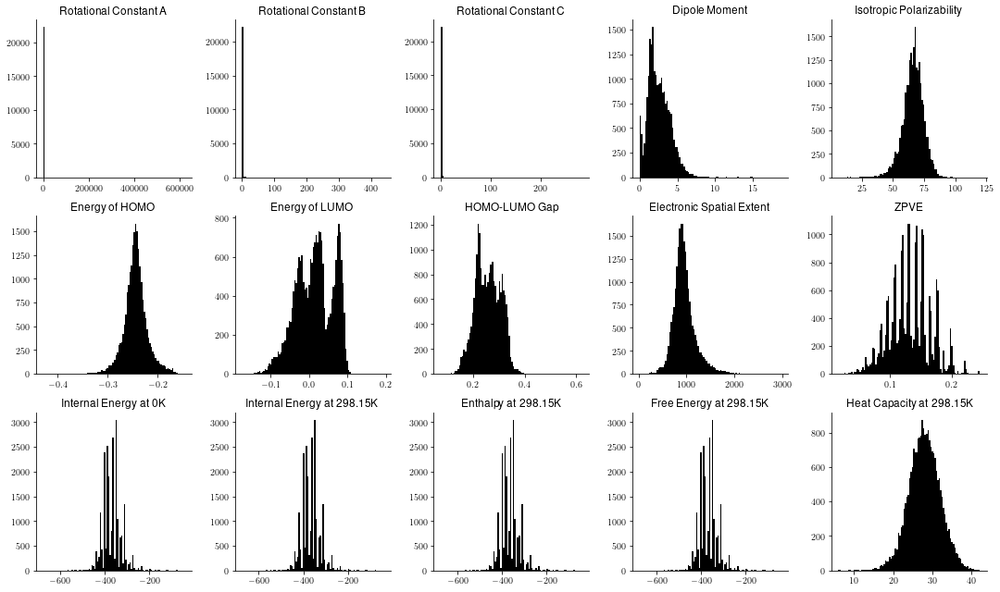

In [127]:
from sklearn.neighbors import KernelDensity

cols, rows = 5, 3
cols_height = rows_width = 3

fig, axs = plt.subplots(rows,cols,figsize=(cols*rows_width,rows*cols_height))
coords = np.arange(rows * cols).reshape(rows,cols)

for i,prop in enumerate(list(qm9_subset)[2:17]):
    print(prop)
    x,y = np.where(coords == i)
    ax = axs[x,y][0]

    ax.set_title(prop)
    ax.hist(qm9_subset[prop],bins=100,color="k")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    
fig.tight_layout()
save("QM9_Histograms.pdf",sub_dir="QM9_GPR")
    

Computing eigenterms
Eigenvectors computed
Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing Internal Energy at 298.15K
Computing Enthalpy at 298.15K
Computing Free Energy at 298.15K
Computing Heat Capacity at 298.15K
Computing eigenterms
Eigenvectors computed
Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing Internal Energy at 298.15K
Computing Enthalpy at 298.15K
Computing Free Energy at 298.15K
Computing Heat Capacity at 298.15K
Computing eigenterms

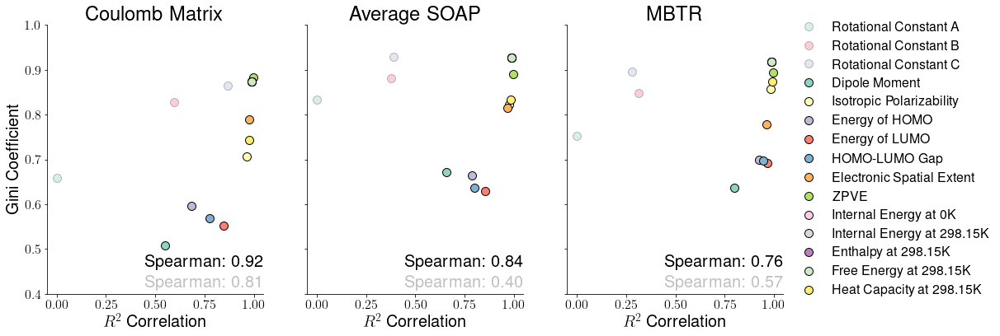

In [23]:
sub_dir = "QM9_GPR"
names = ["Coulomb Matrix","Average SOAP", "MBTR"]
colors = ['#66c2a5','#fc3d62','#8da0cb','#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd','#ccebc5','#ffed6f']

def GPR_plot(df,results,reps,kernel,eigenvectors = None, correlation="Spearman", idxs=None,correlation_func=spearmanr, overall_correlation=spearmanr):
    
    fig, axs = plt.subplots(1,3,figsize=(16,6),sharey=True,sharex=True)
    
    for i,name in enumerate(reps.keys()):
        representation = reps[name]
        ginis = []

        if idxs is None:
            idxs = np.arange(len(df))
            
        # Pre-compute the eigenvectors for the Fourier decomposition
        print("Computing eigenterms")
        if eigenvectors is not None:
            q = eigenvectors[i]
        else:
            q = fourier(kernel(representation))
        
        print("Eigenvectors computed")
        # Prepare the figure making section
        corrs = []
        
        for j,prop in enumerate(qm9_props_complete):
            # Iterate over the properties
            print(f"Computing {prop}")
            signal = normalize(df[prop].iloc[idxs].to_numpy().reshape(1,-1)).flatten()

            gini_val = gini(gft(q,signal))

            # Append the correlaion and gini values
            corrs.append(results[name][prop])
            ginis.append(gini_val)

            # Plot the correlation and gini values
            if results[name][prop] < 0:
                result = 0
            else:
                result = results[name][prop]
            if j < 3:
                axs[i].plot(result, gini_val, 'o',label=prop, markeredgecolor="k",markersize=10,color=colors[j],alpha=0.25)
            else:
                axs[i].plot(result, gini_val, 'o',label=prop, markeredgecolor="k",markersize=10,color=colors[j])
        axs[i].set_ylim(0.4,1)
        # Set labels
        axs[i].set_xlabel(f"{correlation} Correlation",fontsize=20)
        if i == 0:
            axs[i].set_ylabel("Gini Coefficient",fontsize=20)
        axs[i].annotate(f"Spearman: {overall_correlation(corrs[3:], ginis[3:])[0]:.2f}",xy=(0.45,0.1),xycoords='axes fraction',fontsize=20)
        axs[i].annotate(f"Spearman: {overall_correlation(corrs, ginis)[0]:.2f}",xy=(0.45,0.025),xycoords='axes fraction',fontsize=20,alpha=0.25)
        axs[i].set_title(names[i], fontsize=24)
        
        axs[i].tick_params(axis = 'both', which = 'major', labelsize = 16)
        
        axs[i].spines["top"].set_visible(False)
        axs[i].spines["right"].set_visible(False)

    return fig

fig = GPR_plot(qm9_subset, av_results, qm9_reps, RBF(1), eigenvectors=qm9_eigenvectors,correlation_func=r2_score,correlation=f"$R^2$",overall_correlation=spearmanr)
plt.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
save("QM9_Sparsity_Correlation_Complete_Av_NoLeak.pdf",sub_dir=sub_dir)

## Dirichlet Energy - Coordinate Representations

In [388]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def dirichlet(signal, adj, preprocess=True):
    if preprocess:
        #signal = StandardScaler().fit_transform(signal.to_numpy().reshape(-1,1))
        #signal += np.min(signal)
        #signal = signal.flatten()
        signal=normalise(signal)
    return signal.T @ adj @ signal

def normalise(x):
    return x/np.linalg.norm(x)

[[ 1.         -0.75839998]
 [-0.75839998  1.        ]]
SpearmanrResult(correlation=-0.6783216783216784, pvalue=0.0153173290532817)


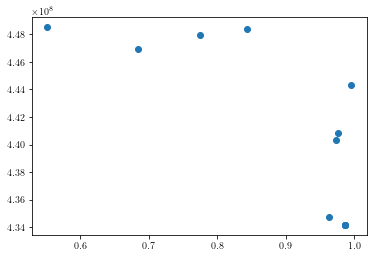

In [440]:
from scipy.stats import spearmanr
rep = "CM"
offset = 3

dirichlets = [dirichlet(qm9_subset[prop], lap(qm9_cm_adj), preprocess=True) for prop in qm9_subset.keys()[2+offset:17]]

print(np.corrcoef(results[rep][offset:], dirichlets))
print(spearmanr(results[rep][offset:], dirichlets))

plt.scatter(results[rep][offset:], dirichlets)
plt.show()

Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing Internal Energy at 298.15K
Computing Enthalpy at 298.15K
Computing Free Energy at 298.15K
Computing Heat Capacity at 298.15K
Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing Internal Energy at 298.15K
Computing Enthalpy at 298.15K
Computing Free Energy at 298.15K
Computing Heat Capacity at 298.15K
Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing 

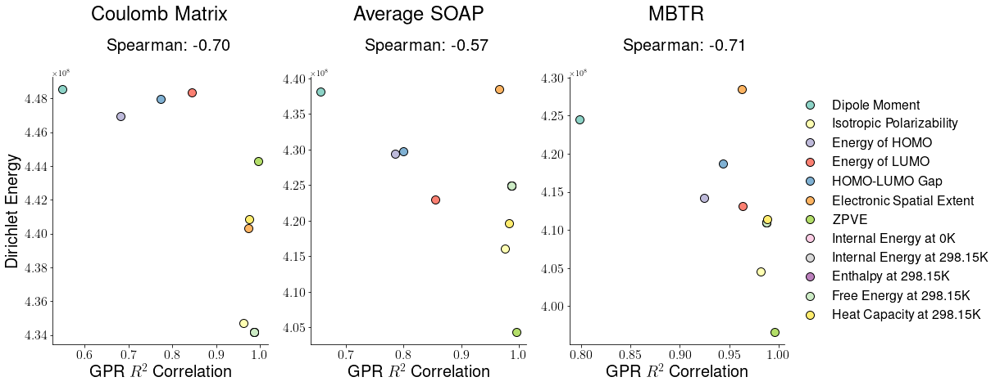

In [467]:
sub_dir = "QM9_GPR"
names = ["Coulomb Matrix","Average SOAP", "MBTR"]
colors = ['#66c2a5','#fc3d62','#8da0cb','#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd','#ccebc5','#ffed6f']

qm9_props_complete = list(qm9_subset)[2:17]
correlation=f"$R^2$"
correlation_func=r2_score
overall_correlation=spearmanr
#def GPR_plot(df,results,reps,kernel,eigenvectors = None, correlation="Spearman", idxs=None,correlation_func=spearmanr, overall_correlation=spearmanr):

fig, axs = plt.subplots(1,3,figsize=(16,6))

for i,name in enumerate(qm9_reps.keys()):
    representation = qm9_reps[name]
    dirichlets = []
    
    idxs = np.arange(len(qm9_subset))

    corrs = []

    for j,prop in enumerate(qm9_props_complete):
        # Iterate over the properties
        print(f"Computing {prop}")
        signal = qm9_subset[prop].iloc[idxs]

        dirichlet_val = dirichlet(signal,lap(qm9_adjs[name]))

        # Append the correlaion and gini values
        corrs.append(av_results[name][prop])
        dirichlets.append(dirichlet_val)

        # Plot the correlation and gini values
        if av_results[name][prop] < 0:
            result = 0
        else:
            result = av_results[name][prop]
        if j < 3:
            pass
            #axs[i].plot(result, dirichlet_val, 'o',label=prop, markeredgecolor="k",markersize=10,color=colors[j],alpha=0.25)
        else:
            axs[i].plot(result, dirichlet_val, 'o',label=prop, markeredgecolor="k",markersize=10,color=colors[j])
    # Set labels
    axs[i].set_xlabel(f"GPR {correlation} Correlation",fontsize=20)
    if i == 0:
        axs[i].set_ylabel("Dirichlet Energy",fontsize=20)
    axs[i].annotate(f"Spearman: {overall_correlation(corrs[3:], dirichlets[3:])[0]:.2f}",xy=(0.25,1.1),xycoords='axes fraction',fontsize=20)
    #axs[i].annotate(f"Spearman: {overall_correlation(corrs, dirichlets)[0]:.2f}",xy=(0.25,1.025),xycoords='axes fraction',fontsize=20,alpha=0.25)
    axs[i].set_title(names[i], fontsize=24, pad=70)

    axs[i].tick_params(axis = 'both', which = 'major', labelsize = 16)

    axs[i].spines["top"].set_visible(False)
    axs[i].spines["right"].set_visible(False)


#fig = GPR_plot(qm9_subset, av_results, qm9_reps, RBF(1), eigenvectors=qm9_eigenvectors,correlation_func=r2_score,correlation=f"$R^2$",overall_correlation=spearmanr)
plt.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
save("QM9_Sparsity_Correlation_Complete_Av_NoLeak_Dirichlet.pdf",sub_dir=sub_dir)

In [448]:
dirichlet_qm9_values = {rep : {} for rep in qm9_reps}

for i,name in enumerate(qm9_reps.keys()):
    representation = qm9_reps[name]
    dirichlets = []
    
    idxs = np.arange(len(qm9_subset))

    corrs = []

    for j,prop in enumerate(qm9_props_complete):
        # Iterate over the properties
        print(f"Computing {prop}")
        signal = qm9_subset[prop].iloc[idxs]

        dirichlet_qm9_values[name][prop] = dirichlet(signal,lap(qm9_adjs[name]))

Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing Internal Energy at 298.15K
Computing Enthalpy at 298.15K
Computing Free Energy at 298.15K
Computing Heat Capacity at 298.15K
Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing Internal Energy at 298.15K
Computing Enthalpy at 298.15K
Computing Free Energy at 298.15K
Computing Heat Capacity at 298.15K
Computing Rotational Constant A
Computing Rotational Constant B
Computing Rotational Constant C
Computing 

In [449]:
dirichlet_qm9_df = pd.DataFrame(dirichlet_qm9_values)

In [473]:
print(results.to_latex(float_format="%.3f"))

\begin{tabular}{lrrr}
\toprule
{} &     CM &  AvSOAP &   MBTR \\
Props                      &        &         &        \\
\midrule
Rotational Constant A      & -0.000 &  -0.000 & -0.000 \\
Rotational Constant B      &  0.578 &   0.063 &  0.049 \\
Rotational Constant C      &  0.771 &   0.132 &  0.073 \\
Dipole Moment              &  0.552 &   0.655 &  0.801 \\
Isotropic Polarizability   &  0.963 &   0.973 &  0.980 \\
Energy of HOMO             &  0.685 &   0.783 &  0.927 \\
Energy of LUMO             &  0.843 &   0.857 &  0.963 \\
HOMO-LUMO Gap              &  0.775 &   0.800 &  0.943 \\
Electronic Spatial Extent  &  0.973 &   0.966 &  0.961 \\
ZPVE                       &  0.996 &   0.996 &  0.996 \\
Internal Energy at 0K      &  0.987 &   0.987 &  0.987 \\
Internal Energy at 298.15K &  0.987 &   0.987 &  0.987 \\
Enthalpy at 298.15K        &  0.987 &   0.987 &  0.987 \\
Free Energy at 298.15K     &  0.987 &   0.987 &  0.987 \\
Heat Capacity at 298.15K   &  0.977 &   0.982 &  0.987 \

In [475]:
print(dirichlet_qm9_df.to_latex(float_format="%.2e"))

\begin{tabular}{lrrr}
\toprule
{} &       CM &   AvSOAP &     MBTR \\
\midrule
Rotational Constant A      & 4.08e+08 & 3.19e+08 & 2.99e+08 \\
Rotational Constant B      & 2.83e+08 & 2.72e+08 & 2.63e+08 \\
Rotational Constant C      & 2.86e+08 & 2.80e+08 & 2.72e+08 \\
Dipole Moment              & 4.49e+08 & 4.38e+08 & 4.25e+08 \\
Isotropic Polarizability   & 4.35e+08 & 4.16e+08 & 4.05e+08 \\
Energy of HOMO             & 4.47e+08 & 4.29e+08 & 4.14e+08 \\
Energy of LUMO             & 4.48e+08 & 4.23e+08 & 4.13e+08 \\
HOMO-LUMO Gap              & 4.48e+08 & 4.30e+08 & 4.19e+08 \\
Electronic Spatial Extent  & 4.40e+08 & 4.38e+08 & 4.28e+08 \\
ZPVE                       & 4.44e+08 & 4.04e+08 & 3.97e+08 \\
Internal Energy at 0K      & 4.34e+08 & 4.25e+08 & 4.11e+08 \\
Internal Energy at 298.15K & 4.34e+08 & 4.25e+08 & 4.11e+08 \\
Enthalpy at 298.15K        & 4.34e+08 & 4.25e+08 & 4.11e+08 \\
Free Energy at 298.15K     & 4.34e+08 & 4.25e+08 & 4.11e+08 \\
Heat Capacity at 298.15K   & 4.41e+08 &

In [488]:
for rep in qm9_reps:
    print(dirichlet_qm9_df.iloc[3:][rep].mean())

440729887.31310916
424886466.316895
412952014.82569915


In [ ]:
sub_dir = "QM9_GPR"
names = ["Coulomb Matrix","Average SOAP", "MBTR"]
colors = ['#66c2a5','#fc3d62','#8da0cb','#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd','#ccebc5','#ffed6f']

qm9_props_complete = list(qm9_subset)[2:17]
correlation=f"$R^2$"
correlation_func=r2_score
overall_correlation=spearmanr
#def GPR_plot(df,results,reps,kernel,eigenvectors = None, correlation="Spearman", idxs=None,correlation_func=spearmanr, overall_correlation=spearmanr):

fig, axs = plt.subplots(1,3,figsize=(16,6))

for i,name in enumerate(qm9_reps.keys()):
    representation = qm9_reps[name]
    dirichlets = []
    
    idxs = np.arange(len(qm9_subset))

    corrs = []

    for j,prop in enumerate(qm9_props_complete):
        # Iterate over the properties
        print(f"Computing {prop}")
        signal = qm9_subset[prop].iloc[idxs]

        dirichlet_val = dirichlet(signal,lap(qm9_adjs[name]))

        # Append the correlaion and gini values
        corrs.append(av_results[name][prop])
        dirichlets.append(dirichlet_val)

        # Plot the correlation and gini values
        if av_results[name][prop] < 0:
            result = 0
        else:
            result = av_results[name][prop]
        if j < 3:
            pass
            #axs[i].plot(result, dirichlet_val, 'o',label=prop, markeredgecolor="k",markersize=10,color=colors[j],alpha=0.25)
        else:
            axs[i].plot(result, dirichlet_val, 'o',label=prop, markeredgecolor="k",markersize=10,color=colors[j])
    # Set labels
    axs[i].set_xlabel(f"{correlation} Correlation",fontsize=20)
    if i == 0:
        axs[i].set_ylabel("Gini Coefficient",fontsize=20)
    axs[i].annotate(f"Spearman: {overall_correlation(corrs[3:], dirichlets[3:])[0]:.2f}",xy=(0.25,1.1),xycoords='axes fraction',fontsize=20)
    #axs[i].annotate(f"Spearman: {overall_correlation(corrs, dirichlets)[0]:.2f}",xy=(0.25,1.025),xycoords='axes fraction',fontsize=20,alpha=0.25)
    axs[i].set_title(names[i], fontsize=24, pad=70)

    axs[i].tick_params(axis = 'both', which = 'major', labelsize = 16)

    axs[i].spines["top"].set_visible(False)
    axs[i].spines["right"].set_visible(False)


#fig = GPR_plot(qm9_subset, av_results, qm9_reps, RBF(1), eigenvectors=qm9_eigenvectors,correlation_func=r2_score,correlation=f"$R^2$",overall_correlation=spearmanr)
plt.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
save("QM9_Sparsity_Correlation_Complete_Av_NoLeak_Dirichlet.pdf",sub_dir=sub_dir)

# Estimating Sparsity

In [41]:
#qm9_cm_adj     = RBF(1)(qm9_cm_mols)
qm9_cm_adj = np.load("Adjacencies/qm9_cm_adj.npy")
#qm9_avsoap_adj = RBF(1)(qm9_avsoap_mols)
qm9_avsoap_adj = np.load("Adjacencies/qm9_avsoap_adj.npy")
#qm9_mbtr_adj   = RBF(1)(qm9_mbtr_mols)
qm9_mbtr_adj = np.load("Adjacencies/qm9_mbtr_adj.npy")

In [413]:
qm9_reps = {"CM" : qm9_cm_mols,
            "AvSOAP" : qm9_avsoap_mols,
            "MBTR" : qm9_mbtr_mols}

qm9_adjs = {"CM" : qm9_cm_adj,
            "AvSOAP" : qm9_avsoap_adj,
            "MBTR" : qm9_mbtr_adj}

qm9_mols = {"CM" : qm9_cm_mols, 
            "AvSOAP" : qm9_avsoap_mols, 
            "MBTR" : qm9_mbtr_mols}

In [79]:
np.random.seed(10)
samples = 10
num_idxs_vals = [100,300,500,1000,2500,5000]#,10000]

estimations = {}

for rep_name,rep in qm9_mols.items():

    current_estimations = {}

    for prop in list(qm9_subset)[2:17]:
        if os.path.exists(f"Estimating_Sparsity/{rep_name}_{prop.replace(' ','_')}.csv"):
            estimated_sparsity = pd.read_csv(f"Estimating_Sparsity/{rep_name}_{prop.replace(' ','_')}.csv",index_col=0)
        else:
            estimated_sparsity = pd.DataFrame({key : np.zeros(samples) for key in num_idxs_vals})
       
        estimated_sparsities = []
        for instance in tqdm.tqdm(range(samples)):
            for num_idxs in num_idxs_vals:
                if estimated_sparsity[str(num_idxs)][instance] != 0:
                    estimated_sparsities.append(estimated_sparsity[str(num_idxs)][instance])
                else:
                    idxs        = np.random.choice(np.arange(len(qm9_subset)), size=(num_idxs), replace=False)
                    current_adj = RBF(1)(rep[idxs])
                    current_signal = qm9_subset[prop].iloc[idxs]
                    current_q   = fourier(current_adj)
                    current_gini = gini(gft(current_q, current_signal))
                    estimated_sparsities.append(current_gini)
                    estimated_sparsity[str(num_idxs)][instance] = current_gini
        current_estimations[prop] = estimated_sparsity
        #cm_estimation[prop] = estimated_sparsities
        #estimated_sparsity.to_csv(f"Estimating_Sparsity/{rep_name}_{prop.replace(' ','_')}.csv")
    
    estimations[rep_name] = current_estimations


100%|█████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 7037.42it/s]


Rotational Constant A


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant B


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant C


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Dipole Moment


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Isotropic Polarizability


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Energy of HOMO


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Energy of LUMO


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


HOMO-LUMO Gap


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Electronic Spatial Extent


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


ZPVE


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Internal Energy at 0K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Internal Energy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Enthalpy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Free Energy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Heat Capacity at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant A


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant B


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant C


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Dipole Moment


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Isotropic Polarizability


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


Energy of HOMO


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Energy of LUMO


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


HOMO-LUMO Gap


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Electronic Spatial Extent


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


ZPVE


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Internal Energy at 0K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Internal Energy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Enthalpy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Free Energy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Heat Capacity at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant A


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant B


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Rotational Constant C


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Dipole Moment


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Isotropic Polarizability


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Energy of HOMO


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Energy of LUMO


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


HOMO-LUMO Gap


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Electronic Spatial Extent


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


ZPVE


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Internal Energy at 0K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Internal Energy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Enthalpy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Free Energy at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Heat Capacity at 298.15K


/tmp/ipykernel_3781/2159267093.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)
/tmp/ipykernel_3781/2159267093.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


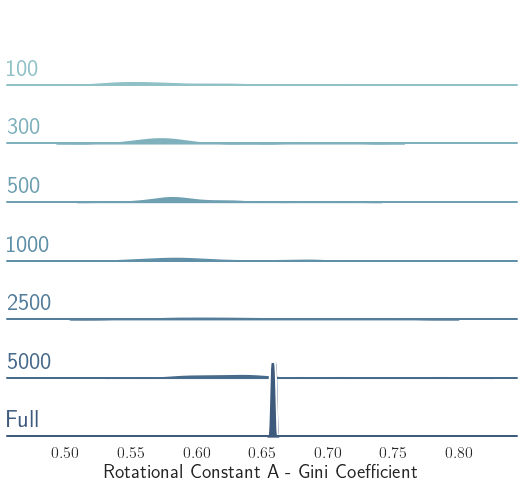

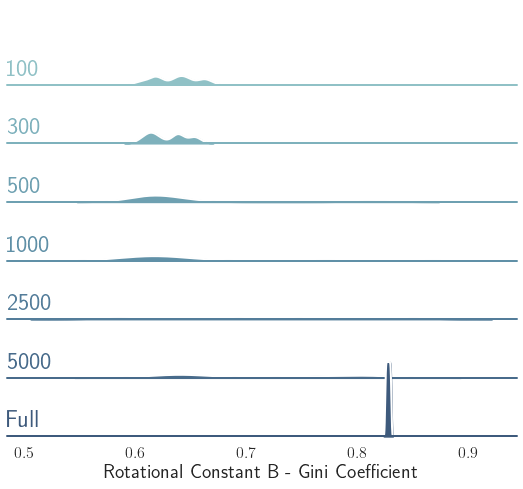

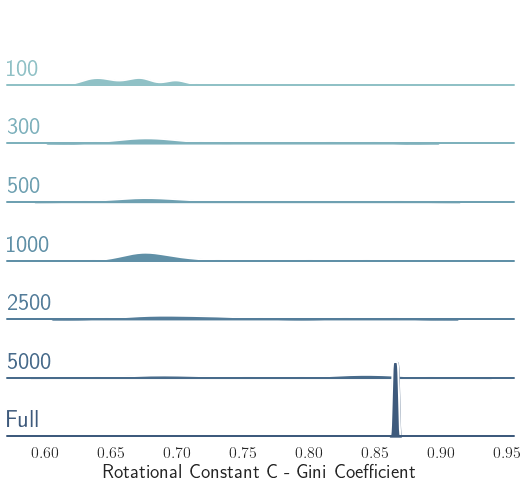

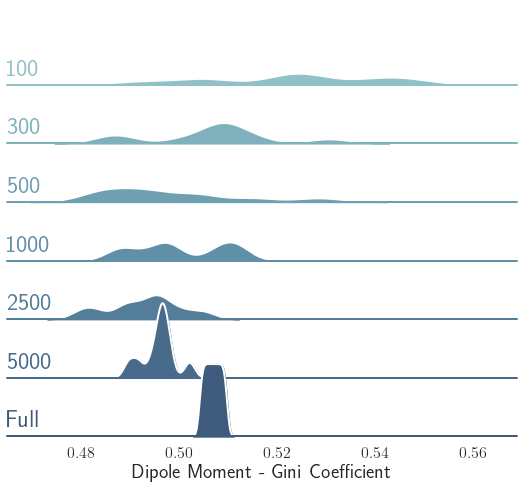

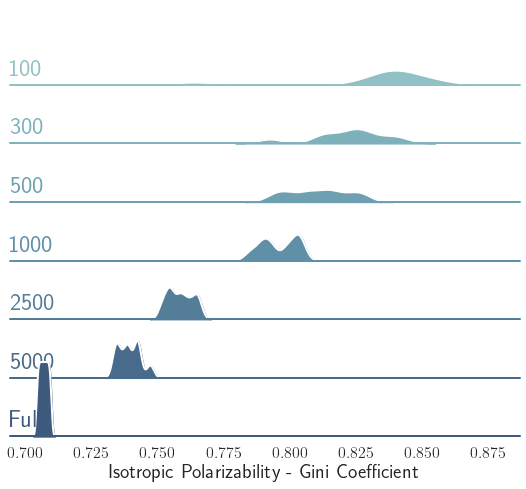

...

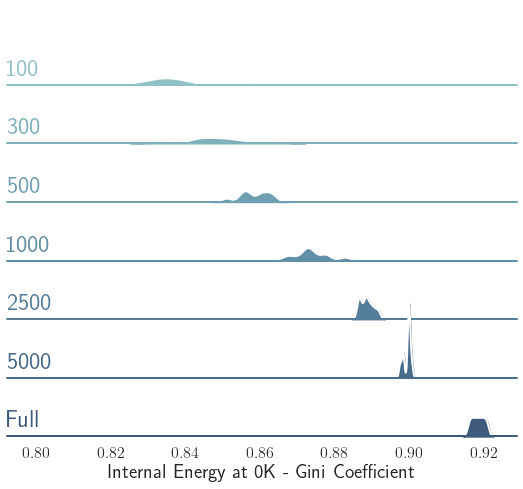

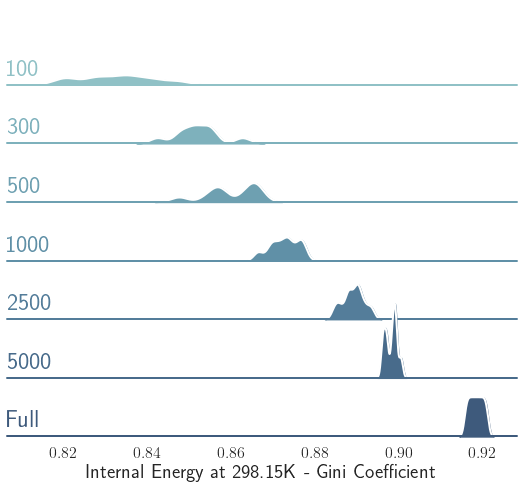

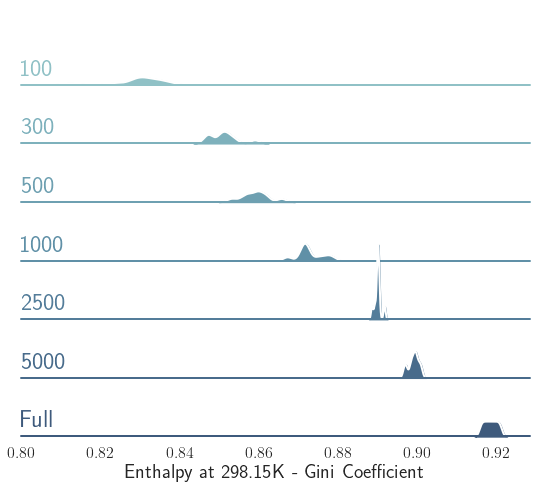

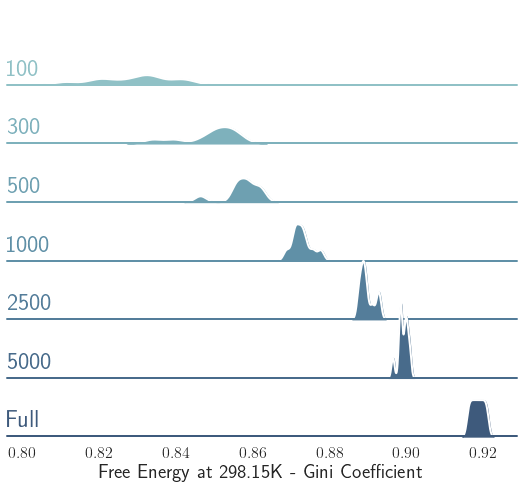

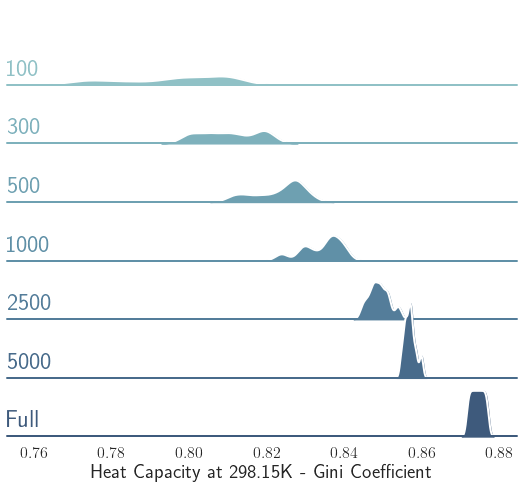

In [89]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

for rep in qm9_reps:
    for i,prop in enumerate(list(qm9_subset)[2:17]):
        print(prop)
        x = estimations[rep][prop]
        x["Full"] = np.linspace(true_sparsities[rep][i]-0.0025,true_sparsities[rep][i]+0.0025,samples)
        x = x.to_numpy().flatten()
        # Create the data
        rs = np.random.RandomState(1979)
        prop = f"{prop} - Gini Coefficient"
        #x = estimated_sparsities
        g = np.tile([str(x) for x in num_idxs_vals] + ["Full"], samples)
        df = pd.DataFrame({prop:x, "g":g})

        # Initialize the FacetGrid object
        pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
        g = sns.FacetGrid(df, row="g", hue="g", aspect=8, height=1, palette=pal)

        # Draw the densities in a few steps
        g.map(sns.kdeplot, prop,
              bw_adjust=.5, clip_on=False,
              fill=True, alpha=1, linewidth=1.5)
        g.map(sns.kdeplot, prop, clip_on=False, color="w", lw=2, bw_adjust=.5)

        # passing color=None to refline() uses the hue mapping
        g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


        # Define and use a simple function to label the plot in axes coordinates
        def label(x, color, label):
            ax = plt.gca()
            ax.text(0, .2, label, fontweight="bold", color=color,
                    ha="left", va="center", transform=ax.transAxes, size=24)

        g.map(label, prop)

        # Set the subplots to overlap
        g.figure.subplots_adjust(hspace=-.25)

        # Remove axes details that don't play well with overlap
        g.set_titles("")
        g.set(yticks=[], ylabel="")

        g.axes[-1,0].set_xlabel(prop, size=20)
        g.axes[-1,0].set_xticklabels(g.axes[-1,0].get_xticklabels(), size=16)

        g.despine(bottom=True, left=True)
        fig.tight_layout()
        save(f"{rep}_{prop.replace('.',',')}.pdf",sub_dir="Estimating_Sparsity")

In [88]:
true_sparsities = {}
for i,rep in enumerate(qm9_reps):
    true_sparsity = []
    for prop in list(qm9_subset)[2:17]:
        true_sparsity.append(gini(gft(qm9_eigenvectors[i], qm9_subset[prop])))
    true_sparsity = np.array(true_sparsity)
    true_sparsities[rep] = true_sparsity



In [377]:
titles = {"CM" : "Coulomb Matrix",
          "AvSOAP" : "Average SOAP",
          "MBTR" : "Many Body Tensor Representation"}

CM
AvSOAP
MBTR


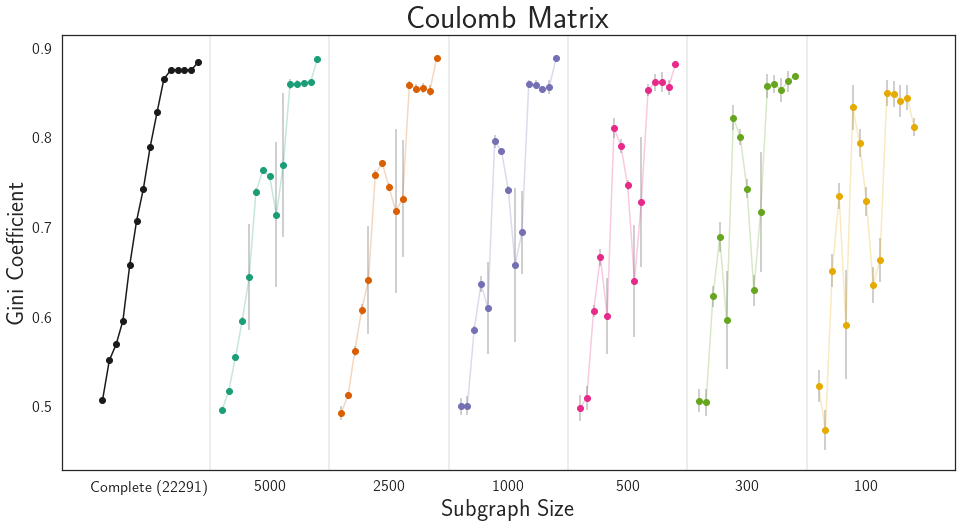

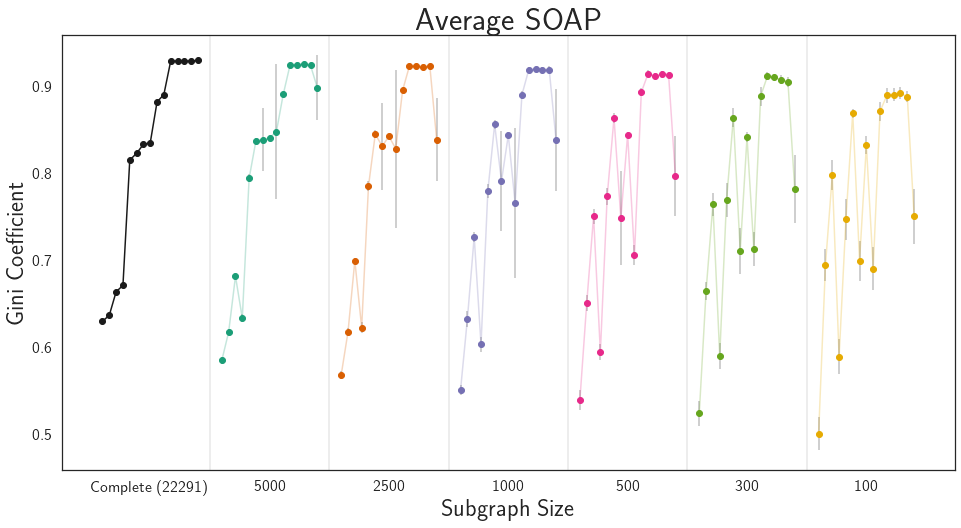

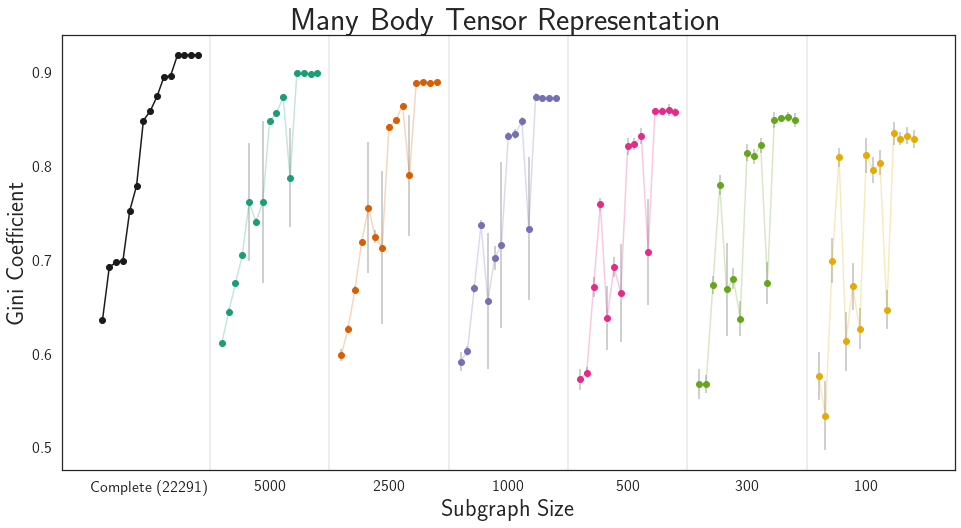

In [379]:
pds = {}
for rep in qm9_reps:
    print(rep)
    pds[rep] = {prop : pd.read_csv(f"Estimating_Sparsity/{rep}_{prop.replace(' ','_')}.csv") for prop in list(qm9_subset)[2:17]}

#colors = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462']
colors = ['#1b9e77','#d95f02','#7570b3','#e7298a','#66a61e','#e6ab02']

for rep, df in pds.items():
    fig, ax = plt.subplots(1,1,figsize=(16,8))
    true_sparsity = true_sparsities[rep]
    ax.plot([coords[x] for x in range(len(true_sparsity))], true_sparsity[np.argsort(true_sparsity)],'-o',color="k")
    for i,instance in enumerate(num_idxs_vals[::-1]):
        plt.axvline(i+0.5,color="k", alpha=0.1)
        means = np.array([df[prop][str(instance)].mean() for prop in list(qm9_subset)[2:17]])
        variances = np.array([np.sqrt(df[prop][str(instance)].var()) for prop in list(qm9_subset)[2:17]])
        ax.plot([coords[x]+(i+1) for x in range(len(true_sparsity))], means[np.argsort(true_sparsity)], alpha=0.25,c=colors[i])
        
        c = np.abs(true_sparsity - means)
        scaled = MinMaxScaler().fit_transform(c.reshape(-1,1))
        
        ax.errorbar([coords[x]+(i+1) for x in range(len(true_sparsity))], means[np.argsort(true_sparsity)], yerr=variances[np.argsort(true_sparsity)], fmt='o',c=colors[i],ecolor=(0.5,0.5,0.5,0.5))
        ax.set_xticks(range(len(num_idxs_vals)+1))
        ax.set_xticklabels(["Complete (22291)"] + num_idxs_vals[::-1],fontsize=16)
        ax.set_xlabel("Subgraph Size",fontsize=24)
        ax.set_ylabel("Gini Coefficient",fontsize=24)
        ax.set_yticks(np.linspace(0.5,0.9,5))
        ax.set_yticklabels(np.linspace(0.5,0.9,5), fontsize=16)
        ax.set_title(titles[rep],fontsize=32)
    save(f"{rep}_Estimated.pdf", sub_dir="Estimating_Sparsity")



In [148]:
for rep in qm9_reps:
    for prop in list(qm9_subset.keys())[2:17]:
        prop = f"{prop} - Gini Coefficient"
        file = f"Estimating_Sparsity/{rep}_{prop.replace('.',',')}.pdf"
        print("\\begin{figure}")
        print(f"\includegraphics[width=\\textwidth]{{Images/{file}}}")
        prop = prop.split("-")[0]
        print(f"\\caption{{Stochastic Subgraph Estimation for {rep} descriptor with {prop} property.}}")
        print(f"\\label{{fig:{rep}_{prop}}}")
        print("\\end{figure}")
        print("\n")

\begin{figure}
\includegraphics[width=\textwidth]{Images/Estimating_Sparsity/CM_Rotational Constant A - Gini Coefficient.pdf}
\caption{Stochastic Subgraph Estimation for CM descriptor with Rotational Constant A  property.}
\label{fig:CM_Rotational Constant A }
\end{figure}


\begin{figure}
\includegraphics[width=\textwidth]{Images/Estimating_Sparsity/CM_Rotational Constant B - Gini Coefficient.pdf}
\caption{Stochastic Subgraph Estimation for CM descriptor with Rotational Constant B  property.}
\label{fig:CM_Rotational Constant B }
\end{figure}


\begin{figure}
\includegraphics[width=\textwidth]{Images/Estimating_Sparsity/CM_Rotational Constant C - Gini Coefficient.pdf}
\caption{Stochastic Subgraph Estimation for CM descriptor with Rotational Constant C  property.}
\label{fig:CM_Rotational Constant C }
\end{figure}


\begin{figure}
\includegraphics[width=\textwidth]{Images/Estimating_Sparsity/CM_Dipole Moment - Gini Coefficient.pdf}
\caption{Stochastic Subgraph Estimation for CM descrip

In [143]:
file = f"Estimating_Sparsity/{rep}_{prop.replace('.',',')}.pdf"
print("\\begin{figure}")
print(f"\includegraphics[width=\\textwidth]{{Images/{file}}}")
prop = prop.split("-")[0]
print(f"\\caption{{Stochastic Subgraph Estimation for Many Body Tensor Representation descriptor with {prop} property.}}")
print(f"\\label{{fig:{rep}_{prop}}}")
print("\\end{figure}")

\begin{figure}
\includegraphics[width=	extwidth]{Images/Estimating_Sparsity/MBTR_Heat Capacity at 298,15K .pdf}
\caption{Stochastic Subgraph Estimation for Many Body Tensor Representation descriptor with Heat Capacity at 298.15K  property.}
\label{fig:MBTR_Heat Capacity at 298.15K }
\end{figure}


In [295]:
hold = pd.read_csv("Estimating_Sparsity/CM_Dipole_Moment")
hold[str(100)].mean()

0.5611565525902847

'Heat Capacity at 298.15K '

# Signal Decomposition on SMILES Regression Datasets

In [15]:
sub_dir = "SMILES/Regression/Signal_Decomposition"

def signal_decomposition_comparison(fps,kernel,signal,dset_name,prop,eigenvectors=None,rows=2,cols=2,ylim=(-5,5)):
    """ Simple helper function that generates signal plots """

    assert dset_name in fps, "Not a valid dataset name."
    assert len(fps[dset_name]) == rows * cols, "Mismatch in number of subfigs and number of representations."
        
    fig, axs = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
    coords = np.arange(rows * cols).reshape(rows,cols)
    
    for i,(name,fp) in enumerate(tqdm.tqdm(fps[dset_name].items())):
        Xs, idxs = fp
         if eigenvectors is None:    
            adjacency = kernel(Xs)
            eigenvectors  = fourier(adjacency)
            
        x,y = np.where(coords == i)
        ax = axs[x,y][0]
              
        signal_plot(gft(eigenvectors,signal.iloc[idxs]),ax=ax,ylim=ylim)
        ax.set_title(f"{name}",fontsize=18)
        
        if y == 0:
            ax.set_ylabel("Coefficient",fontsize=14)
        if x == (rows-1):
            ax.set_xlabel(f"Eigenvectors ($\mu_i$)",fontsize=14)
        
    fig.suptitle(f"{dset_name} - {prop}",fontsize=24)
    fig.tight_layout()
    
    return fig
        
#fig = signal_decomposition_comparison(fingerprints, kernel=RBF(100), ylim=(-10,10),
                                #signal=SIDER["Eye disorders"],dset_name="SIDER") # Classification
                                #signal=Clintox["CT_TOX"],dset_name="Clintox") # Classification
                                #signal=BBBP["p_np"], dset_name="BBBP") # Classification
                                #signal=BACE["pIC50"], dset_name="BACE")
                                #signal=FreeSolv["calc"],dset_name="FreeSolv")
                                #signal=ESOL["ESOL predicted log solubility in mols per litre"], dset_name="ESOL")

ylims = [(-15,15) for x in range(4)]
headings = {"ESOL" :  ["ESOL predicted log solubility in mols per litre"],
            "FreeSolv" : ["expt","calc"],
            "Lipophilicity" : ["exp"],
            "BACE" : ["pIC50"],
            "QM9" : list(qm9_subset)[2:17]}

for i,dset in enumerate(regression_dsets.items()):
    name, dataset = dset
    for prop in headings[name]:
        if name == "QM9":
            fig = signal_decomposition_comparison(fingerprints,kernel=RBF(100), ylim=ylims[i],
                                                  signal=dataset[prop], dset_name=name,prop=prop)
        else:
            fig = signal_decomposition_comparison(fingerprints,kernel=RBF(100), ylim=ylims[i],
                                              signal=dataset[prop], dset_name=name,prop=prop)
        save(f"Signal_Decomposition_{name}_{prop.split(' ')[0]}",sub_dir=sub_dir)

NameError: name 'smiles_regression_dsets' is not defined

In [40]:
qm9_fingerprint_eigenvectors = {key : fourier(RBF(10)(np.array(regression_fingerprints["QM9"][key][0]))) for key in regression_fingerprints["QM9"].keys()} 

In [239]:
headings = {"ESOL" :  ["ESOL predicted log solubility in mols per litre"],
            "FreeSolv" : ["expt","calc"],
            "Lipophilicity" : ["exp"],
            "BACE" : ["pIC50"],
            "QM9" : list(qm9_subset)[2:17]}

In [240]:
reg_prop_len = len([item for sublist in list(headings.values()) for item in sublist])

if os.path.exists("SMILES_Results/rf_regression_results.csv"):
    rf_regression_results = pd.read_csv("SMILES_Results/rf_regression_results.csv",index_col="Props")
else:
    rf_regression_results = pd.DataFrame({"Props" : [item for sublist in list(headings.values()) for item in sublist],
                            "RDKit" : np.zeros(reg_prop_len),
                            "ErG" : np.zeros(reg_prop_len),
                            "MHFP" : np.zeros(reg_prop_len),
                            "Descriptor" : np.zeros(reg_prop_len)})

    rf_regression_results.set_index("Props",inplace=True)
    
if os.path.exists("SMILES_Results/mlp_regression_results.csv"):
    mlp_regression_results = pd.read_csv("SMILES_Results/mlp_regression_results.csv",index_col="Props")
else: 
    mlp_regression_results = pd.DataFrame({"Props" : [item for sublist in list(headings.values()) for item in sublist],
                            "RDKit" : np.zeros(reg_prop_len),
                            "ErG" : np.zeros(reg_prop_len),
                            "MHFP" : np.zeros(reg_prop_len),
                            "Descriptor" : np.zeros(reg_prop_len)})    

    mlp_regression_results.set_index("Props",inplace=True)

if os.path.exists("SMILES_Results/gini_regression_results.csv"):
    gini_regression_results = pd.read_csv("SMILES_Results/gini_regression_results.csv",index_col="Props")

else:
    gini_regression_results = pd.DataFrame({"Props" : [item for sublist in list(headings.values()) for item in sublist],
                            "RDKit" : np.zeros(reg_prop_len),
                            "ErG" : np.zeros(reg_prop_len),
                            "MHFP" : np.zeros(reg_prop_len),
                            "Descriptor" : np.zeros(reg_prop_len)})    

    gini_regression_results.set_index("Props",inplace=True)

In [27]:
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

for name, dset in regression_datasets.items():
    for fp in regression_fingerprints[name].keys():

        for prop in tqdm.tqdm(headings[name]):

            X = regression_fingerprints[name][fp][0]
            y = dset[prop].to_numpy()
            
            train_scaler = 
            
            X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=random_state,train_size=0.5)
            train_normalizer = 
            
            if rf_regression_results[fp][prop] == 0:
                rf = RandomForestRegressor(random_state=random_state).fit(X_train, y_train)
                rf_regression_results[fp][prop] = rf.score(X_test, y_test)

            if mlp_regression_results[fp][prop] == 0:
                mlp = MLPRegressor(random_state=random_state, max_iter=1000).fit(X_train, y_train)
                mlp_regression_results[fp][prop] = mlp.score(X_test, y_test)
            
            rf_regression_results.to_csv("SMILES_Results/rf_regression_results.csv")
            mlp_regression_results.to_csv("SMILES_Results/mlp_regression_results.csv")

100%|██████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 295.48it/s]


In [67]:
if os.path.exists("Eigenvectors/smiles_regression.pkl"):
    print("Loading pre-existing fingerprints")
    with open('Eigenvectors/smiles_regression.pkl', 'rb') as handle:
        smiles_regression_eigenvectors = pickle.load(handle)

else:
    print("Calculating new eigenvectors")
    smiles_regression_eigenvectors = {name : {fp : fourier(RBF(10)(regression_fingerprints[name][fp][0])) for fp in tqdm.tqdm(regression_fingerprints[name].keys())} for name in regression_datasets.keys()}
    
    with open('Eigenvectors/smiles_regression.pkl', 'wb') as handle:
        pickle.dump(smiles_regression_eigenvectors, handle, protocol=pickle.HIGHEST_PROTOCOL)


Loading pre-existing fingerprints


In [68]:
for i,dset in enumerate(regression_datasets.items()):
    name, dataset = dset
    for j,fp in enumerate(regression_fingerprints[name].keys()):
        for prop in headings[name]:
            print(prop)
            gini_regression_results[fp][prop] = gini(gft(smiles_regression_eigenvectors[name][fp],normalize(dataset[prop].to_numpy().reshape(1,-1)).flatten()))
            
    gini_regression_results.to_csv("SMILES_Results/gini_regression_results.csv")

ESOL predicted log solubility in mols per litre
ESOL predicted log solubility in mols per litre
ESOL predicted log solubility in mols per litre
ESOL predicted log solubility in mols per litre
expt
calc
expt
calc
expt
calc
expt
calc
exp
exp
exp
exp
pIC50
pIC50
pIC50
pIC50
Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K
Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K
Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO

In [73]:
specific_properties = list(rf_regression_results.index)[:5] + list(rf_regression_results.index)[8:]
#del specific_properties[7]

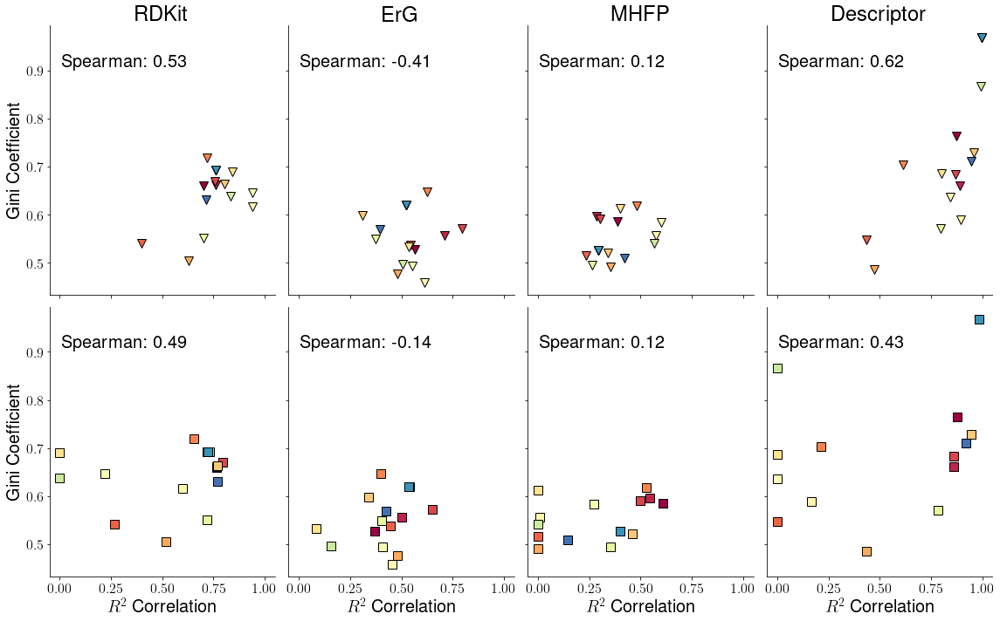

In [150]:
from scipy.stats import spearmanr
cmap = mpl.cm.get_cmap("Spectral")

sub_dir = "SMILES/Regression/Sparsity"

regression_dsets = [mlp_regression_results, rf_regression_results]

regression_colors = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3']
labels = ["ESOL", "FreeSolv - expt", "FreeSolv - calc", "Lipophilicity", "BACE"] + list(qm9_subset)[5:17]
titles = ["MLP","RF"]

fig, axs = plt.subplots(2,4,figsize=(16,10), sharex=True, sharey=True)

for i,fp in enumerate(regression_fingerprints["ESOL"].keys()):
    for j in range(2):
        for k,prop in enumerate(specific_properties):
            k_col = k / len(specific_properties)
            if j == 1:
                if mlp_regression_results[fp][prop] < 0:
                    axs[j,i].plot(0,gini_regression_results[fp][prop],'s',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
                else:
                    axs[j,i].plot(mlp_regression_results[fp][prop],gini_regression_results[fp][prop],'s',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
            else:
                if rf_regression_results[fp][prop] < 0:
                    axs[j,i].plot(0,gini_regression_results[fp][prop],'v',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
                else:
                    axs[j,i].plot(rf_regression_results[fp][prop],gini_regression_results[fp][prop],'v',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])

        if j == 1:
            axs[j,i].set_xlabel(f"$R^2$ Correlation",fontsize=20)
        if i == 0:
            axs[j,i].set_ylabel("Gini Coefficient",fontsize=20)
        if j == 1:
            axs[j,i].annotate(f"Spearman: {spearmanr(mlp_regression_results[fp],gini_regression_results[fp])[0]:.2f}",xy=(0.05,0.85),xycoords='axes fraction',fontsize=20)
        else:
            axs[j,i].annotate(f"Spearman: {spearmanr(rf_regression_results[fp],gini_regression_results[fp])[0]:.2f}",xy=(0.05,0.85),xycoords='axes fraction',fontsize=20)

        if j == 0:
            axs[j,i].set_title(list(regression_fingerprints["ESOL"].keys())[i], fontsize=24)

        if i == 3:
            pass
            #fig.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16,title_fontsize=24)
            #mlp_handles, legend_labels = axs[j,i].get_legend_handles_labels()
            #rf_handles, _ = axs[0,i].get_legend_handles_labels()
            #by_label = dict(zip(legend_labels, list(zip(rf_handles,mlp_handles))))
            #fig.legend(by_label.values(), by_label.keys(),bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
            
        axs[j,i].set_xlim(-0.05,1.05)
            
        axs[j,i].tick_params(axis = 'both', which = 'major', labelsize = 16)

        axs[j,i].spines["top"].set_visible(False)
        axs[j,i].spines["right"].set_visible(False)

fig.tight_layout()
save("Regression_Plots_NoLeg.pdf", sub_dir=sub_dir)

100%|█████████████████████████████████████████████████████████████████| 4/4 [00:09<00:00,  2.25s/it]


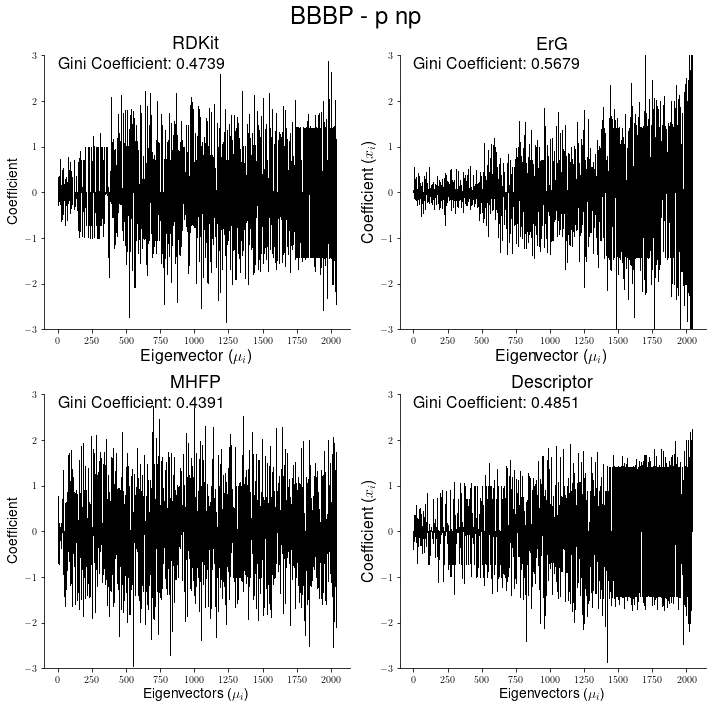

In [22]:
fig = signal_decomposition_comparison(classification_fingerprints,kernel=RBF(1), ylim=ylims[i],
                                              signal=BBBP["p_np"], dset_name="BBBP",prop="p np")
save(f"Signal_Decomposition_{name}_{prop.split(' ')[0]}",sub_dir=sub_dir)

100%|█████████████████████████████████████████████████████████████████| 4/4 [00:05<00:00,  1.37s/it]


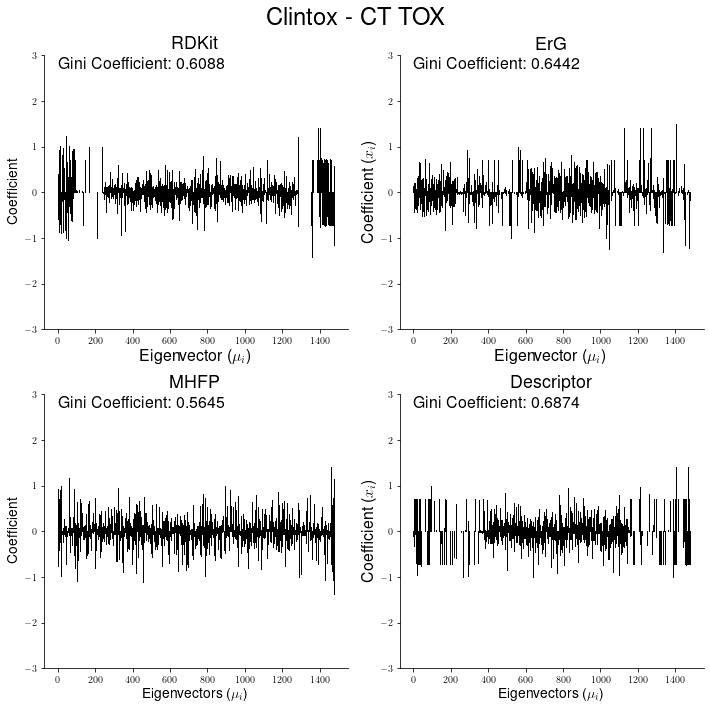

In [25]:
fig = signal_decomposition_comparison(classification_fingerprints,kernel=RBF(1), ylim=ylims[i],
                                              signal=Clintox["CT_TOX"], dset_name="Clintox",prop="CT TOX")
save(f"Signal_Decomposition_Clintox_{prop.split(' ')[0]}",sub_dir=sub_dir)

## Dirichlet Energy SMILES Regression Datasets


In [321]:
smiles_regression_adjacencies = {name : {fp : RBF(10)(regression_fingerprints[name][fp][0]) for fp in tqdm.tqdm(regression_fingerprints[name].keys())} for name in regression_datasets.keys()}

100%|████████████████████████████████████████████| 4/4 [07:51<00:00, 117.88s/it]


In [322]:
with open('Adjacencies/smiles_regression.pkl', 'wb') as handle:
        pickle.dump(smiles_regression_adjacencies, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [378]:
headings = {"ESOL" :  ["ESOL predicted log solubility in mols per litre"],
            "FreeSolv" : ["expt","calc"],
            "Lipophilicity" : ["exp"],
            "BACE" : ["pIC50"],
            "QM9" : list(qm9_subset)[2:17]}

In [430]:
dirichlet_regression_results = pd.DataFrame({"Props" : [item for sublist in list(headings.values()) for item in sublist],
                            "RDKit" : np.zeros(reg_prop_len),
                            "ErG" : np.zeros(reg_prop_len),
                            "MHFP" : np.zeros(reg_prop_len),
                            "Descriptor" : np.zeros(reg_prop_len)})    

dirichlet_regression_results.set_index("Props",inplace=True)

for i,dset in enumerate(regression_datasets.items()):
    name, dataset = dset
    for j,fp in enumerate(regression_fingerprints[name].keys()):
        for prop in headings[name]:
            print(prop)
            dirichlet_regression_results[fp][prop] = dirichlet(dataset[prop], lap(smiles_regression_adjacencies[name][fp]))
                                                              
    dirichlet_regression_results.to_csv("SMILES_Results/dirichlet_regression_results.csv")

ESOL predicted log solubility in mols per litre
ESOL predicted log solubility in mols per litre
ESOL predicted log solubility in mols per litre
ESOL predicted log solubility in mols per litre
expt
calc
expt
calc
expt
calc
expt
calc
exp
exp
exp
exp
pIC50
pIC50
pIC50
pIC50
Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K
Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K
Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO

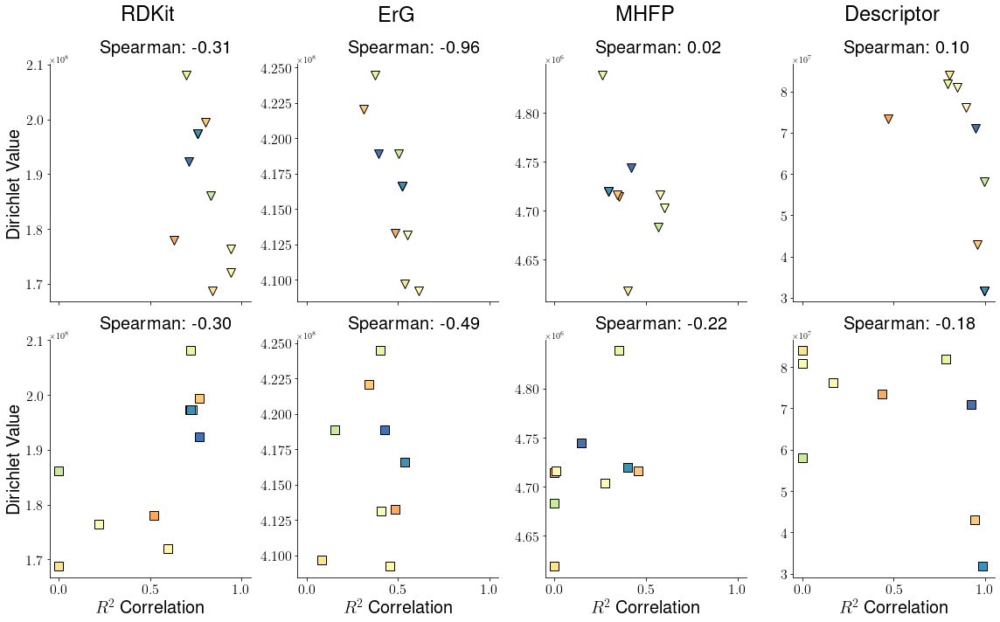

In [495]:
from scipy.stats import spearmanr
cmap = mpl.cm.get_cmap("Spectral")

sub_dir = "SMILES/Regression/Sparsity"

regression_dsets = [mlp_regression_results, rf_regression_results]

regression_colors = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3']
labels = ["ESOL", "FreeSolv - expt", "FreeSolv - calc", "Lipophilicity", "BACE"] + list(qm9_subset)[5:17]
titles = ["MLP","RF"]

fig, axs = plt.subplots(2,4,figsize=(16,10), sharex=True)

for i,fp in enumerate(regression_fingerprints["ESOL"].keys()):
    for j in range(2):
        for k,prop in enumerate(specific_properties):
            if prop in ["exp", "expt", "calc", "pIC50", "ESOL predicted log solubility in mols per litre"]:
                continue
            k_col = k / len(specific_properties)
            if j == 1:
                if mlp_regression_results[fp][prop] < 0:
                    axs[j,i].plot(0,dirichlet_regression_results[fp][prop],'s',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
                else:
                    axs[j,i].plot(mlp_regression_results[fp][prop],dirichlet_regression_results[fp][prop],'s',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
            else:
                if rf_regression_results[fp][prop] < 0:
                    axs[j,i].plot(0,dirichlet_regression_results[fp][prop],'v',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
                else:
                    axs[j,i].plot(rf_regression_results[fp][prop],dirichlet_regression_results[fp][prop],'v',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])

        if j == 1:
            axs[j,i].set_xlabel(f"$R^2$ Correlation",fontsize=20)
        if i == 0:
            axs[j,i].set_ylabel("Dirichlet Value",fontsize=20)
        if j == 1:
            axs[j,i].annotate(f"Spearman: {spearmanr(mlp_regression_results[fp],dirichlet_regression_results[fp])[0]:.2f}",xy=(0.25,1.05),xycoords='axes fraction',fontsize=20)
        else:
            axs[j,i].annotate(f"Spearman: {spearmanr(rf_regression_results[fp],dirichlet_regression_results[fp])[0]:.2f}",xy=(0.25,1.05),xycoords='axes fraction',fontsize=20)

        if j == 0:
            axs[j,i].set_title(list(regression_fingerprints["ESOL"].keys())[i], fontsize=24, pad=50)

        if i == 3:
            pass
            #fig.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16,title_fontsize=24)
            #mlp_handles, legend_labels = axs[j,i].get_legend_handles_labels()
            #rf_handles, _ = axs[0,i].get_legend_handles_labels()
            #by_label = dict(zip(legend_labels, list(zip(rf_handles,mlp_handles))))
            #fig.legend(by_label.values(), by_label.keys(),bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
            
        axs[j,i].set_xlim(-0.05,1.05)
            
        axs[j,i].tick_params(axis = 'both', which = 'major', labelsize = 16)

        axs[j,i].spines["top"].set_visible(False)
        axs[j,i].spines["right"].set_visible(False)

plt.tight_layout()
fig.tight_layout()
save("Regression_Plots_NoLeg_Dirichlet.pdf", sub_dir=sub_dir)

In [320]:
signal = BACE["pIC50"]

print(dirichlet(signal, qm9_fingerprint_adj["RDKit"]))
print(dirichlet(signal, qm9_fingerprint_adj["ErG"]))
print(dirichlet(signal, qm9_fingerprint_adj["MHFP"]))
dirichlet(signal, qm9_fingerprint_adj["Descriptor"])

[[13854.14304881]]
[[33620.44584294]]
[[3488.84069659]]


array([[8986.88803852]])

# Signal Decomposition on SMILES Classification

100%|█████████████████████████████████████████████████████████████████| 4/4 [00:05<00:00,  1.32s/it]
/tmp/ipykernel_7197/236887189.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
100%|█████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.70s/it]


RuntimeError: latex was not able to process the following string:
b'BBBP - p_np'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.20 (TeX Live 2019/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/adam/.cache/matplotlib/tex.cache/848d9f3321b1b59e8cf7392feb7da43d.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texmf/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/helvet.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 848d9f3321b1b59e8cf7392feb7da43d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.19 {\sffamily BBBP - p_
                         np}
No pages of output.
Transcript written on 848d9f3321b1b59e8cf7392feb7da43d.log.




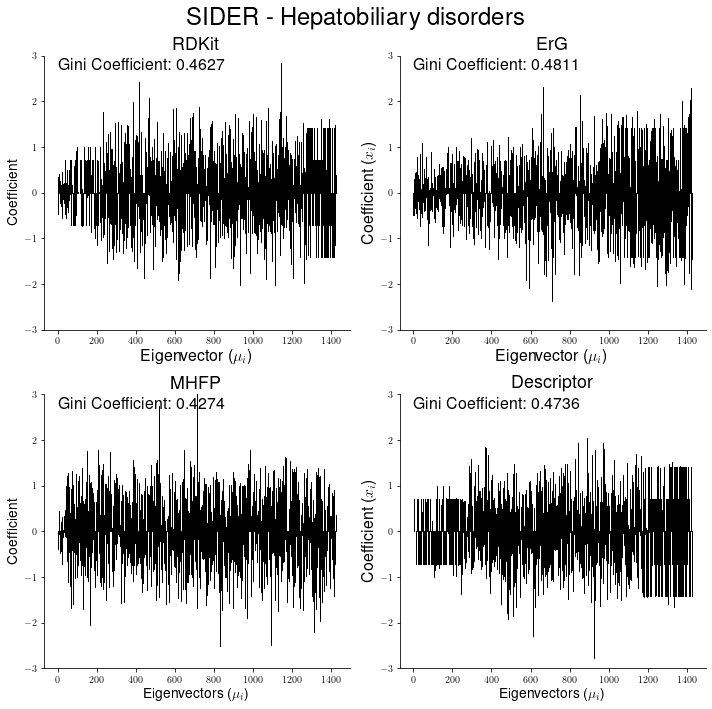

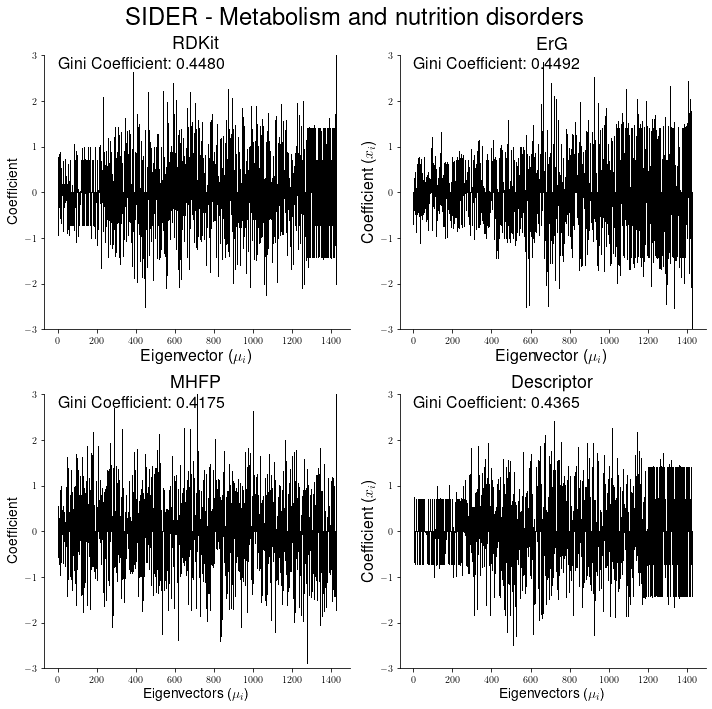

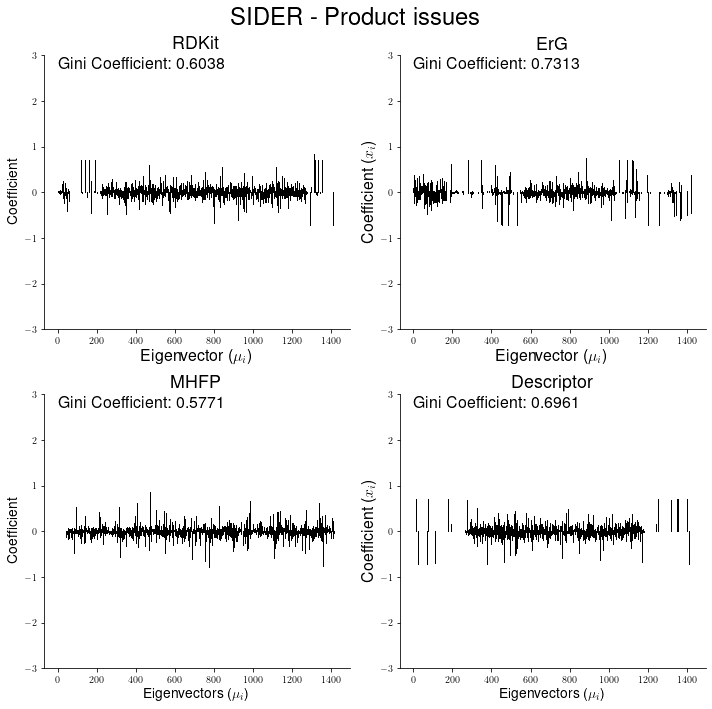

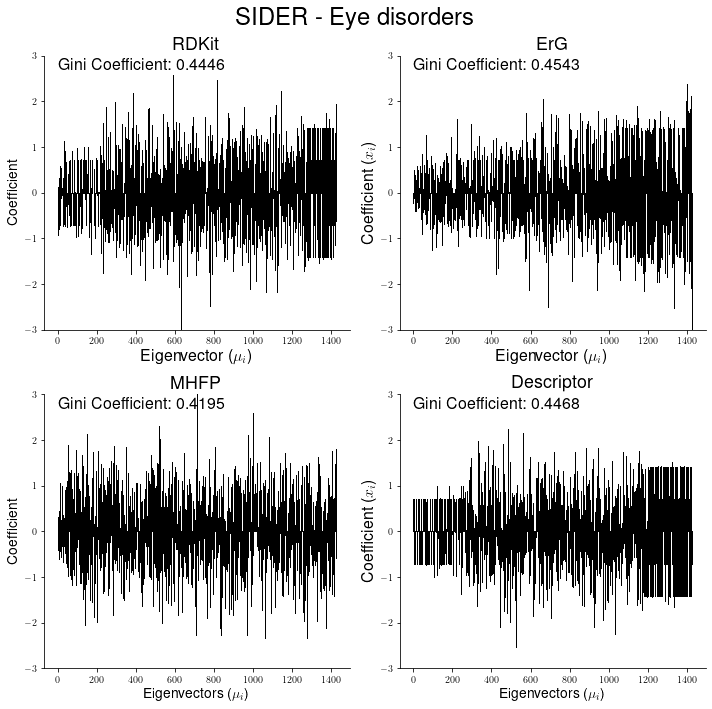

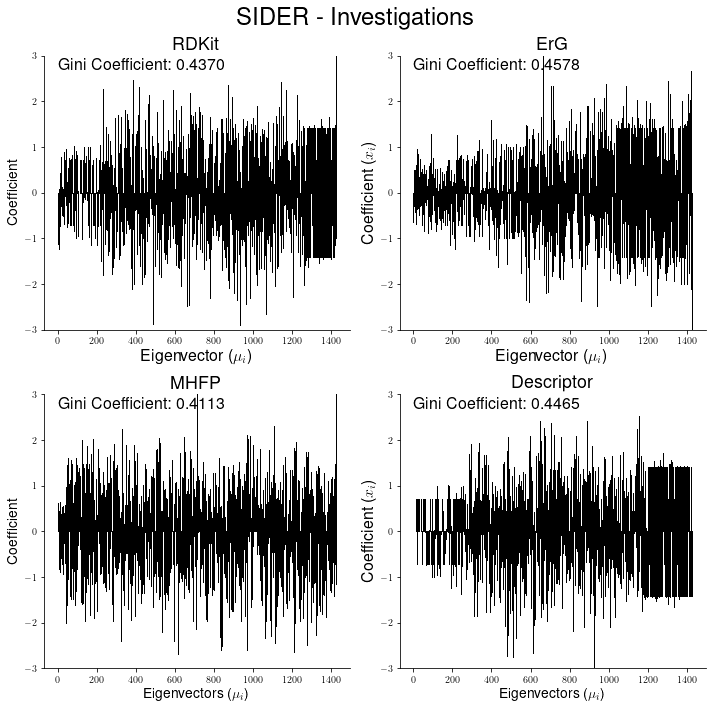

...

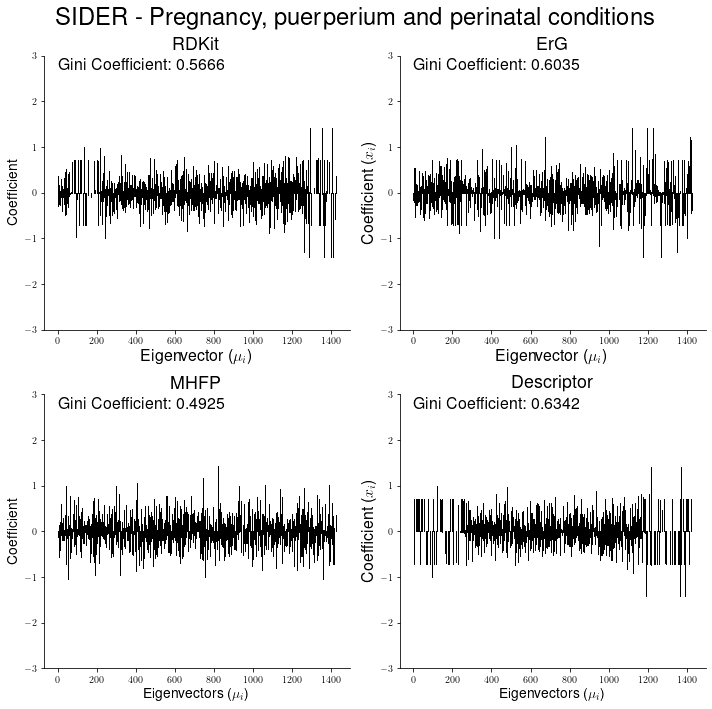

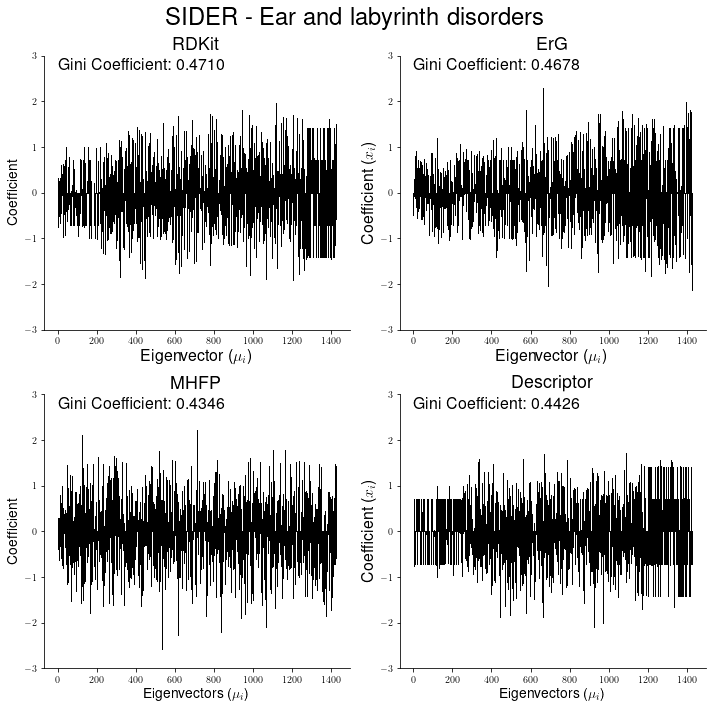

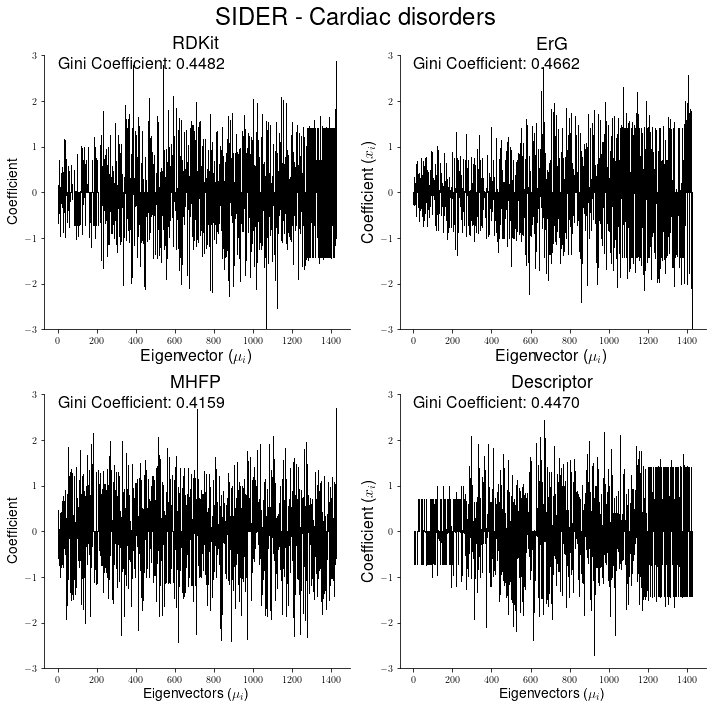

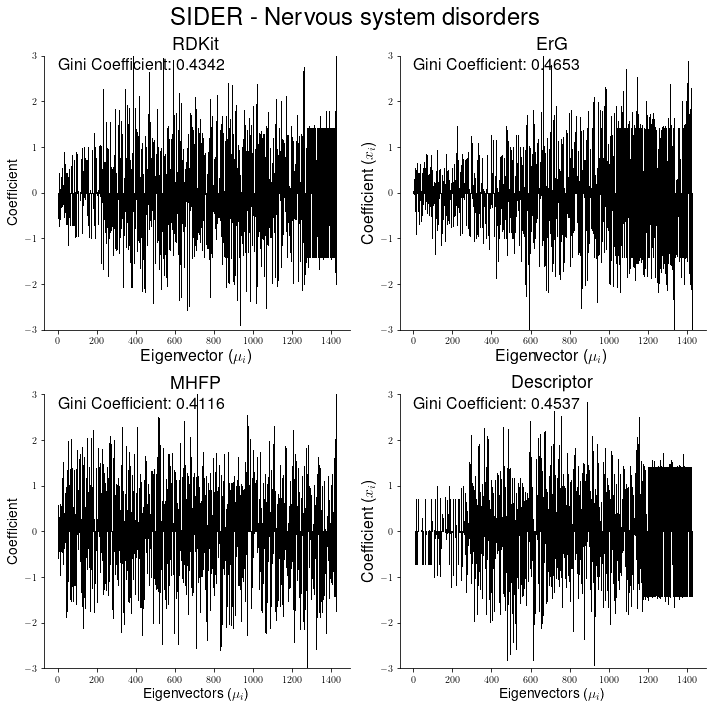

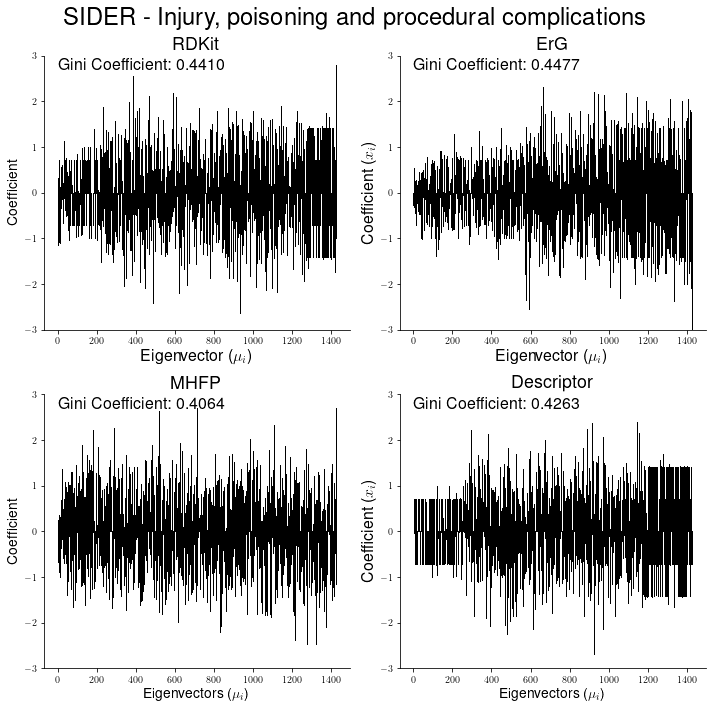

RuntimeError: latex was not able to process the following string:
b'BBBP - p_np'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.20 (TeX Live 2019/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/adam/.cache/matplotlib/tex.cache/848d9f3321b1b59e8cf7392feb7da43d.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texmf/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/helvet.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 848d9f3321b1b59e8cf7392feb7da43d.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.19 {\sffamily BBBP - p_
                         np}
No pages of output.
Transcript written on 848d9f3321b1b59e8cf7392feb7da43d.log.




<Figure size 720x720 with 4 Axes>

In [20]:
sub_dir = "SMILES/Classification/Signal_Decomposition"

ylims = [(-3,3) for x in range(3)]

for i,dset in enumerate(classification_datasets.items()):
    name, dataset = dset
    for prop in headings[name]:
        fig = signal_decomposition_comparison(classification_fingerprints,kernel=RBF(1), ylim=ylims[i],
                                              signal=dataset[prop], dset_name=name,prop=prop)
        save(f"Signal_Decomposition_{name}_{prop.split(' ')[0]}",sub_dir=sub_dir)

In [29]:
for i,dset in enumerate(classification_datasets.items()):
    name, dataset = dset
    for prop in headings[name]:
        file = f"SMILES/Classification/Signal_Decomposition/Signal_Decomposition_{name}_{prop.split(' ')[0]}.png"
        print("\\begin{figure}")
        print(f"\includegraphics[width=\\textwidth]{{Images/{file}}}")
        print(f"\\caption{{Signal Decomposition for SMILES fingerprints on dataset: {name}, property: {prop}}}")
        print(f"\\label{{fig:classification_signal_decomposition_{name}_{prop}}}")
        print("\\end{figure}")
        print("\n")

\begin{figure}
\includegraphics[width=\textwidth]{Images/SMILES/Classification/Signal_Decomposition/Signal_Decomposition_SIDER_Hepatobiliary.png}
\caption{Signal Decomposition for SMILES fingerprints on dataset: SIDER, property: Hepatobiliary disorders}
\label{fig:classification_signal_decomposition_SIDER_Hepatobiliary disorders}
\end{figure}


\begin{figure}
\includegraphics[width=\textwidth]{Images/SMILES/Classification/Signal_Decomposition/Signal_Decomposition_SIDER_Metabolism.png}
\caption{Signal Decomposition for SMILES fingerprints on dataset: SIDER, property: Metabolism and nutrition disorders}
\label{fig:classification_signal_decomposition_SIDER_Metabolism and nutrition disorders}
\end{figure}


\begin{figure}
\includegraphics[width=\textwidth]{Images/SMILES/Classification/Signal_Decomposition/Signal_Decomposition_SIDER_Product.png}
\caption{Signal Decomposition for SMILES fingerprints on dataset: SIDER, property: Product issues}
\label{fig:classification_signal_decomposition_S

In [366]:
classification_headings = {"SIDER" : list(classification_datasets["SIDER"])[1:],
                           "BBBP" : ["p_np"],
                           "Clintox" : ["CT_TOX"]}

class_prop_len = len([item for sublist in list(classification_headings.values()) for item in sublist])

if os.path.exists("SMILES_Results/rf_classification_results.csv"):
    rf_classification_results = pd.read_csv("SMILES_Results/rf_classification_results.csv",index_col="Props")
else:
    rf_classification_results = pd.DataFrame({"Props" : [item for sublist in list(classification_headings.values()) for item in sublist],
                            "RDKit" : np.zeros(class_prop_len),
                            "ErG" : np.zeros(class_prop_len),
                            "MHFP" : np.zeros(class_prop_len),
                            "Descriptor" : np.zeros(class_prop_len)})

    rf_classification_results.set_index("Props",inplace=True)
    
if os.path.exists("SMILES_Results/mlp_classification_results.csv"):
    mlp_classification_results = pd.read_csv("SMILES_Results/mlp_classification_results.csv",index_col="Props")       
    
else:
    mlp_classification_results = pd.DataFrame({"Props" : [item for sublist in list(classification_headings.values()) for item in sublist],
                            "RDKit" : np.zeros(class_prop_len),
                            "ErG" : np.zeros(class_prop_len),
                            "MHFP" : np.zeros(class_prop_len),
                            "Descriptor" : np.zeros(class_prop_len)})    

    mlp_classification_results.set_index("Props",inplace=True)

if os.path.exists("SMILES_Results/gini_classification_results_f1.csv"):
    gini_classification_results = pd.read_csv("SMILES_Results/gini_classification_results_f1.csv",index_col="Props")
    
else:
    gini_classification_results = pd.DataFrame({"Props" : [item for sublist in list(classification_headings.values()) for item in sublist],
                            "RDKit" : np.zeros(class_prop_len),
                            "ErG" : np.zeros(class_prop_len),
                            "MHFP" : np.zeros(class_prop_len),
                            "Descriptor" : np.zeros(class_prop_len)})    

    gini_classification_results.set_index("Props",inplace=True)

In [137]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, roc_auc_score

for name, dset in classification_datasets.items():
    for fp in classification_fingerprints[name].keys():
        for prop in tqdm.tqdm(classification_headings[name]):
            X = classification_fingerprints[name][fp][0]
            #y = normalize(dset[prop].to_numpy().reshape(1,-1)).flatten()
            y = dset[prop].iloc[classification_fingerprints[name][fp][1]].to_numpy()
            
            X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=random_state,train_size=0.5)
            
            if rf_classification_results[fp][prop] == 0:
                rf = RandomForestClassifier(random_state=random_state).fit(X_train, y_train)
                y_preds = rf.predict(X_test)
                rf_classification_results[fp][prop] = roc_auc_score(y_test,y_preds)#rf.score(X_test, y_test)

            if mlp_classification_results[fp][prop] == 0:
                mlp = MLPClassifier(random_state=random_state, max_iter=1000).fit(X_train, y_train)
                y_preds = mlp.predict(X_test)
                mlp_classification_results[fp][prop] = roc_auc_score(y_test,y_preds)#mlp.score(X_test, y_test)
            
            rf_classification_results.to_csv("SMILES_Results/rf_classification_results_auc.csv")
            mlp_classification_results.to_csv("SMILES_Results/mlp_classification_results_auc.csv")

100%|█████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.84it/s]


In [369]:
classification_properties = [item for sublist in classification_headings.values() for item in sublist]
classification_properties

['Hepatobiliary disorders',
 'Metabolism and nutrition disorders',
 'Product issues',
 'Eye disorders',
 'Investigations',
 'Musculoskeletal and connective tissue disorders',
 'Gastrointestinal disorders',
 'Social circumstances',
 'Immune system disorders',
 'Reproductive system and breast disorders',
 'Neoplasms benign, malignant and unspecified (incl cysts and polyps)',
 'General disorders and administration site conditions',
 'Endocrine disorders',
 'Surgical and medical procedures',
 'Vascular disorders',
 'Blood and lymphatic system disorders',
 'Skin and subcutaneous tissue disorders',
 'Congenital, familial and genetic disorders',
 'Infections and infestations',
 'Respiratory, thoracic and mediastinal disorders',
 'Psychiatric disorders',
 'Renal and urinary disorders',
 'Pregnancy, puerperium and perinatal conditions',
 'Ear and labyrinth disorders',
 'Cardiac disorders',
 'Nervous system disorders',
 'Injury, poisoning and procedural complications',
 'p_np',
 'CT_TOX']

In [113]:
if os.path.exists("Eigenvectors/smiles_classification.pkl"):
    print("Loading pre-existing eigenvectors")
    with open('Eigenvectors/smiles_classification.pkl', 'rb') as handle:
        smiles_classification_eigenvectors = pickle.load(handle)

else:
    print("Calculating new eigenvectors")
    smiles_classification_eigenvectors = {name : {fp : fourier(RBF(10)(classification_fingerprints[name][fp][0])) for fp in tqdm.tqdm(classification_fingerprints[name].keys())} for name in classification_datasets.keys()}
    
    with open('Eigenvectors/smiles_classification.pkl', 'wb') as handle:
        pickle.dump(smiles_classification_eigenvectors, handle, protocol=pickle.HIGHEST_PROTOCOL)


Loading pre-existing eigenvectors


In [139]:
for i,dset in enumerate(classification_datasets.items()):
    name, dataset = dset
    for j,fp in enumerate(classification_fingerprints[name].keys()):
        for prop in classification_headings[name]:
            if gini_classification_results[fp][prop] == 0:
                gini_classification_results[fp][prop] = gini(gft(smiles_classification_eigenvectors[name][fp],dataset[prop].iloc[classification_fingerprints[name][fp][1]].to_numpy().reshape(1,-1).flatten()))
            else:
                continue 
                
    gini_classification_results.to_csv("SMILES_Results/gini_classification_results_f1.csv")

In [367]:
rf_classification_results

,RDKit,ErG,MHFP,Descriptor
Props,,,,
Hepatobiliary disorders,0.652661,0.647059,0.547619,0.613445
Metabolism and nutrition disorders,0.683473,0.690476,0.712885,0.684874
Product issues,0.983193,0.983193,0.985994,0.984594
Eye disorders,0.651261,0.651261,0.655462,0.647059
Investigations,0.813725,0.806723,0.823529,0.796919
Musculoskeletal and connective tissue disorders,0.710084,0.704482,0.729692,0.703081
Gastrointestinal disorders,0.921569,0.922969,0.922969,0.908964
Social circumstances,0.795518,0.802521,0.819328,0.794118
Immune system disorders,0.711485,0.725490,0.731092,0.711485


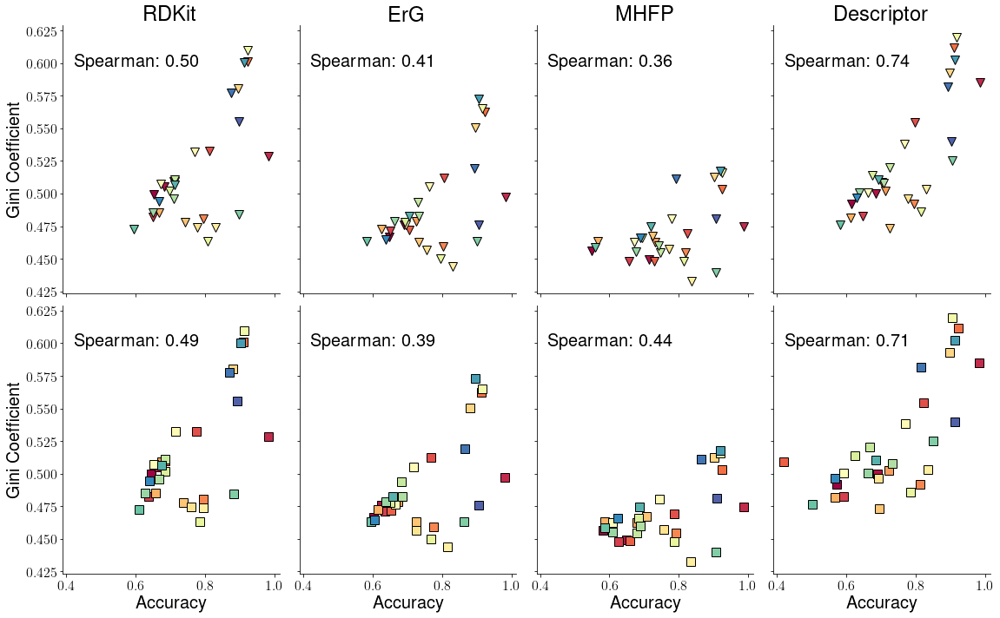

In [219]:
from scipy.stats import spearmanr
from sklearn.metrics import f1_score 

sub_dir = "SMILES/Classification/Sparsity"

cmap = mpl.cm.get_cmap("Spectral")
classification_dsets = [mlp_classification_results, rf_classification_results]

classification_colors = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3']
labels = [string.replace("_"," ") for string in classification_properties]
titles = ["MLP","RF"]

fig, axs = plt.subplots(2,4,figsize=(16,10), sharex=True, sharey=True)

for i,fp in enumerate(classification_fingerprints["SIDER"].keys()):
    for j in range(2):
        for k,prop in enumerate(classification_properties):
            k_col = k / len(classification_properties)
            if j == 1:
                axs[j,i].plot(mlp_classification_results[fp][prop],gini_classification_results[fp][prop],'s',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
            else:
                axs[j,i].plot(rf_classification_results[fp][prop],gini_classification_results[fp][prop],'v',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])

        if j == 1:
            axs[j,i].set_xlabel(f"Accuracy",fontsize=20)
        if i == 0:
            axs[j,i].set_ylabel("Gini Coefficient",fontsize=20)
        if j == 1:
            axs[j,i].annotate(f"Spearman: {spearmanr(mlp_classification_results[fp],gini_classification_results[fp])[0]:.2f}",xy=(0.05,0.85),xycoords='axes fraction',fontsize=20)
        else:
            axs[j,i].annotate(f"Spearman: {spearmanr(rf_classification_results[fp],gini_classification_results[fp])[0]:.2f}",xy=(0.05,0.85),xycoords='axes fraction',fontsize=20)

        if j == 0:
            axs[j,i].set_title(list(classification_fingerprints["SIDER"].keys())[i], fontsize=24)

        if i == 3 and j == 1:
            pass
            #fig.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,title=titles[j],fontsize=12,title_fontsize=16)
            #mlp_handles, legend_labels = axs[j,i].get_legend_handles_labels()
            #rf_handles, _ = axs[0,i].get_legend_handles_labels()
            #by_label = dict(zip(legend_labels, list(zip(rf_handles,mlp_handles))))
            #fig.legend(by_label.values(), by_label.keys(),bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
            
        #axs[j,i].set_xlim(0,1.05)
        axs[j,i].tick_params(axis = 'both', which = 'major', labelsize = 16)

        axs[j,i].spines["top"].set_visible(False)
        axs[j,i].spines["right"].set_visible(False)

fig.tight_layout()
save("Classification_Plots_NoLeg.pdf", sub_dir=sub_dir)

## Dirichlet Energy SMILES Classification Datasets

In [359]:
smiles_classification_adjacencies = {name : {fp : RBF(10)(classification_fingerprints[name][fp][0]) for fp in tqdm.tqdm(classification_fingerprints[name].keys())} for name in classification_datasets.keys()}

100%|█████████████████████████████████████████████| 4/4 [00:05<00:00,  1.34s/it]


In [489]:
class_prop_len = len([item for sublist in list(classification_headings.values()) for item in sublist])

classification_headings = {"Clintox" :  ["CT_TOX"],
            "BBBP" : ["p_np"],
            "SIDER" : classification_datasets["SIDER"].keys()[1:]}

dirichlet_classification_results = pd.DataFrame({"Props" : [item for sublist in list(classification_headings.values()) for item in sublist],
                            "RDKit" : np.zeros(class_prop_len),
                            "ErG" : np.zeros(class_prop_len),
                            "MHFP" : np.zeros(class_prop_len),
                            "Descriptor" : np.zeros(class_prop_len)})  

dirichlet_classification_results.set_index("Props",inplace=True)

for i,dset in enumerate(classification_datasets.items()):
    name, dataset = dset
    for j,fp in enumerate(classification_fingerprints[name].keys()):
        for prop in classification_headings[name]:
            print(prop)
            dirichlet_classification_results[fp][prop] = dirichlet(dataset[prop], lap(smiles_classification_adjacencies[name][fp]))
            
    dirichlet_classification_results.to_csv("SMILES_Results/dirichlet_classification_results.csv")

Hepatobiliary disorders
Metabolism and nutrition disorders
Product issues
Eye disorders
Investigations
Musculoskeletal and connective tissue disorders
Gastrointestinal disorders
Social circumstances
Immune system disorders
Reproductive system and breast disorders
Neoplasms benign, malignant and unspecified (incl cysts and polyps)
General disorders and administration site conditions
Endocrine disorders
Surgical and medical procedures
Vascular disorders
Blood and lymphatic system disorders
Skin and subcutaneous tissue disorders
Congenital, familial and genetic disorders
Infections and infestations
Respiratory, thoracic and mediastinal disorders
Psychiatric disorders
Renal and urinary disorders
Pregnancy, puerperium and perinatal conditions
Ear and labyrinth disorders
Cardiac disorders
Nervous system disorders
Injury, poisoning and procedural complications
Hepatobiliary disorders
Metabolism and nutrition disorders
Product issues
Eye disorders
Investigations
Musculoskeletal and connective 

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2039 is different from 2050)

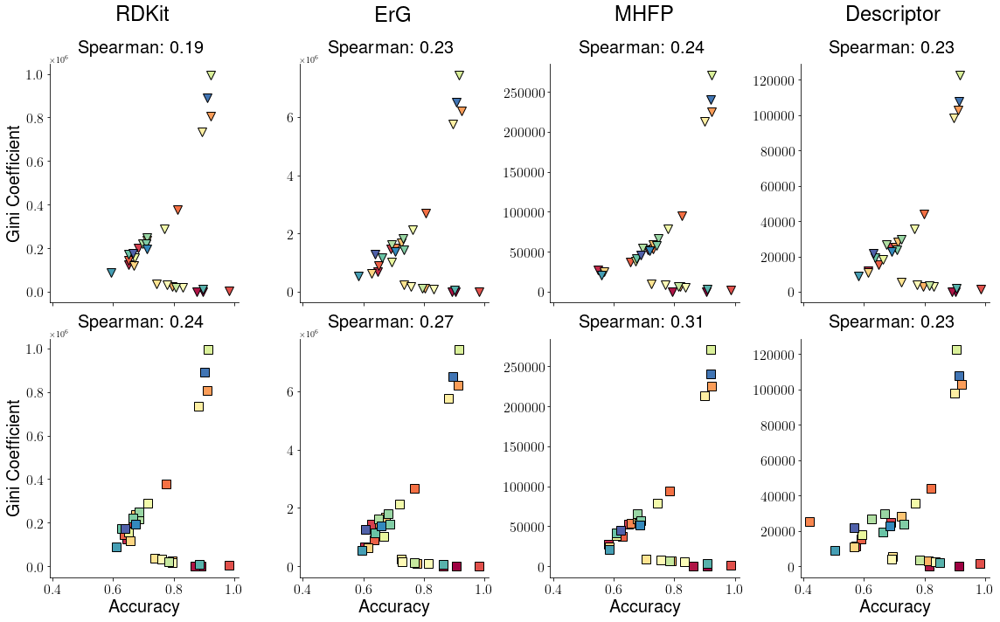

In [376]:
from scipy.stats import spearmanr
from sklearn.metrics import f1_score 

sub_dir = "SMILES/Classification/Sparsity"

cmap = mpl.cm.get_cmap("Spectral")
classification_dsets = [mlp_classification_results, rf_classification_results]

classification_colors = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3']
labels = [string.replace("_"," ") for string in classification_properties]
titles = ["MLP","RF"]

classification_properties = [item for sublist in classification_headings.values() for item in sublist]

fig, axs = plt.subplots(2,4,figsize=(16,10), sharex=True)

for i,fp in enumerate(classification_fingerprints["SIDER"].keys()):
    for j in range(2):
        for k,prop in enumerate(classification_properties):
            k_col = k / len(classification_properties)
            if j == 1:
                axs[j,i].plot(mlp_classification_results[fp][prop],dirichlet_classification_results[fp][prop],'s',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])
            else:
                axs[j,i].plot(rf_classification_results[fp][prop],dirichlet_classification_results[fp][prop],'v',c=cmap(k_col),markeredgecolor="k",markersize=10,label=labels[k])

        if j == 1:
            axs[j,i].set_xlabel(f"Accuracy",fontsize=20)
        if i == 0:
            axs[j,i].set_ylabel("Gini Coefficient",fontsize=20)
        if j == 1:
            axs[j,i].annotate(f"Spearman: {spearmanr(mlp_classification_results[fp],dirichlet_classification_results[fp])[0]:.2f}",xy=(0.15,1.05),xycoords='axes fraction',fontsize=20)
        else:
            axs[j,i].annotate(f"Spearman: {spearmanr(rf_classification_results[fp],dirichlet_classification_results[fp])[0]:.2f}",xy=(0.15,1.05),xycoords='axes fraction',fontsize=20)

        if j == 0:
            axs[j,i].set_title(list(classification_fingerprints["SIDER"].keys())[i], fontsize=24, pad=50)

        if i == 3 and j == 1:
            pass
            #fig.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,title=titles[j],fontsize=12,title_fontsize=16)
            #mlp_handles, legend_labels = axs[j,i].get_legend_handles_labels()
            #rf_handles, _ = axs[0,i].get_legend_handles_labels()
            #by_label = dict(zip(legend_labels, list(zip(rf_handles,mlp_handles))))
            #fig.legend(by_label.values(), by_label.keys(),bbox_to_anchor=(1,0.5), loc='center left',frameon=False,fontsize=16)
            
        #axs[j,i].set_xlim(0,1.05)
        axs[j,i].tick_params(axis = 'both', which = 'major', labelsize = 16)

        axs[j,i].spines["top"].set_visible(False)
        axs[j,i].spines["right"].set_visible(False)

fig.tight_layout()
save("Classification_Plots_NoLeg_Dirichlet.pdf", sub_dir=sub_dir)

## Understanding binary properties.

In [211]:
def binary_property_plot(Y,ax=None):
    if ax is None:
        fig, ax = plt.subplots(1,1)
    ax.bar([0],len(np.where(Y==0)[0]),label="False")
    ax.bar([1],len(np.where(Y==1)[0]),label="True")
    return ax

<AxesSubplot:>

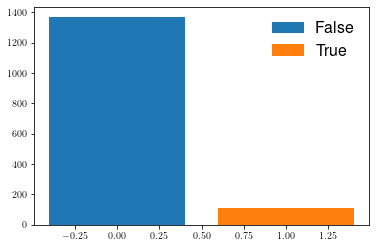

In [209]:
binary_property_plot(Y)

100%|██████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 845.76it/s]


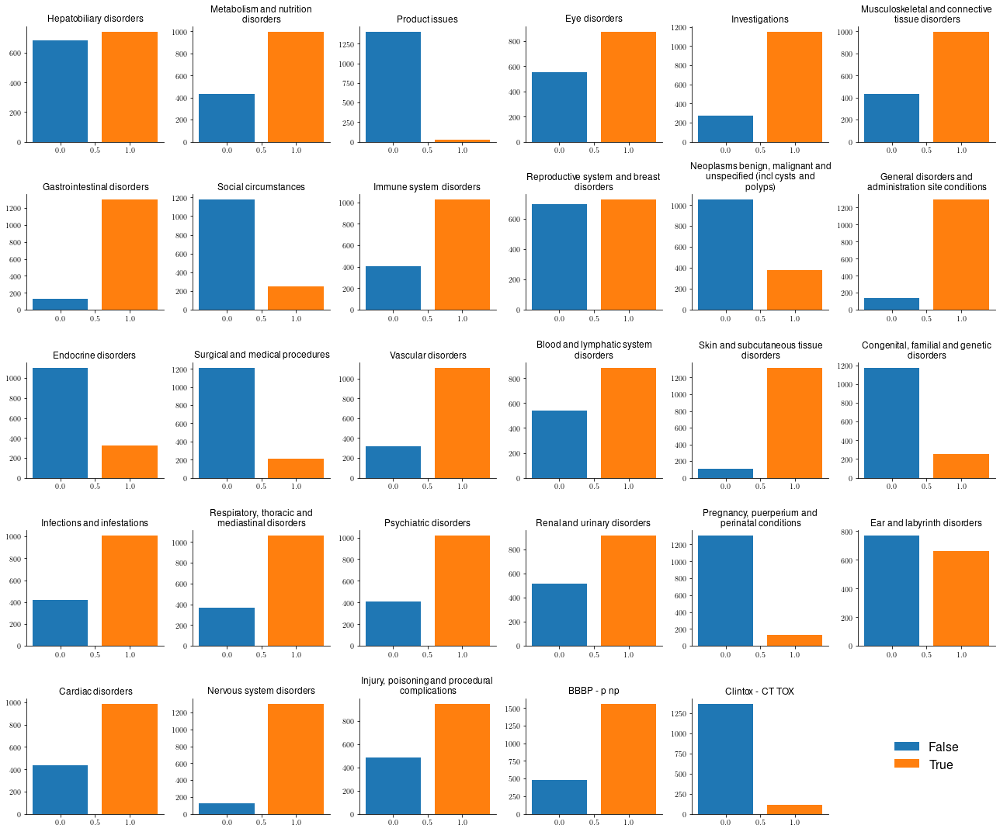

In [213]:
import textwrap

cols, rows = 6, 5
cols_height = rows_width = 3

fig, axs = plt.subplots(rows,cols,figsize=(cols*rows_width,rows*cols_height))
coords = np.arange(rows * cols).reshape(rows,cols)

   

for name, dset in [("SIDER",SIDER)]:
    for fp in ["RDKit"]:
        for i,prop in enumerate(tqdm.tqdm(classification_headings[name])):
            Y = dset[prop].iloc[classification_fingerprints[name][fp][1]].to_numpy()
           
            x,y = np.where(coords == i)
            ax = axs[x,y][0]

            ax.set_title("\n".join(textwrap.wrap(prop.replace("_"," "), width=32)))
            binary_property_plot(Y,ax=ax)
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)

Y = BBBP["p_np"].iloc[classification_fingerprints["BBBP"]["RDKit"][1]].to_numpy()
           
x,y = np.where(coords == 27)
ax = axs[x,y][0]

ax.set_title("BBBP - p_np".replace("_"," "))
binary_property_plot(Y,ax=ax)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

Y = Clintox["CT_TOX"].iloc[classification_fingerprints["Clintox"]["RDKit"][1]].to_numpy()
           
x,y = np.where(coords == 28)
ax = axs[x,y][0]

ax.set_title("Clintox - CT_TOX".replace("_"," "))
binary_property_plot(Y,ax=ax)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

axs[np.where(coords==29)][0].set_axis_off()

handles, legend_labels = axs[4,4].get_legend_handles_labels()
by_label = dict(zip(legend_labels, handles))
axs[4,5].legend(by_label.values(), by_label.keys(),bbox_to_anchor=(0.5,0.5), loc='center',frameon=False,fontsize=16)


fig.tight_layout()
save("Classification_Histograms.pdf", sub_dir="SMILES/Classification/Sparsity")

# Signal Decomposition for QM9 Regression

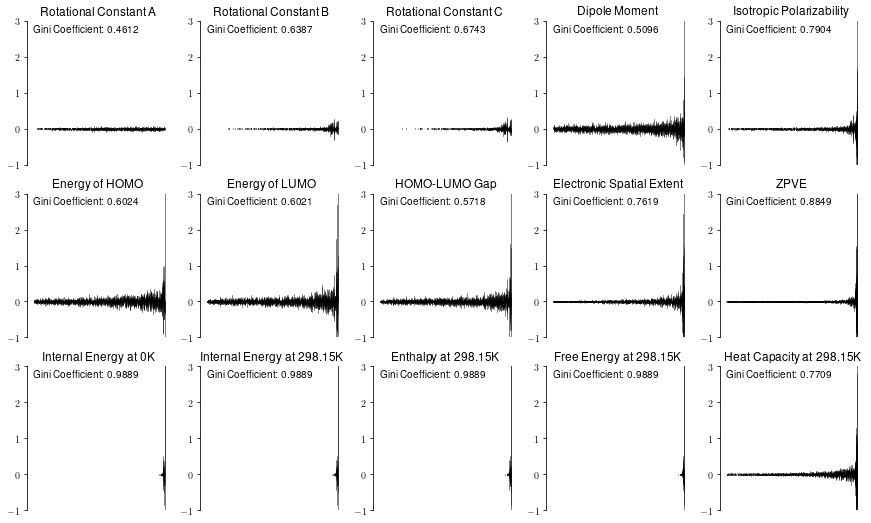

In [329]:
fig, axs = plt.subplots(3,5,figsize=(15,9))
samples = 2500
coords = np.arange(15).reshape(3,5)
q = Fourier(cm_adj_signals[:samples,:samples])

for i,prop in enumerate(list(qm9_df)[2:]):
    x,y = np.where(coords == i)
    
    signal = qm9_df.iloc[:samples][prop].to_numpy()
    scaler = MinMaxScaler()
    scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
    sns_cmap = sns.color_palette("flare_r", as_cmap=True)
    #plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,))
    axs[x,y][0].set_title(f"{prop}")
    
    signal_plot(gft(q,scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=gini,linewidth=0.5,ax=axs[x,y][0])
    axs[x,y][0].tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)
    
save("QM9_All_Signals_2500Samples.pdf",sub_dir=sub_dir)

In [98]:
from sklearn.preprocessing import MinMaxScaler

def signal_plot_custom(coeffs,ylim=(-5,5),linewidth=1,gini=gini,ax=None,sort=False,spines=["top","right"],*args, **kwargs):
    """
    Plot a signal plot for the unsorted, signed coefficients of the Fourier expansion. 
    
    Parameters 
    ----------
    coeffs : np.array, (N,)
        The numpy array of expansion coefficients
        
    ylim : tuple, default=(-5,5)
        The y-limits of the plot formatted as (ymin,ymax)
        
    gini : func, default=gini
        A function to compute the gini coefficient of the spectra 
        
    Returns 
    -------
    signal plot, matplotlib.Axes
        The signal plot plotted on axes.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    ax.set_ylim(*ylim)
    if sort:
        coeffs = np.sort(np.abs(coeffs))
    for x,coeff in enumerate(coeffs):
        ax.plot((x,x),(0,coeff),linewidth=linewidth,c='k',*args, **kwargs)
    if gini is not None:
        ax.annotate(f"Gini Coefficient: {gini(coeffs):.4f}",xy=(0.1,ylim[1]-(ylim[1]/10)))
        
    if spines is not None:
        for spine in spines:
            ax.spines[spine].set_visible(False)
            
    return ax

def signal_decomposition_plot(df,properties, rows, cols,adj=None,eigenvectors=None,idxs=None,title=None,cols_height=3, rows_width=3, normalize_signal=True,ylim=(1,-3),linewidth=0.1):
    """
    Computes the signal decomposition plot for all properties in a dataset of interest.
    
    Parameters 
    ----------
    df : pandas.DataFrame
        The pandas dataframe storing the properties for each molecule of interest.
    
    adj : np.array(NxN)
        The adjacency matrix that will be eigendecomposed into its eigenvectors.
        
    properties : [str]
        A list of property values to extract from the dataframe.
        
    rows : int
        The number of rows in the plot generated.

    cols : int
        The number of columns in the plot generated.
        
    normalize_signal : None
        Whether or not to normalize the signal before performing the decomposition.
        
    eigenvectors : np.array(NxN)
        An array of eigenvectors that can be used instead of the adjacency matrix.
        
    idxs : np.array, default=None
        The indices of the pandas dataframe that represent the molecules in the adjacency matrix.
        
    title : str, default=None
        The super title of the plot. Individual plots are titled using the property labels in properties.
    
    Returns 
    ------- 
    fig : matplotlib.Figure
        The figure with all subplots of interest.
    """
    fig, axs = plt.subplots(rows,cols,figsize=(cols*rows_width,rows*cols_height))
    coords = np.arange(rows * cols).reshape(rows,cols)
    
    if eigenvectors is None:
        eigenvectors = fourier(adj)
    
    for i,prop in enumerate(properties):
        print(prop)
        x,y = np.where(coords == i)
        ax = axs[x,y][0]
        
        if idxs is not None:
            signal = df.iloc[idxs][prop].to_numpy()
        else:
            signal = df[prop].to_numpy()
            
        if normalize_signal: 
            scaled_signal = normalize(signal.reshape(1,-1)).flatten()
            
        #scaled_signal = MinMaxScaler().fit_transform(signal.reshape(-1,1))
        sns_cmap = sns.color_palette("flare_r", as_cmap=True)
        ax.set_title(f"{prop}")

        signal_plot_custom(gft(eigenvectors,scaled_signal),ylim=ylim,spines=['top','right','bottom'],gini=gini,linewidth=linewidth,ax=ax)
        ax.tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)
    
    if title is not None:
        fig.suptitle(title,fontsize=32)
    
    return fig 


Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K


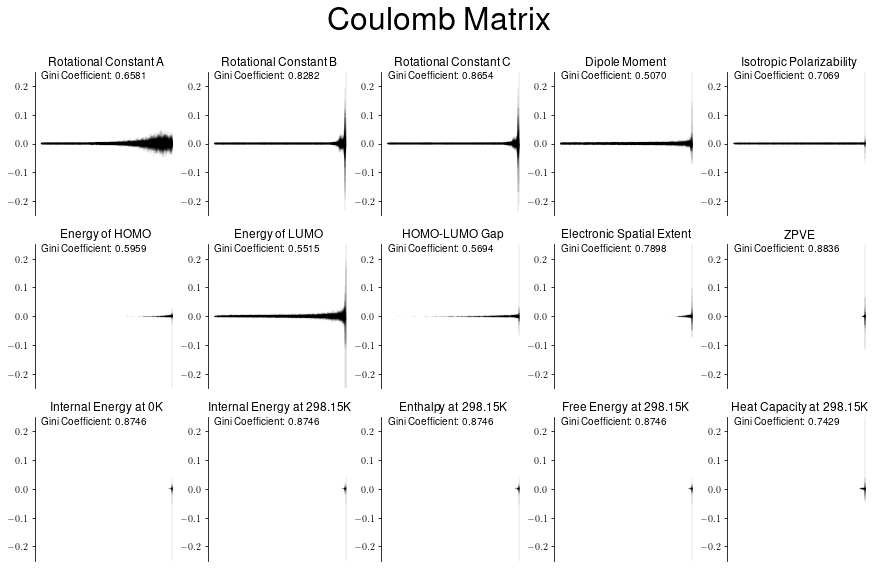

Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K


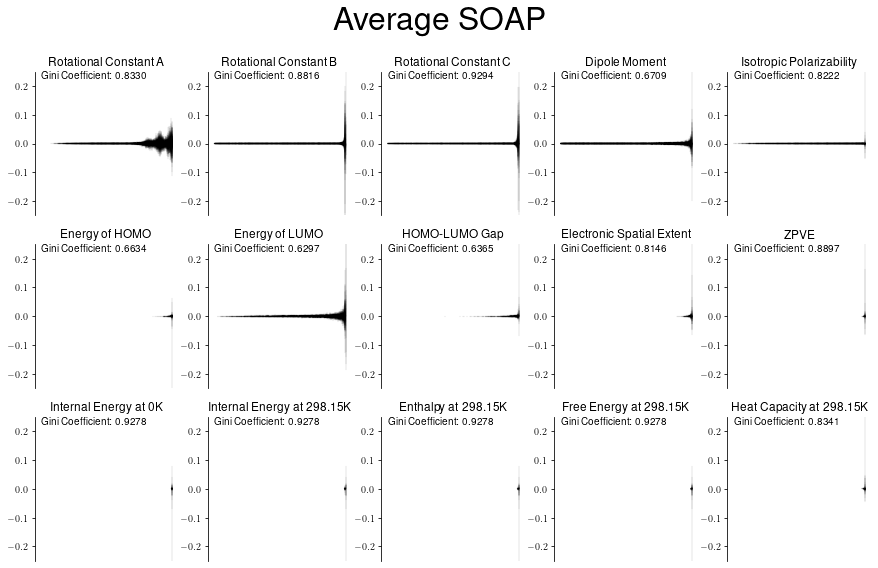

Rotational Constant A
Rotational Constant B
Rotational Constant C
Dipole Moment
Isotropic Polarizability
Energy of HOMO
Energy of LUMO
HOMO-LUMO Gap
Electronic Spatial Extent
ZPVE
Internal Energy at 0K
Internal Energy at 298.15K
Enthalpy at 298.15K
Free Energy at 298.15K
Heat Capacity at 298.15K


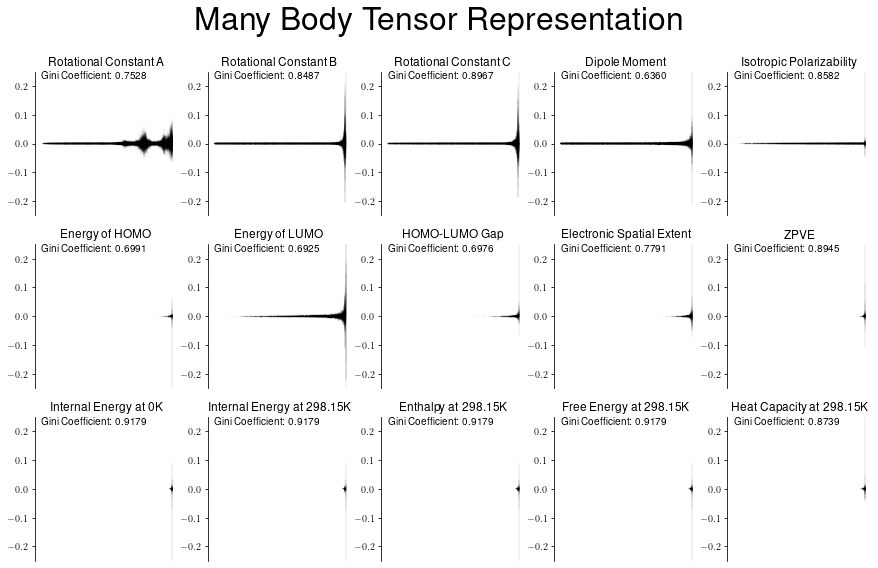

In [99]:
sub_dir = "QM9_Projections"

signal_decompositions = {key : val for key, val in zip(["Coulomb Matrix", "Average SOAP", "Many Body Tensor Representation"], qm9_eigenvectors)}

for title,eigenvectors in signal_decompositions.items():
    fig = signal_decomposition_plot(qm9_subset,
                                    properties=list(qm9_subset)[2:17],
                                    rows=3,
                                    cols=5,
                                    title=title,
                                    eigenvectors=eigenvectors,
                                    ylim=(-0.25,0.25)
                                    )
    
    save(f"QM9_{title}_normalized.png",sub_dir=sub_dir,dpi=300)                       
    plt.show()


Rotational Constant A


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Rotational Constant B


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Rotational Constant C


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Dipole Moment


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Isotropic Polarizability


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Energy of HOMO


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Energy of LUMO


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


HOMO-LUMO Gap


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Electronic Spatial Extent


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


ZPVE


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Internal Energy at 0K


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Internal Energy at 298.15K


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Enthalpy at 298.15K


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Free Energy at 298.15K


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


Heat Capacity at 298.15K


/home/adam/anaconda3/envs/chemistry/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


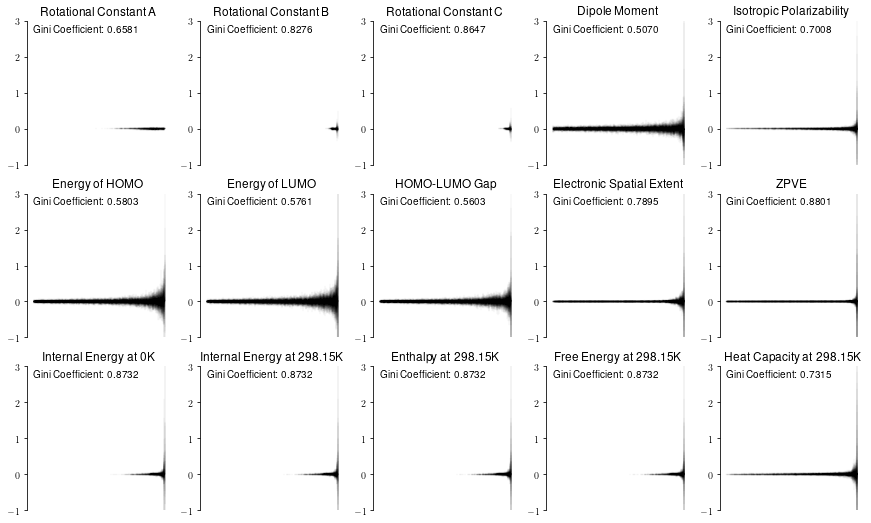

In [96]:
sub_dir = "QM9_Projections"

signal_decompositions = {key : val for key, val in zip(["Coulomb Matrix", "Average SOAP", "Many Body Tensor Representation"], qm9_eigenvectors)}
sub_sig = {}
sub_sig["Coulomb Matrix"] = signal_decompositions["Coulomb Matrix"]
for title,eigenvectors in sub_sig.items():
    fig = signal_decomposition_plot(qm9_subset,
                                    properties=list(qm9_subset)[2:17],
                                    rows=3,
                                    cols=5,
                                    eigenvectors=eigenvectors,
                                    ylim=(-1,3),
                                    linewidth=0.05
                                    )
    
    save(f"QM9_{title}_normalized_notitle.png",sub_dir=sub_dir,dpi=300)                       
    plt.show()


Coulomb Matrix
Rotational Constant A
Rotational Constant B
Rotational Constant C


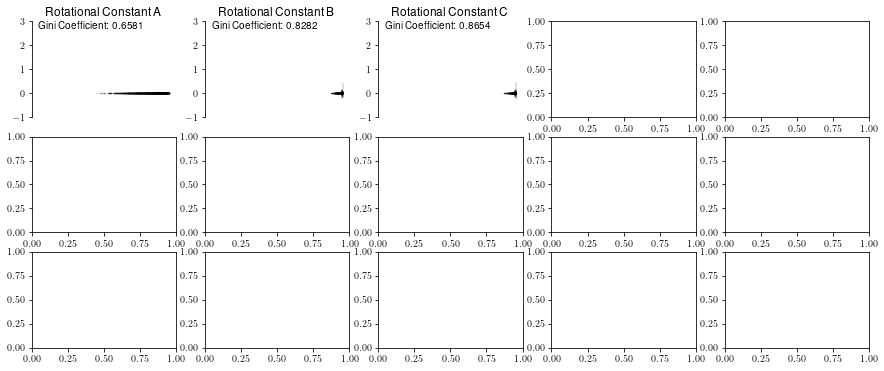

Average SOAP
Rotational Constant A
Rotational Constant B
Rotational Constant C


KeyboardInterrupt: 

In [70]:
for title,eigenvectors in signal_decompositions.items():
    print(title)
    #if not title=="Average SOAP":
    #    continue
    fig = signal_decomposition_plot(qm9_subset,
                                    properties=list(qm9_subset)[2:5],
                                    rows=3,
                                    cols=5,
                                    eigenvectors=eigenvectors,
                                    cols_height=2
                                    )
    #save(f"QM9_subset_{title}.png",sub_dir=sub_dir,dpi=300)                       
    plt.show()

In [ ]:
fig = signal_decomposition_plot(qm9_df,
                                properties=list(qm9_df)[2:],
                                rows=3,
                                cols=5,
                                idxs=Ellipsis,
                                title=tile
                                )
save("QM9_All_Signals_2500Samples_AvSoap.pdf",sub_dir=sub_dir)
plt.show()

fig = signal_decomposition_plot(qm9_df,
                                fps_adj[:samples,:samples],
                                properties=list(qm9_df)[2:],
                                rows=3,
                                cols=5,
                                idxs=np.arange(samples),
                                title="ECFP"
                                )

save("QM9_All_Signals_2500Samples_ECFP.pdf",sub_dir=sub_dir)
plt.show()

fig = signal_decomposition_plot(qm9_df,
                                cm_adj_signals[:samples,:samples],
                                properties=list(qm9_df)[2:],
                                rows=3,
                                cols=5,
                                idxs=np.arange(samples),
                                title="Coulomb Matrix"
                                )

save("QM9_All_Signals_2500Samples_CM.pdf",sub_dir=sub_dir)
plt.show()

# Feature Importance Section

In [21]:
smiles_regression_datasets = {} 
for dset in ["ESOL","FreeSolv","BACE","Lipophilicity"]:
    smiles_regression_datasets[dset] = regression_datasets[dset]

In [23]:
from sklearn.ensemble import RandomForestRegressor

headings

importances = []

for i,dset in enumerate(smiles_regression_datasets.items()):
    name, dataset = dset
    for prop in headings[name]:
        
        X, idxs = regression_fingerprints[name]["Descriptor"]

        X = np.array(X)
        y = dataset[prop].iloc[idxs]

        regr = RandomForestRegressor(max_depth=2, random_state=0)
        regr.fit(X, y)
        print(f"Fitted RFR to {name} - {prop}")

        importances.append(regr.feature_importances_)
        
        #fig = signal_decomposition_comparison(fingerprints,kernel=RBF(100), ylim=ylims[i],
                                              #signal=dataset[prop], dset_name=name,prop=prop)
        #save(f"Signal_Decomposition_{name}_{prop.split(' ')[0]}",sub_dir=sub_dir)


Fitted RFR to ESOL - ESOL predicted log solubility in mols per litre
Fitted RFR to FreeSolv - expt
Fitted RFR to FreeSolv - calc
Fitted RFR to BACE - pIC50
Fitted RFR to Lipophilicity - exp


In [24]:
props = ['CalcTPSA',
         'CalcLabuteASA',
         'CalcExactMolWt',
         'CalcNumAliphaticCarbocycles',
         'CalcNumAliphaticHeterocycles',
         'CalcNumAliphaticRings',
         'CalcNumAmideBonds',
         'CalcNumAromaticCarbocycles',
         'CalcNumAromaticHeterocycles',
         'CalcNumAromaticRings',
         'CalcNumAtomStereoCenters',
         'CalcNumBridgeheadAtoms',
         'CalcNumHBA',
         'CalcNumHBD',
         'CalcNumHeteroatoms',
         'CalcNumHeterocycles',
         'CalcNumLipinskiHBA',
         'CalcNumLipinskiHBD',
         'CalcNumRings',
         'CalcNumRotatableBonds',
         'CalcNumSaturatedCarbocycles',
         'CalcNumSaturatedHeterocycles',
         'CalcNumSaturatedRings',
         'CalcNumSpiroAtoms',
         'CalcNumUnspecifiedAtomStereoCenters']

def calc_vector(x,props=props):
    """
    Calculates the property vector using the available RDKit descriptors.
    
    Parameters 
    ----------
    x : str
        The SMILES to have its vector representation calculated.
        
    props : [str], default=props 
        The list of descriptor functions to calculate for the molecule of interest.
        
    Returns 
    -------
    y : np.array(len(props),)
        A numpy array the length of the property list.
    """
    if isinstance(x,str):
        x = Chem.MolFromSmiles(x)
    y = np.zeros((len(props),))
    for i in range(len(y)):
        y[i] = getattr(Descriptors.rdMolDescriptors, props[i])(x)
    return y 

test = Chem.MolFromSmiles("CCC")
calc_vector(test)

array([ 0.        , 21.46913526, 44.06260026,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ])

In [230]:
possible_descriptors = []

for descriptor in dir(Descriptors.rdMolDescriptors):
    if descriptor.startswith("_"):
        continue
    try:
        getattr(Descriptors.rdMolDescriptors, descriptor)(test)
        possible_descriptors.append(descriptor)
    except:
        pass

RDKit ERROR: molecule has no conformers
has no conformers
Violation occurred on line 165 in file /home/conda/feedstock_root/build_artifacts/rdkit_1626029736549/work/Code/GraphMol/Descriptors/PMI.cpp
Failed Expression: mol.getNumConformers() >= 1
****

[17:44:21] 

****
Pre-condition Violation
molecule has no conformers
Violation occurred on line 226 in file /home/conda/feedstock_root/build_artifacts/rdkit_1626029736549/work/Code/GraphMol/Descriptors/PMI.cpp
Failed Expression: mol.getNumConformers() >= 1
****

[17:44:21] 

****
Pre-condition Violation
molecule has no conformers
Violation occurred on line 382 in file /home/conda/feedstock_root/build_artifacts/rdkit_1626029736549/work/Code/GraphMol/Descriptors/WHIM.cpp
Failed Expression: mol.getNumConformers() >= 1
****

[17:44:59] 

****
Pre-condition Violation
molecule has no conformers
Violation occurred on line 238 in file /home/conda/feedstock_root/build_artifacts/rdkit_1626029736549/work/Code/GraphMol/Descriptors/AUTOCORR3D.cpp
Fail

In [259]:
def calc_vector_flatten(x,props=props):
    """
    Calculates the property vector using the available RDKit descriptors.
    
    Parameters 
    ----------
    x : str
        The SMILES to have its vector representation calculated.
        
    props : [str], default=props 
        The list of descriptor functions to calculate for the molecule of interest.
        
    Returns 
    -------
    y : np.array(len(props),)
        A numpy array the length of the property list.
    """
    if isinstance(x,str):
        x = Chem.MolFromSmiles(x)
    y = []
    for i in range(len(props)):
        y.extend(list([getattr(Descriptors.rdMolDescriptors, props[i])(x)]))
    y = np.array([item for sublist in y for item in sublist])
    return y 

In [260]:
calc_vector_flatten(test,possible_descriptors)

TypeError: 'float' object is not iterable

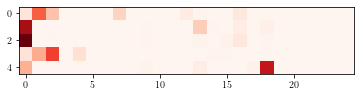

In [25]:
plt.imshow(np.array(importances),cmap="Reds")
plt.show()

In [26]:
for prop, val in zip(props,importances[1]):
    print(f"{prop} : {val}")
    
importance_idxs = [np.argsort(importance * (-1)) for importance in importances]

CalcTPSA : 0.7507785851835779
CalcLabuteASA : 0.0
CalcExactMolWt : 0.0
CalcNumAliphaticCarbocycles : 0.0
CalcNumAliphaticHeterocycles : 0.0
CalcNumAliphaticRings : 0.0
CalcNumAmideBonds : 0.0
CalcNumAromaticCarbocycles : 0.0026452747578674268
CalcNumAromaticHeterocycles : 0.0
CalcNumAromaticRings : 0.003679522806946665
CalcNumAtomStereoCenters : 0.0
CalcNumBridgeheadAtoms : 0.0
CalcNumHBA : 0.00039775814686465375
CalcNumHBD : 0.1663960840453189
CalcNumHeteroatoms : 0.007077564882788947
CalcNumHeterocycles : 0.0
CalcNumLipinskiHBA : 0.038856126670874715
CalcNumLipinskiHBD : 0.00339232564440087
CalcNumRings : 0.026776757861359957
CalcNumRotatableBonds : 0.0
CalcNumSaturatedCarbocycles : 0.0
CalcNumSaturatedHeterocycles : 0.0
CalcNumSaturatedRings : 0.0
CalcNumSpiroAtoms : 0.0
CalcNumUnspecifiedAtomStereoCenters : 0.0


In [27]:
for x in range(10):
    small_X = X[:,importance_idxs[::-1][:x+1]] # Just select the columns of the n most important features.
    signal_plot(fourier_decomposition(small_X,RBF(100), y))

ValueError: XA must be a 2-dimensional array.

In [1770]:
importance_idxs[:7][::-1]

array([13, 12, 16,  0,  7,  2,  1])

Working on ESOL
ESOL Complete
Working on FreeSolv


/tmp/ipykernel_3781/2309656476.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


FreeSolv Complete
Working on BACE
BACE Complete
Working on Lipophilicity
Lipophilicity Complete


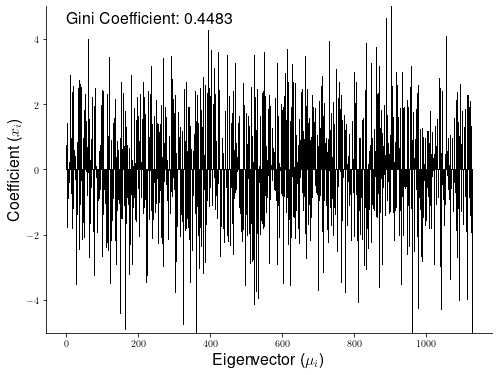

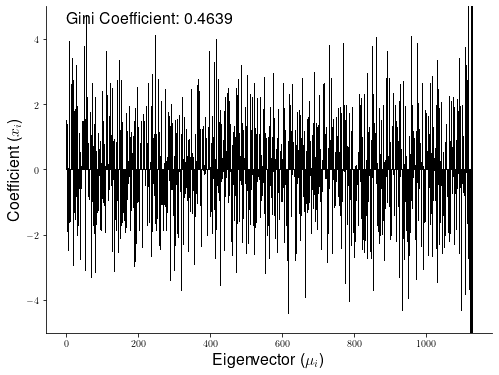

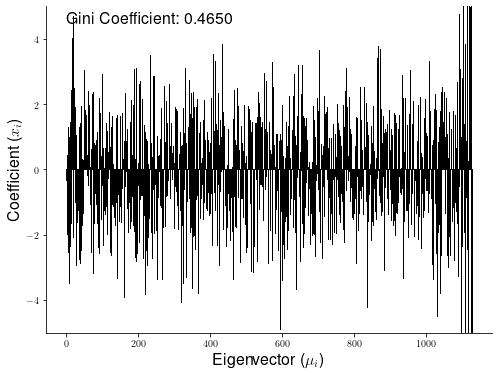

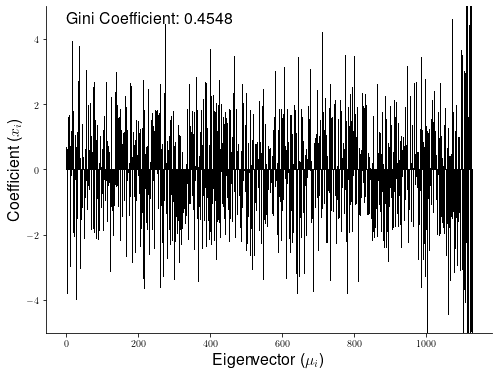

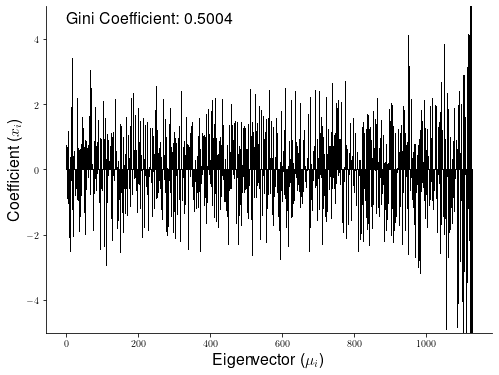

...

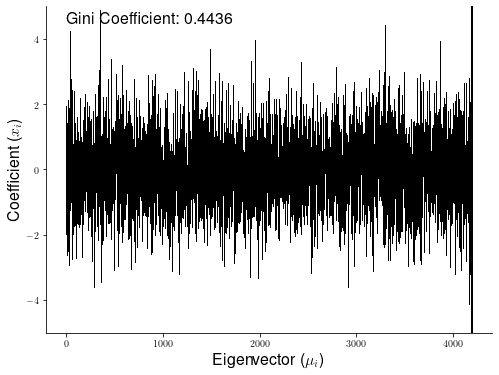

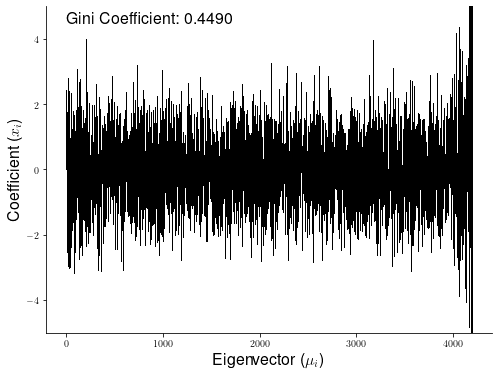

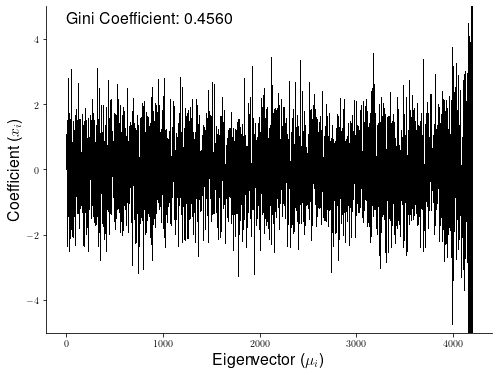

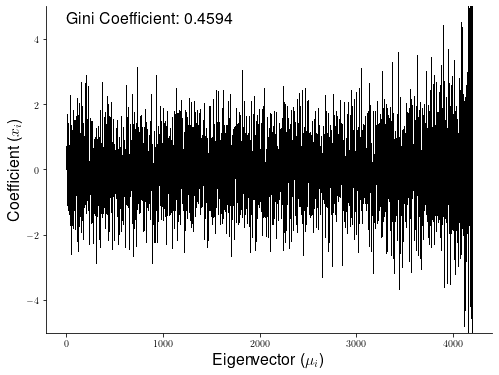

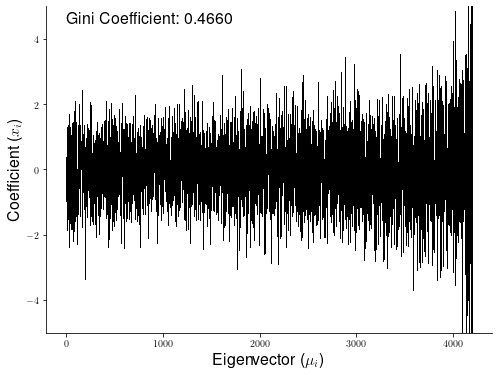

In [30]:
ginis = []

for i,dset in enumerate(smiles_regression_datasets.items()):
    name, dataset = dset
    print(f"Working on {name}")
    for prop in headings[name]:
        current_ginis = []
        
        for x in range(7):
            X, idxs = regression_fingerprints[name]["Descriptor"]

            X = np.array(X)
            y = dataset[prop].iloc[idxs]
            
            small_X = X[:,importance_idxs[i][:7][::-1][:x+1]] # Just select the columns of the n most important features.
            coeffs = fourier_decomposition(small_X,RBF(10), y)
            signal_plot(coeffs)
            current_ginis.append(gini(coeffs))
        ginis.append(current_ginis)
    print(f"{name} Complete")

In [31]:
ginis

[[0.44827341543732924,
  0.4639235260500312,
  0.4650488451237257,
  0.4548456854759947,
  0.5004205982634563,
  0.641443199028339,
  0.7418954319122792],
 [0.4806206184570729,
  0.4729398710668227,
  0.5325778695658832,
  0.537470579767535,
  0.5842605637935084,
  0.6081435055019209,
  0.6252636119487448],
 [0.4628794478042828,
  0.4584288388340112,
  0.519402331756969,
  0.5136700423330243,
  0.5718271509504352,
  0.5928371356607315,
  0.6395542611917596],
 [0.5503934700423898,
  0.5479806110187186,
  0.5548844458941098,
  0.5558500656796268,
  0.5775929174216716,
  0.5801196571626602,
  0.6006475484150983],
 [0.44322462388832706,
  0.4389620817933547,
  0.4436298571136968,
  0.4490172995322711,
  0.45595740521963546,
  0.4594311563812699,
  0.46603913905659533]]

In [32]:
# Run this again over the four regression datasets for SMILES strings (can take QM9 as the fourth if need be)

np.sort(regr.feature_importances_)[18:]

array([0.00142742, 0.00172468, 0.01444984, 0.01750311, 0.04068508,
       0.24554077, 0.6778111 ])

In [180]:
plt.bar(range(7),np.sort(regr.feature_importances_)[18:])
plt.plot(ginis)

NameError: name 'ginis' is not defined

In [168]:
smiles_regression_datasets["ESOL"]

,Compound ID,ESOL predicted log solubility in mols per litre,Minimum Degree,Molecular Weight,Number of H-Bond Donors,Number of Rings,Number of Rotatable Bonds,Polar Surface Area,measured log solubility in mols per litre,SMILES
0,Amigdalin,-0.974,1,457.432,7,3,7,202.32,-0.770,OCC3OC(OCC2OC(OC(C#N)c1ccccc1)C(O)C(O)C2O)C(O)...
1,Fenfuram,-2.885,1,201.225,1,2,2,42.24,-3.300,Cc1occc1C(=O)Nc2ccccc2
2,citral,-2.579,1,152.237,0,0,4,17.07,-2.060,CC(C)=CCCC(C)=CC(=O)
3,Picene,-6.618,2,278.354,0,5,0,0.00,-7.870,c1ccc2c(c1)ccc3c2ccc4c5ccccc5ccc43
4,Thiophene,-2.232,2,84.143,0,1,0,0.00,-1.330,c1ccsc1
...,...,...,...,...,...,...,...,...,...,...
1123,halothane,-2.608,1,197.381,0,0,0,0.00,-1.710,FC(F)(F)C(Cl)Br
1124,Oxamyl,-0.908,1,219.266,1,0,1,71.00,0.106,CNC(=O)ON=C(SC)C(=O)N(C)C
1125,Thiometon,-3.323,1,246.359,0,0,7,18.46,-3.091,CCSCCSP(=S)(OC)OC
1126,2-Methylbutane,-2.245,1,72.151,0,0,1,0.00,-3.180,CCC(C)C


In [174]:
smiles_regression_datasets["FreeSolv"]

,SMILES,expt,calc
0,CN(C)C(=O)c1ccc(cc1)OC,-11.01,-9.625
1,CS(=O)(=O)Cl,-4.87,-6.219
2,CC(C)C=C,1.83,2.452
3,CCc1cnccn1,-5.45,-5.809
4,CCCCCCCO,-4.21,-2.917
...,...,...,...
637,CCCCCCCC(=O)OC,-2.04,-3.035
638,C1CCNC1,-5.48,-4.278
639,c1cc(ccc1C=O)O,-8.83,-10.050
640,CCCCCCCCl,0.29,1.467


In [206]:
props = ['CalcTPSA',
         'CalcLabuteASA',
         'CalcExactMolWt',
         'CalcNumAliphaticCarbocycles',
         'CalcNumAliphaticHeterocycles',
         'CalcNumAliphaticRings',
         'CalcNumAmideBonds',
         'CalcNumAromaticCarbocycles',
         'CalcNumAromaticHeterocycles',
         'CalcNumAromaticRings',
         'CalcNumAtomStereoCenters',
         'CalcNumBridgeheadAtoms',
         'CalcNumHBA',
         'CalcNumHBD',
         'CalcNumHeteroatoms',
         'CalcNumHeterocycles',
         'CalcNumLipinskiHBA',
         'CalcNumLipinskiHBD',
         'CalcNumRings',
         'CalcNumRotatableBonds',
         'CalcNumSaturatedCarbocycles',
         'CalcNumSaturatedHeterocycles',
         'CalcNumSaturatedRings',
         'CalcNumSpiroAtoms',
         'CalcNumUnspecifiedAtomStereoCenters']

shortened_props = [f"{i}: " + prop.split("Calc")[1] for i,prop in enumerate(props)]
shortened_props

['0: TPSA',
 '1: LabuteASA',
 '2: ExactMolWt',
 '3: NumAliphaticCarbocycles',
 '4: NumAliphaticHeterocycles',
 '5: NumAliphaticRings',
 '6: NumAmideBonds',
 '7: NumAromaticCarbocycles',
 '8: NumAromaticHeterocycles',
 '9: NumAromaticRings',
 '10: NumAtomStereoCenters',
 '11: NumBridgeheadAtoms',
 '12: NumHBA',
 '13: NumHBD',
 '14: NumHeteroatoms',
 '15: NumHeterocycles',
 '16: NumLipinskiHBA',
 '17: NumLipinskiHBD',
 '18: NumRings',
 '19: NumRotatableBonds',
 '20: NumSaturatedCarbocycles',
 '21: NumSaturatedHeterocycles',
 '22: NumSaturatedRings',
 '23: NumSpiroAtoms',
 '24: NumUnspecifiedAtomStereoCenters']

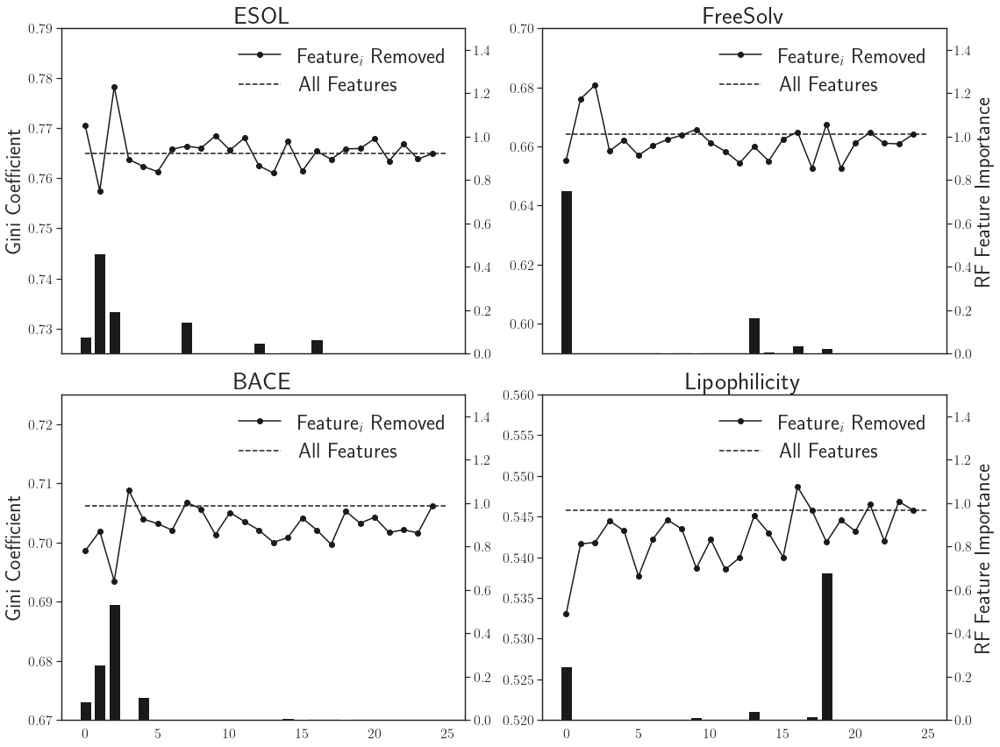

In [231]:
# Feature selection based on loss of compressability
properties = ["ESOL predicted log solubility in mols per litre", "expt", "pIC50","exp"]
ylims = [(0.725,0.79),(0.59,0.7),(0.67,0.725),(0.52,0.56)]
fig, axs = plt.subplots(2,2,figsize=(16,12))
coords = np.arange(4).reshape(2,2)

for i,dataset in enumerate(smiles_regression_datasets.items()):
    name, dset = dataset
    gini_loss = []
    
    for idx in range(len(regression_fingerprints[name]["Descriptor"][0][0])):
        X, idxs = regression_fingerprints[name]["Descriptor"]

        X = np.array(X)
        y = dset[properties[i]].iloc[idxs]
        desc_idxs = list(range(len(regression_fingerprints[name]["Descriptor"][0][0])))
        del desc_idxs[idx]
        X = X[:,desc_idxs]
        gini_val = gini(fourier_decomposition(X, RBF(10), y))
        gini_loss.append(gini_val)
    
    x, y = np.where(coords == i)
    a1 = axs[x,y][0]
    x_idxs = np.arange(25)
    a1.plot(x_idxs,np.array(gini_loss),'-o',c='k')
    a1.hlines(gini_val,xmin=0,xmax=25,linestyle='--',color='k')

    if  y == 0:
        a1.set_ylabel('Gini Coefficient',fontsize=24)
    a1.set_ylim(*ylims[i])
    a2 = a1.twinx()
    a2.bar(x_idxs, importances[i],color="k")
    if y == 1:
        a2.set_ylabel('RF Feature Importance',fontsize=24)
        
    if x == 0:
        a1.tick_params(axis='x',          # changes apply to the x-axis
                        which='both',      # both major and minor ticks are affected
                        bottom=False,      # ticks along the bottom edge are off
                        top=False,         # ticks along the top edge are off
                        labelbottom=False)
    a1.tick_params(axis='both',        
                    which='both',      # both major and minor ticks are affected
                    labelsize=16)
    a2.tick_params(axis='y',        
                    which='both',      # both major and minor ticks are affected
                    labelsize=16)
    a2.set_ylim(0,1.5)
    axs[x,y][0].set_title(name, fontsize=28)
    axs[x,y][0].legend(labels = (f"Feature$_i$ Removed",'All Features'),loc='upper right', frameon=False, fontsize=24)

#fig.legend(bbox_to_anchor=(1,0.5), loc='center left',frameon=False,title="Properties",fontsize=16,title_fontsize=24)
fig.tight_layout()
save("Feature_Selection.svg",sub_dir="Feature_Selection")

In [226]:
save("Feature_Selection.svg")

<Figure size 432x288 with 0 Axes>

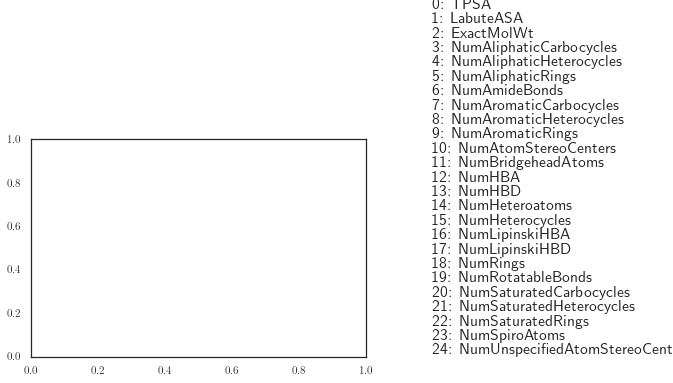

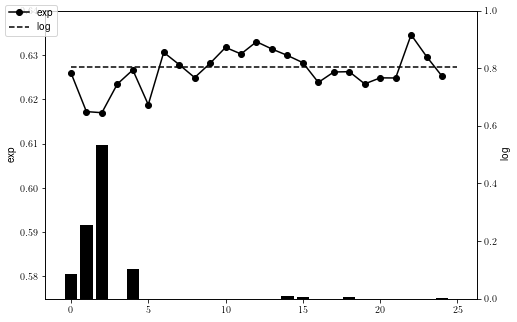

In [55]:
fig = plt.figure()
a1 = fig.add_axes([0,0,1,1])
x = np.arange(25)
a1.plot(x,np.array(gini_loss),'-o',c='k')
a1.hlines(gini(fourier_decomposition(regression_fingerprints["BACE"]["Descriptor"][0], RBF(100), y)),xmin=0,xmax=25,linestyle='--',color='k')

a1.set_ylabel('exp')
a1.set_ylim(0.575,0.64)
a2 = a1.twinx()
a2.bar(x, importances[3],color="k")
a2.set_ylabel('log')
a2.set_ylim(0,1)
fig.legend(labels = ('exp','log'),loc='upper left')
#plt.show()

#plt.plot(np.array(gini_loss),'-o',c='k')
#plt.hlines(gini(fourier_decomposition(regression_fingerprints["BACE"]["Descriptor"][0], RBF(100), y)),xmin=0,xmax=25,linestyle='--',color='k')
#plt.bar(range(len(gini_loss)),importances[3])
plt.show()

In [220]:
importances[3]

array([0.08619252, 0.25393692, 0.53272422, 0.        , 0.10418326,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.01048439,
       0.00540295, 0.        , 0.        , 0.00485619, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00221955])

In [43]:
current = gini(fourier_decomposition(regression_fingerprints["BACE"]["Descriptor"][0], RBF(100), y))

array([-0.00135721, -0.01011145, -0.01036241, -0.00388949, -0.00070622,
       -0.00854464,  0.00325502,  0.00049657, -0.00243406,  0.00079379,
        0.00437649,  0.00289449,  0.00566017,  0.00400961,  0.00256097,
        0.00092937, -0.00352403, -0.00117045, -0.00110351, -0.00385967,
       -0.00249707, -0.00252426,  0.007226  ,  0.00231885, -0.00212524])

In [ ]:
small_X = X[:,[1,2,7]]

fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(projection='3d')

ax.scatter(*small_X.T)

# Gaussian Process Regression

In [791]:
import scipy
from scipy import linalg
import sklearn.metrics as metrics
from scipy.stats import spearmanr

In [709]:
X1 = fps[100:200]
X2 = fps[200:250]
y1 = qm9_df.iloc[100:200]["Dipole Moment"].to_numpy()

In [711]:
prop = "Dipole Moment"

X1 = cm_mols[:200]
X2 = cm_mols[200:250]
y1 = qm9_df.iloc[:200][prop].to_numpy()
y2 = qm9_df.iloc[200:250][prop].to_numpy()

In [792]:
def GP(X1, y1, X2, kernel_func, Σ11=None, Σ12=None, solved=None, Σ22=None):
    """
    Modified from code at https://peterroelants.github.io/posts/gaussian-process-tutorial/
    
    Calculate the posterior mean and covariance matrix for y2
    based on the corresponding input X2, the observations (y1, X1), 
    and the prior kernel function.
    
    Parameters 
    ----------
    X1 : np.array(N,)
        A numpy array or list of the samples with known values that can be acted on by the kernel function.
    
    y1 : np.array(N,)
        The known function values for all samples in X1.
    
    X2 : np.array(M,)
        A numpy array or list of the samples with unknown values that will be predicted.
    
    kernel_func : func
        A valid kernel function that can act on both X1 and X2.
    
    Σ11 : np.array(N,N), default=None
        A pre-computed covariance matrix that would be calculated as kernel_func(X1, X1).
    
    Σ12 : np.array(N,M), default=None
        A pre-computed covariance matrix that would be calculated as kernel_func(X1, X2).
    
    solved : np.array(M,N), default=None
        A pre-computed covariance inverse (Σ11^-1 Σ12)^T that would be computed through the line
        solved = scipy.linalg.solve(Σ11, Σ12, assume_a='pos').T
    
    Σ22 : np.array(M,M), default=None
        A pre-computed covariance matrix that would be calculated as kernel_func(X2,X2).
        
    Returns 
    -------
    μ2 : np.array(M,)
        The mean function values for all samples in X2.
    
    Σ2 : np.array(M,)
        The covariance  matrix for the predicted samples from X2.
    """
    # Kernel of the observations
    if Σ11 is None:
        Σ11 = kernel_func(X1, X1)
    # Kernel of observations vs to-predict
    if Σ12 is None:
        Σ12 = kernel_func(X1, X2)
    # Solve
    if solved is None:
        solved = scipy.linalg.solve(Σ11, Σ12, assume_a='pos').T
    # Compute posterior mean
    μ2 = solved @ y1
    # Compute the posterior covariance
    
    if Σ22 is None:
        Σ22 = kernel_func(X2, X2)
    Σ2 = Σ22 - (solved @ Σ12)
    return μ2, Σ2  # mean, covariance

# Compute posterior mean and covariance
#μ2, Σ2 = GP(X1, y1, X2, RBF(10))

# Compute the standard deviation at the test points to be plotted
#σ2 = np.sqrt(np.diag(Σ2))

# Draw some samples of the posterior
#y2 = np.random.multivariate_normal(mean=μ2, cov=Σ2, size=75)

Computing covariance matrices


/Users/amater/anaconda3/envs/chemistry/lib/python3.7/site-packages/ipykernel_launcher.py:14: LinAlgWarning: Ill-conditioned matrix (rcond=2.43994e-17): result may not be accurate.
  


Computing eigenterms
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing covariance matrices


/Users/amater/anaconda3/envs/chemistry/lib/python3.7/site-packages/ipykernel_launcher.py:14: LinAlgWarning: Ill-conditioned matrix (rcond=3.01443e-18): result may not be accurate.
  


Computing eigenterms
Computing Dipole Moment
Computing Isotropic Polarizability
Computing Energy of HOMO
Computing Energy of LUMO
Computing HOMO-LUMO Gap
Computing Electronic Spatial Extent
Computing ZPVE
Computing Internal Energy at 0K
Computing covariance matrices


LinAlgError: Matrix is singular.

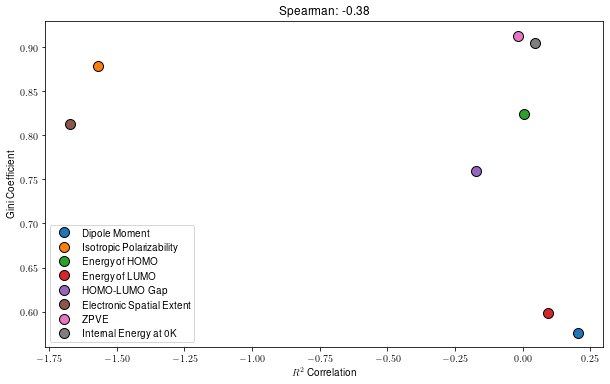

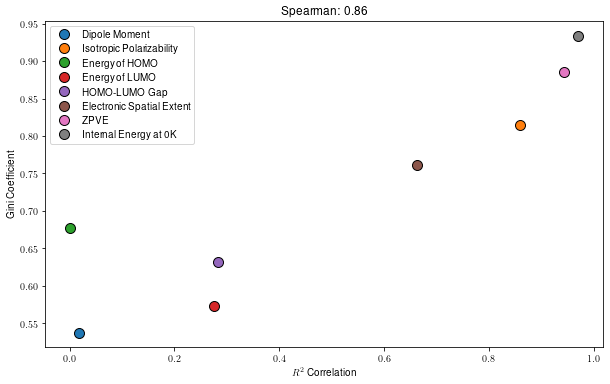

In [795]:
sub_dir = "QM9_GPR"

def GPR_plot(df,reps,idxs,test_idxs,kernel, correlation="Spearman", correlation_func=spearmanr, overall_correlation=spearmanr):
    
    # Form training samples
    X1, X2 = reps[idxs], reps[test_idxs]
    
    # Initialize empty correlation and gini coefficient lists
    corrs = []
    ginis = []
    
    print("Computing covariance matrices")
    # Pre-compute the terms for the Gaussian Process
    Σ11 = kernel(X1, X1)
    Σ12 = kernel(X1, X2)
    Σ22 = kernel(X2, X2)
    solved = scipy.linalg.solve(Σ11,Σ12,assume_a='pos').T
    
    # Pre-compute the eigenvectors for the Fourier decomposition
    print("Computing eigenterms")
    q = fourier(kernel(np.concatenate([X1,X2]),np.concatenate([X1,X2])))
    
    # Prepare the figure making section
    fig, ax = plt.subplots(figsize=(10,6))
    
    for prop in list(df)[5:-4]:
        # Iterate over the properties
        print(f"Computing {prop}")
        y1, y2 = df.iloc[idxs][prop].to_numpy(), df.iloc[test_idxs][prop].to_numpy()
        
        # Compute the posterior samples from the Gaussian Process
        μ2, Σ2 = GP(X1, y1, X2, kernel, Σ11=Σ11, Σ12=Σ12, Σ22=Σ22, solved=solved)
        corr = correlation_func(μ2,y2)
        gini_val = gini(gft(q,np.concatenate([y1,y2])))
        
        # Append the correlaion and gini values
        corrs.append(corr)
        ginis.append(gini_val)
        
        # Plot the correlation and gini values
        ax.plot(corr, gini_val, 'o',label=prop, markeredgecolor="k",markersize=10)
    
    # Set labels
    ax.set_xlabel(f"{correlation} Correlation")
    ax.set_ylabel("Gini Coefficient")
    ax.set_title(f"Spearman: {overall_correlation(corrs,ginis)[0]:.2f}")
    
    return fig, r2s, ginis

ax, r2s, ginis = GPR_plot(qm9_df, avsoap_mols, np.arange(100,1000), np.arange(1000,1200), RBF(100), 
                          correlation_func=metrics.r2_score,correlation=f"$R^2$",overall_correlation=spearmanr)

plt.legend()
save("GPR_QM9_AvSOAP1000.pdf",sub_dir=sub_dir)

ax, r2s, ginis = GPR_plot(qm9_df, cm_mols, np.arange(100,1000), np.arange(1000,1200), RBF(100), 
                          correlation_func=metrics.r2_score,correlation=f"$R^2$",overall_correlation=spearmanr)

plt.legend()
save("GPR_QM9_CM1000.pdf",sub_dir=sub_dir)

ax, r2s, ginis = GPR_plot(qm9_df, np.array(fps), np.arange(100,1000), np.arange(1000,1200), RBF(100), 
                          correlation_func=metrics.r2_score,correlation=f"$R^2$",overall_correlation=spearmanr)

plt.legend()
save("GPR_QM9_FPS1000.pdf",sub_dir=sub_dir)

In [ ]:
sub_dir = "QM9_GPR"

def GPR_plot(df,adj,properties, rows, cols, eigenvectors=None,idxs=None,title=None):
    """
    Computes the signal decomposition plot for all properties in a dataset of interest.
    
    Parameters 
    ----------
    df : pandas.DataFrame
        The pandas dataframe storing the properties for each molecule of interest.
    
    adj : np.array(NxN)
        The adjacency matrix that will be eigendecomposed into its eigenvectors.
        
    properties : [str]
        A list of property values to extract from the dataframe.
        
    rows : int
        The number of rows in the plot generated.

    cols : int
        The number of columns in the plot generated.
        
    eigenvectors : np.array(NxN)
        An array of eigenvectors that can be used instead of the adjacency matrix.
        
    idxs : np.array, default=None
        The indices of the pandas dataframe that represent the molecules in the adjacency matrix.
        
    title : str, default=None
        The super title of the plot. Individual plots are titled using the property labels in properties.
    
    Returns 
    ------- 
    fig : matplotlib.Figure
        The figure with all subplots of interest.
    """
    fig, axs = plt.subplots(rows,cols,figsize=(cols*3,rows*3))
    coords = np.arange(rows * cols).reshape(rows,cols)
    
    if eigenvectors is None:
        eigenvectors = fourier(adj)
    
    for i,prop in enumerate(properties):
        x,y = np.where(coords == i)
        ax = axs[x,y][0]
        
        if idxs is not None:
            signal = df.iloc[idxs][prop].to_numpy()
        else:
            signal = df[prop].to_numpy()
            
        scaled_signal = MinMaxScaler().fit_transform(signal.reshape(-1,1))
        sns_cmap = sns.color_palette("flare_r", as_cmap=True)
        ax.set_title(f"{prop}")

        signal_plot(gft(eigenvectors,scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=gini,linewidth=0.5,ax=ax)
        ax.tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)
    
    if title is not None:
        fig.suptitle(title,fontsize=32)
    
    return fig 

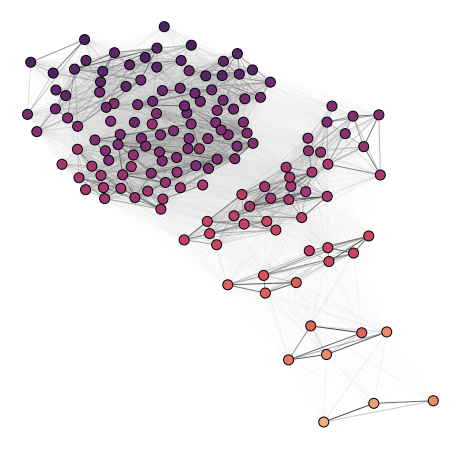

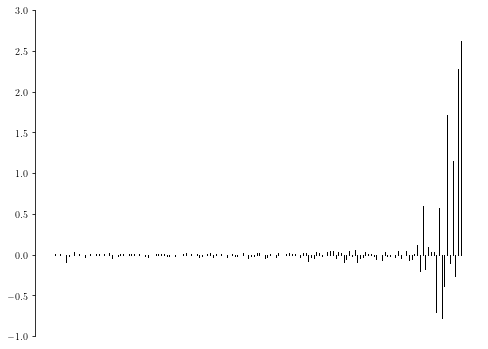

In [233]:
signal = qm9_df.iloc[:150]["Free Energy at 298.15K"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
sns_cmap = sns.color_palette("flare_r", as_cmap=True)
ax = plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,))
save("Spring_CM_FreeEn.pdf",sub_dir=sub_dir)

signal_plot(gft(Fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=None)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
save("Spring_CM_FreeEn_Signal.pdf",sub_dir=sub_dir)

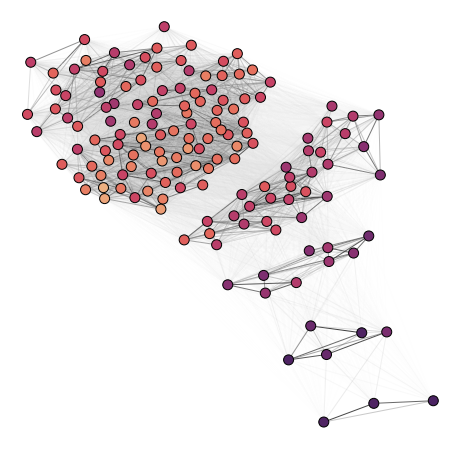

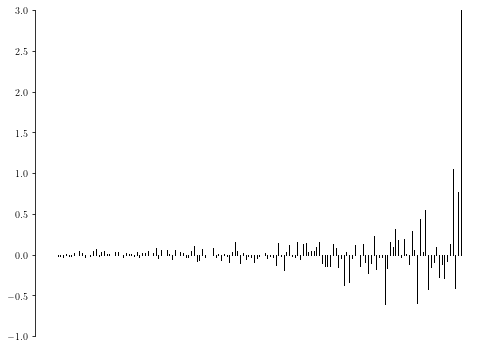

In [231]:
signal = qm9_df.iloc[:150]["Heat Capacity at 298.15K"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
sns_cmap = sns.color_palette("flare_r", as_cmap=True)
ax = plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,))
save("Spring_CM_HeatCapacity.pdf",sub_dir=sub_dir)

signal_plot(gft(fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=None)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
save("Spring_CM_HeatCapacity_Signal.pdf",sub_dir=sub_dir)

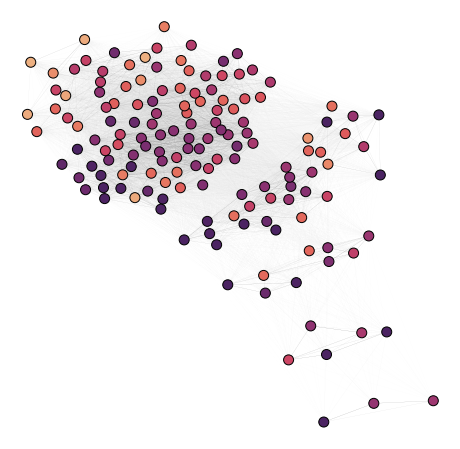

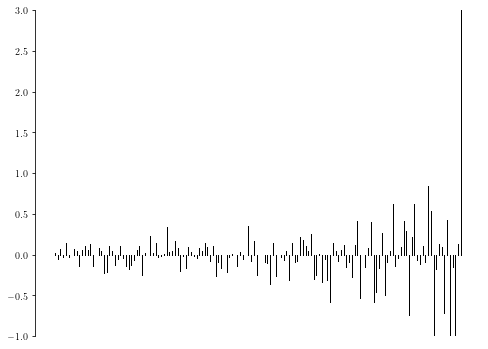

In [1722]:
signal = qm9_df.iloc[:150]["Dipole Moment"].to_numpy()
scaler = MinMaxScaler()
scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
sns_cmap = sns.color_palette("flare_r", as_cmap=True)
ax = plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,),width=0.1)
save("Spring_CM_DipMom.pdf",sub_dir=sub_dir)

signal_plot(gft(Fourier(cm_adj[:150,:150]),scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=None)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)
#save("Spring_CM_DipMom_Signal.pdf",sub_dir=sub_dir)

# Studying how Kernel value alters the Gini Coefficient of the signal 



In [ ]:
fig, axs = plt.subplots(3,5,figsize=(15,9))
samples = 2500
coords = np.arange(15).reshape(3,5)
q = Fourier(cm_adj_signals[:samples,:samples])

for i,prop in enumerate(list(qm9_df)[2:]):
    x,y = np.where(coords == i)
    
    signal = qm9_df.iloc[:samples][prop].to_numpy()
    scaler = MinMaxScaler()
    scaled_signal = scaler.fit_transform(signal.reshape(-1,1))
    sns_cmap = sns.color_palette("flare_r", as_cmap=True)
    #plot_adj(cm_adj[:150,:150], pos=adj150_pos,node_size=100,node_cmap=sns_cmap,signal=scaled_signal.reshape(-1,))
    axs[x,y][0].set_title(f"{prop}")
    
    signal_plot(gft(q,scaled_signal),ylim=(-1,3),spines=['top','right','bottom'],gini=gini,linewidth=0.5,ax=axs[x,y][0])
    axs[x,y][0].tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)
    
save("QM9_All_Signals_2500Samples.pdf",sub_dir=sub_dir)

100%|██████████| 100/100 [00:00<00:00, 212.40it/s]


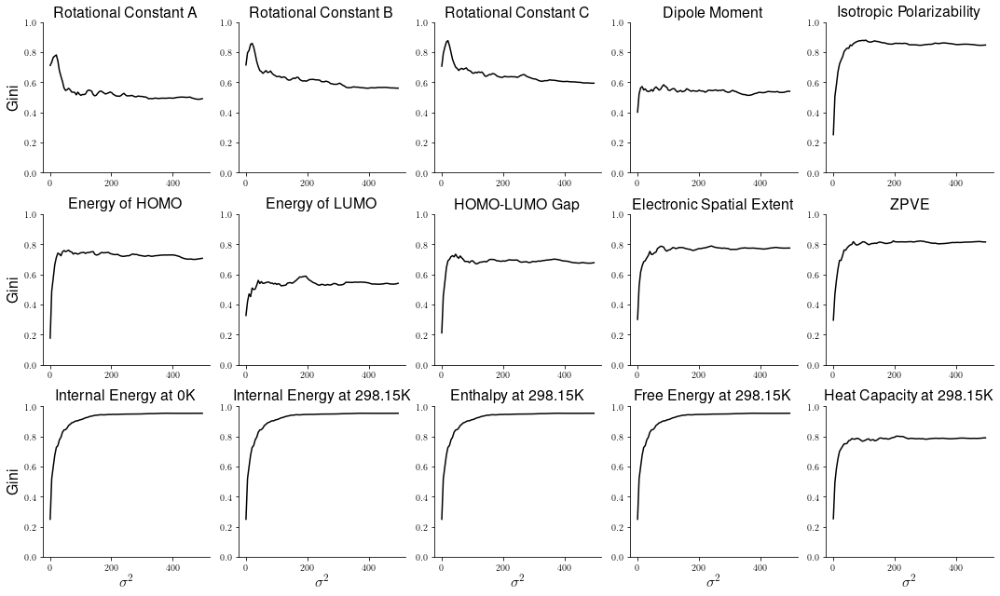

In [349]:
fig, axs = plt.subplots(3,5,figsize=(15,9))
samples = 100
coords = np.arange(15).reshape(3,5)

for i,prop in enumerate(list(qm9_df)[2:]):
    x,y = np.where(coords == i)
    signal = qm9_df.iloc[:samples][prop].to_numpy()
    
    ginis = []

    ax = axs[x,y][0]
    for i in tqdm.tqdm(range(1,500,5)):
        adj = RBF(i)(cm_mols[:samples])
        coeffs = gft(Fourier(adj),signal)
        ginis.append(gini(coeffs))
    ax.plot(range(1,500,5),ginis,"k")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_ylim(0,1)
    
    if y == 0:
        ax.set_ylabel("Gini",fontsize=16)
    if x == 2:
        ax.set_xlabel(f"$\sigma^2$",fontsize=16)
    ax.set_title(prop,fontsize=16)
    
fig.tight_layout()
save("Kernel_Influence_Gini.pdf",sub_dir="Kernel_Influence")

100%|██████████| 100/100 [00:05<00:00, 19.87it/s]


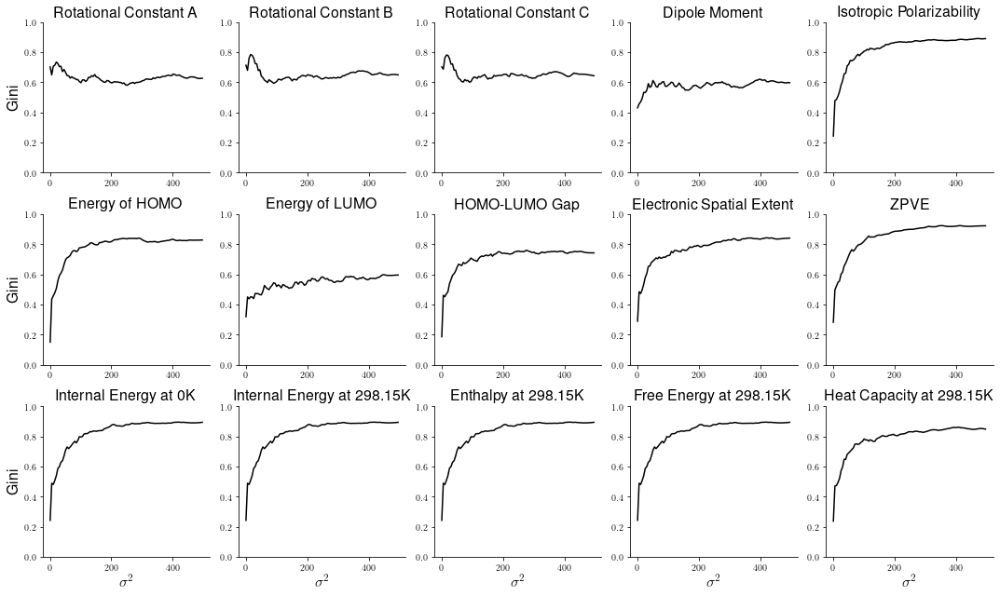

In [510]:
fig, axs = plt.subplots(3,5,figsize=(15,9))
samples = 100
coords = np.arange(15).reshape(3,5)

for i,prop in enumerate(list(qm9_df)[2:]):
    x,y = np.where(coords == i)
    signal = qm9_df.iloc[:samples][prop].to_numpy()
    
    ginis = []

    ax = axs[x,y][0]
    for i in tqdm.tqdm(range(1,500,5)):
        adj = RBF(i)(avsoap_mols[:samples])
        coeffs = gft(Fourier(adj),signal)
        ginis.append(gini(coeffs))
    ax.plot(range(1,500,5),ginis,"k")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_ylim(0,1)
    
    if y == 0:
        ax.set_ylabel("Gini",fontsize=16)
    if x == 2:
        ax.set_xlabel(f"$\sigma^2$",fontsize=16)
    ax.set_title(prop,fontsize=16)
    
fig.tight_layout()
save("Kernel_Influence_Gini_Avsoap.pdf",sub_dir="Kernel_Influence")


100%|██████████| 100/100 [00:00<00:00, 179.47it/s][A


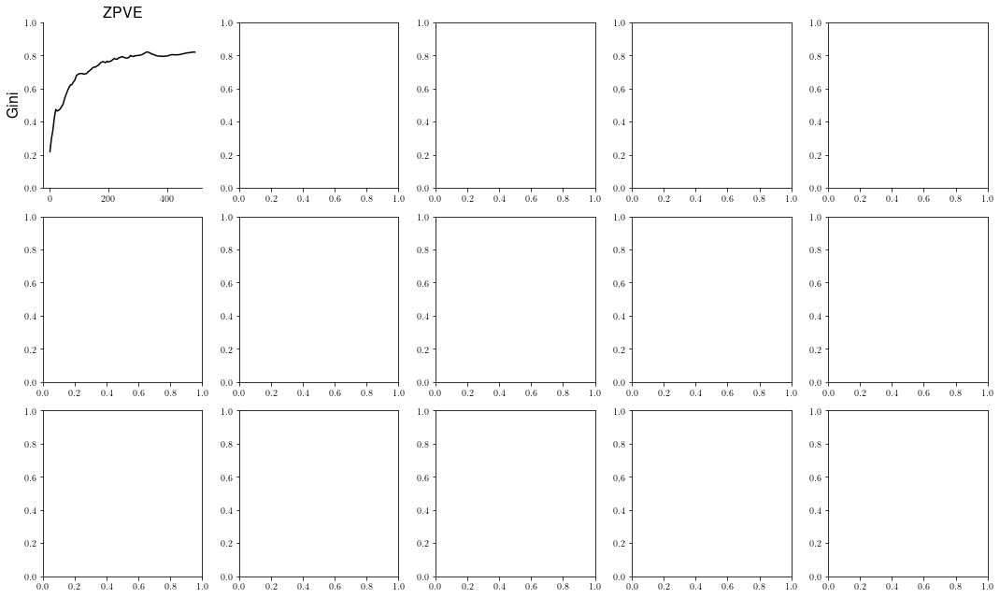

In [502]:
fig, axs = plt.subplots(3,5,figsize=(15,9))
samples = 100
coords = np.arange(15).reshape(3,5)

for i,prop in enumerate(["ZPVE"]):
    x,y = np.where(coords == i)
    signal = qm9_df.iloc[:samples][prop].to_numpy()
    
    ginis = []

    ax = axs[x,y][0]
    for i in tqdm.tqdm(np.linspace(0.001,100,100)):
        adj = RBF(i)(cm_mols[:samples])
        coeffs = gft(Fourier(adj),signal)
        ginis.append(gini(coeffs))
    ax.plot(range(1,500,5),ginis,"k")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_ylim(0,1)
    
    if y == 0:
        ax.set_ylabel("Gini",fontsize=16)
    if x == 2:
        ax.set_xlabel(f"$\sigma^2$",fontsize=16)
    ax.set_title(prop,fontsize=16)
    
fig.tight_layout()
#save("Kernel_Influence_Gini.pdf",sub_dir="Kernel_Influence")

In [507]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

init = 0
prop="ZPVE"

X = avsoap_mols
y = qm9_df.iloc[:len(cm_mols)][prop].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, StandardScaler().fit_transform(y.reshape(-1,1)).ravel(), test_size=0.33, random_state=42)

#regr = RandomForestRegressor(max_depth=2, random_state=0)
#regr.fit(X_train, y_train)
regr = MLPRegressor(max_iter=500).fit(X_train, y_train)

regr.predict(X_test[0].reshape(1,-1))
regr.score(X_test,y_test)

0.9690390683614621

In [508]:
init = 0
prop="Free Energy at 298.15K"

X = avsoap_mols
y = qm9_df.iloc[:len(cm_mols)][prop].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, StandardScaler().fit_transform(y.reshape(-1,1)).ravel(), test_size=0.33, random_state=42)

#regr = RandomForestRegressor(max_depth=2, random_state=0)
#regr.fit(X_train, y_train)
regr = MLPRegressor(max_iter=500).fit(X_train, y_train)

regr.predict(X_test[0].reshape(1,-1))
regr.score(X_test,y_test)

0.9424044706982417

In [511]:
init = 0
prop="Energy of HOMO"

X = avsoap_mols
y = qm9_df.iloc[:len(cm_mols)][prop].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, StandardScaler().fit_transform(y.reshape(-1,1)).ravel(), test_size=0.33, random_state=42)

#regr = RandomForestRegressor(max_depth=2, random_state=0)
#regr.fit(X_train, y_train)
regr = MLPRegressor(max_iter=500).fit(X_train, y_train)

regr.predict(X_test[0].reshape(1,-1))
regr.score(X_test,y_test)

0.8166624187089874

In [512]:
init = 0
prop="Energy of LUMO"

X = avsoap_mols
y = qm9_df.iloc[:len(cm_mols)][prop].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, StandardScaler().fit_transform(y.reshape(-1,1)).ravel(), test_size=0.33, random_state=42)

#regr = RandomForestRegressor(max_depth=2, random_state=0)
#regr.fit(X_train, y_train)
regr = MLPRegressor(max_iter=500).fit(X_train, y_train)

regr.predict(X_test[0].reshape(1,-1))
regr.score(X_test,y_test)

0.822948661175629

In [509]:
init = 0
prop="Dipole Moment"

X = avsoap_mols
y = qm9_df.iloc[:len(cm_mols)][prop].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, StandardScaler().fit_transform(y.reshape(-1,1)).ravel(), test_size=0.33, random_state=42)

#regr = RandomForestRegressor(max_depth=2, random_state=0)
#regr.fit(X_train, y_train)
regr = MLPRegressor(max_iter=500).fit(X_train, y_train)

regr.predict(X_test[0].reshape(1,-1))
regr.score(X_test,y_test)

0.8267940658545139

# Creating Graphs Image Generation Section

100%|██████████| 50/50 [00:00<00:00, 1734.62it/s]


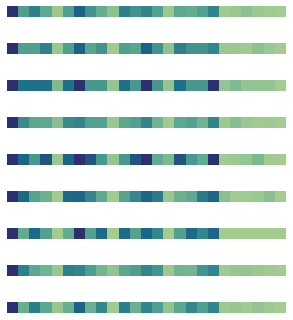

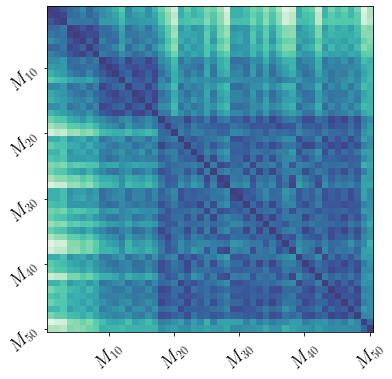

In [1808]:
sub_dir = "Creating_Graphs"

# Setting up the CM descriptor
cm_vis = CoulombMatrix(
    n_atoms_max=14,
)

cm_mols_vis = [cm_vis.create(mol) for mol in tqdm.tqdm(mols_soap[:50],position=0, leave=True)]

sns_cmap = sns.color_palette("crest", as_cmap=True)

fig, axs = plt.subplots(9,1,figsize=(5,6))

for i in range(9):
    axs[i].imshow(cm_mols_vis[18+i].reshape(14,14)[:5,:5].reshape(1,-1),cmap=sns_cmap)
    axs[i].set_axis_off()
save("Vectors.png",dpi=400,sub_dir=sub_dir)

import seaborn as sns

fig, ax = plt.subplots(1,1,figsize=(6,6)) 
sns_cmap = sns.color_palette("mako_r", as_cmap=True)
x  = [9,19,29,39,49]
x_ticks_labels = y_ticks_labels = [r"$M_{10}$","$M_{20}$","$M_{30}$","$M_{40}$","$M_{50}$"]


ax.set_xticks(x)
ax.set_yticks([9,19,29,39,49])
# Set ticks labels for x-axis
ax.set_xticklabels(x_ticks_labels, rotation=45, fontsize=18)
ax.set_yticklabels(y_ticks_labels, rotation=45, fontsize=18)

cm_adj_vis = RBF(100)(cm_mols[:50])

plt.imshow(cm_adj_vis[:50,:50],cmap=sns_cmap,vmax=1.25)
save("Similarities.png",dpi=400,sub_dir=sub_dir)

In [593]:
signal = qm9_df.iloc[:2500]["HOMO-LUMO Gap"]

ker_adj = re_kernel

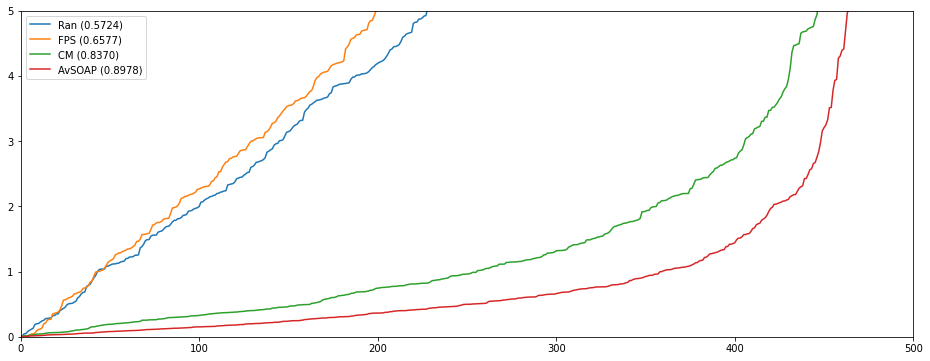

In [486]:
signal = qm9_df.iloc[:500]["Isotropic Polarizability"]

coeffs_arr = {"Ran" : fourier_decomposition(np.random.randn(500,1),RBF(600),signal),
              "FPS" : fourier_decomposition(fps[:500],ham_ker,signal),
              "CM" : fourier_decomposition(np.array(cm_mols),RBF(600),signal),
              "AvSOAP" : fourier_decomposition(np.array(av_soap_mols),RBF(1400),signal)}

ax = spectrum_plot(coeffs_arr)
ax.set_ylim(0,5)
plt.legend()

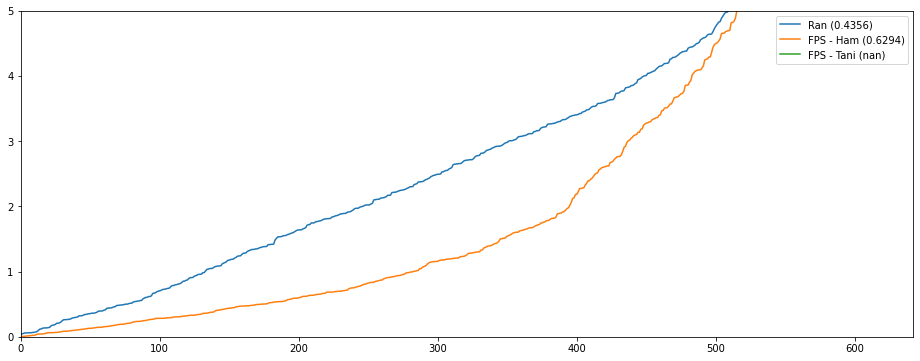

In [503]:
signal = freesolv_df['expt']

coeffs_arr = {"Ran" : fourier_decomposition(np.random.randn(642,1),RBF(100),signal),
              "FPS - Ham" : fourier_decomposition(freesolv_fps,ham_ker,signal),
              "FPS - Tani" : fourier_decomposition(freesolv_fps,tani_ker,signal)}

ax = spectrum_plot(coeffs_arr)
ax.set_ylim(0,5)
plt.legend()

<AxesSubplot:>

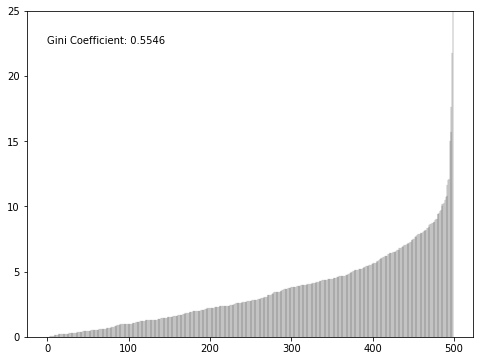

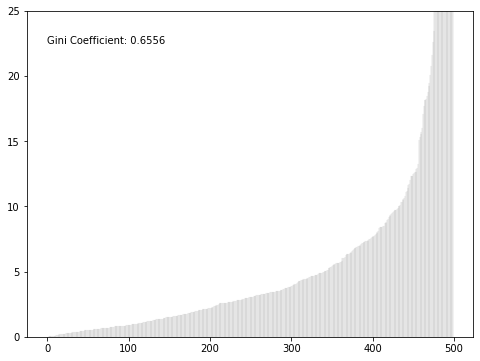

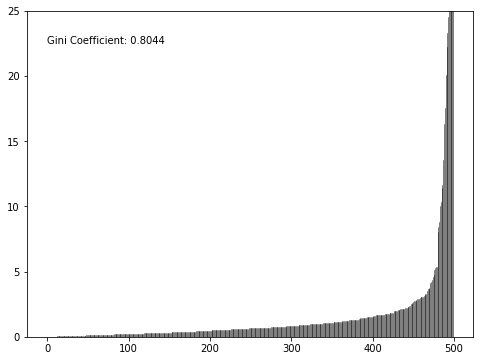

In [450]:
ylim = (0,25)

signal = qm9_df.iloc[:500]["Heat Capacity at 298.15K"]

signal_plot(fourier_decomposition(np.random.randn(500,1),RBF(600),signal.to_numpy()),ylim=ylim,sort=True,linewidth=0.25)
signal_plot(fourier_decomposition(fps[:500],ham_ker,signal.to_numpy()),ylim=ylim,sort=True,linewidth=0.1)
signal_plot(fourier_decomposition(np.array(cm_mols),RBF(600),signal.to_numpy()),ylim=ylim,sort=True,linewidth=0.5)

In [906]:
from scipy.linalg import eigh

test1,test2 = eigh(random_adj)

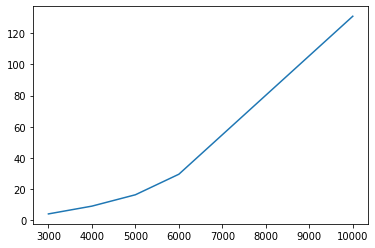

In [916]:
data = {3000 : 4,
    4000 : 9,
    5000 : 16.3,
    6000 : 29.5,
    10000 : 131,}

x,y = list(data.keys()), list(data.values())

plt.plot(x,y)



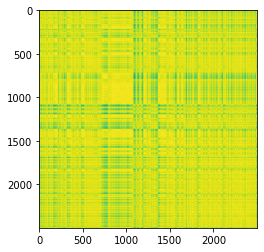

In [643]:
plt.imshow(avsoap_adj)

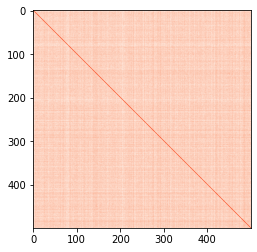

In [320]:
plt.imshow(random_adj,cmap="Reds")

In [ ]:
# 2 seconds 1000x1000
# 11 seconds 2000x2000
# 36 seconds 3000x3000
# 84 seconds 4000x4000

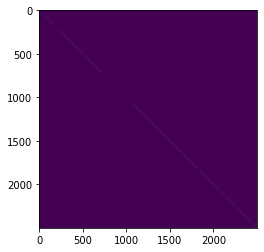

In [663]:
fp_adj = adj(fps,f)
plt.imshow(lap(fp_adj))

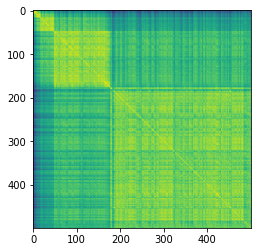

In [244]:
plt.imshow(cm_adj)

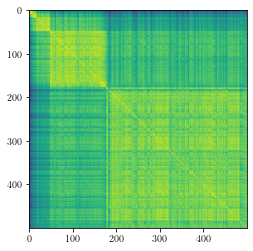

In [51]:
plt.imshow(cm_adj)

(-5.0, 5.0)

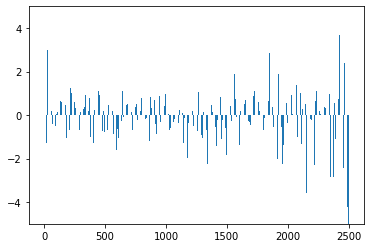

In [719]:
signal = qm9_df.iloc[:2500]["Dipole Moment"]

plt.bar(range(2500),height=np.linalg.eigh(fp_adj)[1].T @ signal,width=0.5)
plt.ylim(-5,5)

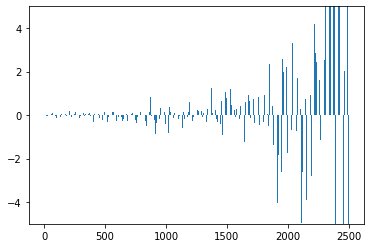

In [838]:
signal = qm9_df.iloc[:2500]["Free Energy at 298.15K"]

plt.bar(range(2500),height=np.linalg.eigh(avsoap_adj)[1].T @ signal,width=0.5)
plt.ylim(-5,5)
plt.show()

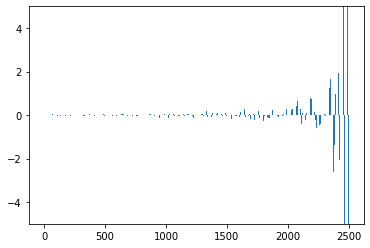

In [837]:
signal = qm9_df.iloc[:2500]["Free Energy at 298.15K"]

plt.bar(range(2500),height=np.linalg.eigh(cm_adj)[1].T @ signal,width=0.5)
plt.ylim(-5,5)
plt.show()

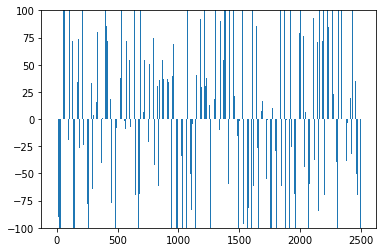

In [834]:
signal = qm9_df.iloc[:2500]["Free Energy at 298.15K"]

plt.bar(range(2500),height=np.linalg.eigh(random_adj)[1].T @ signal,width=0.5)
plt.ylim(-100,100)
plt.show()

In [513]:
np.min(np.linalg.eigh(lap(avsoap_adj))[1].T @ signal)

-2.2016179211695692

In [420]:
signal = qm9_df.iloc[:500]["Dipole Moment"]


(0.0, 5.0)

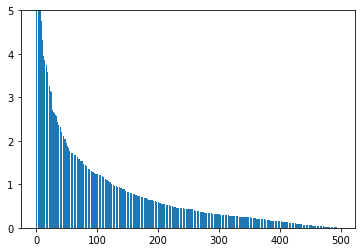

In [348]:
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(ker_adj)[1].T @ signal))[::-1])
plt.ylim(0,5)

(0.0, 5.0)

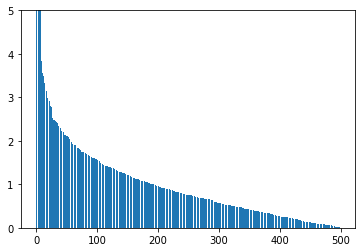

In [349]:
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(fp_adj)[1].T @ signal))[::-1])
plt.ylim(0,5)

(0.0, 5.0)

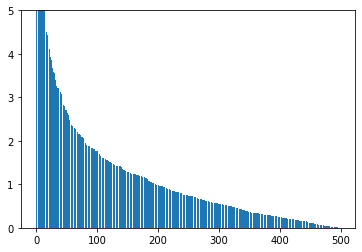

In [350]:
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1])
plt.ylim(0,5)

KeyboardInterrupt: 

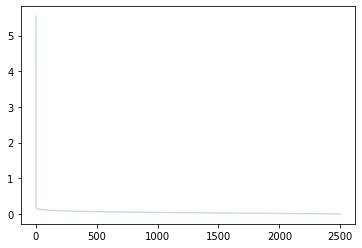

In [876]:
signal = qm9_df.iloc[:2500]["ZPVE"]

plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(random_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(2500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,0.1)

(0.0, 10.0)

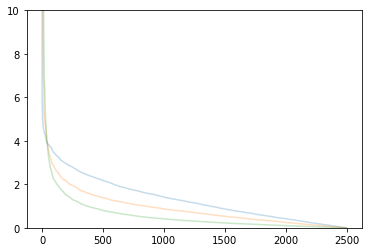

In [740]:
signal = qm9_df.iloc[:2500]["Dipole Moment"]

plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(random_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(2500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,10)

In [924]:
signal = qm9_df.iloc[:2500]["Dipole Moment"]

print(gini(np.abs(np.linalg.eigh(random_adj)[1].T @ signal)[::-1]))

0.43895359153697866


In [925]:
print(gini(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal)[::-1]))

0.510121442076904


In [926]:
print(gini(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal)[::-1]))

0.6489348783028175


(0.0, 25.0)

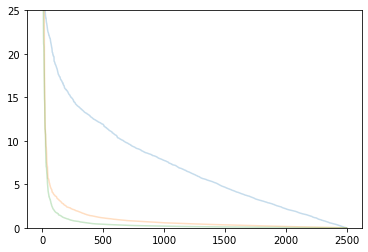

In [742]:
signal = qm9_df.iloc[:2500]["Heat Capacity at 298.15K"]

plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(random_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(2500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,25)

(2500, 2500)

In [121]:
signal = qm9_df.iloc[:2500]["Dipole Moment"]

def gini(x):
    # (Warning: This is a concise implementation, but it is O(n**2)
    # in time and memory, where n = len(x).  *Don't* pass in huge
    # samples!)

    # Mean absolute difference
    mad = np.abs(np.subtract.outer(x, x)).mean()
    # Relative mean absolute difference
    rmad = mad/np.mean(x)
    # Gini coefficient
    g = 0.5 * rmad
    return g

def gini_coefficient(x):
    """Compute Gini coefficient of array of values"""
    diffsum = 0
    for i, xi in enumerate(x[:-1], 1):
        diffsum += np.sum(np.abs(xi - x[i:]))
    return diffsum / (len(x)**2 * np.mean(x))


print(gini(np.abs(np.linalg.eigh(random_adj)[1].T @ signal)))
#print(gini_coefficient(np.abs(np.linalg.eigh(random_adj)[1].T @ signal)[::-1]))

0.4338069634404724


In [921]:
gini(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal)[::-1])

0.9924123258117096

In [922]:
gini(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal)[::-1])

0.9655001235915116

(0.0, 1000.0)

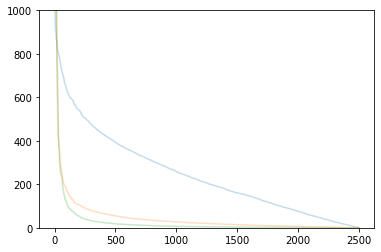

In [746]:
signal = qm9_df.iloc[:2500]["Electronic Spatial Extent"]

plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(random_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(2500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,1000)

(0.0, 200.0)

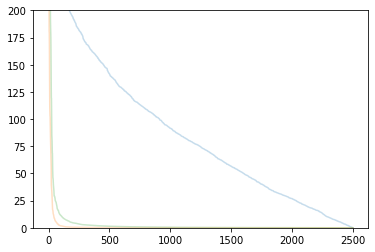

In [781]:
signal = qm9_df.iloc[:2500]["Free Energy at 298.15K"]

plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(random_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(2500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,200)

(0.0, 200.0)

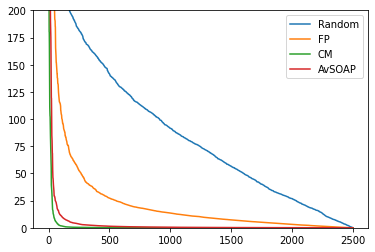

In [883]:
signal = qm9_df.iloc[:2500]["Free Energy at 298.15K"]

plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(random_adj)[1].T @ signal))[::-1],label="Random")
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(fp_adj)[1].T @ signal))[::-1],label="FP")
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(cm_adj)[1].T @ signal))[::-1],label="CM")
#plt.plot(range(500),np.sort(np.abs(np.linalg.eigh(ker_adj)[1].T @ signal))[::-1],label="REMatch")
plt.plot(range(2500),np.sort(np.abs(np.linalg.eigh(avsoap_adj)[1].T @ signal))[::-1],label="AvSOAP")
plt.legend()
plt.ylim(0,200)

(0.0, 0.1)

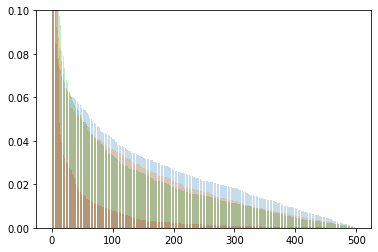

In [388]:
signal = qm9_df.iloc[:500]["ZPVE"]

plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(random_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(RBF_kernel(cm_mols)))[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(avsoap_adj))[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,0.1)

(0.0, 10.0)

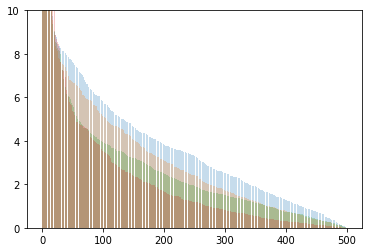

In [389]:
signal = qm9_df.iloc[:500]["Heat Capacity at 298.15K"]

plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(random_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(fp_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(RBF_kernel(cm_mols)))[1].T @ signal))[::-1],alpha=0.25)
#plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(ker_adj))[1].T @ signal))[::-1],alpha=0.25)
plt.bar(range(500),height=np.sort(np.abs(np.linalg.eigh(lap(avsoap_adj))[1].T @ signal))[::-1],alpha=0.25)

plt.ylim(0,10)

-49.07781719731255


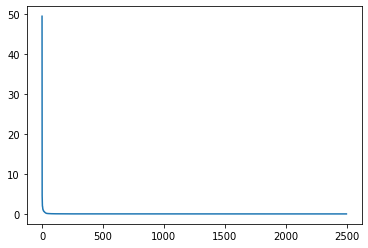

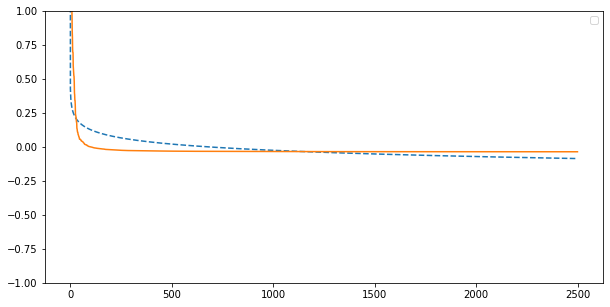

In [830]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

signal = qm9_df.iloc[:2500]["Free Energy at 298.15K"]
adj = avsoap_adj
coefficients = np.sort(np.abs(np.linalg.eigh(adj)[1].T @ signal))[::-1]
mean, stdev = np.mean(coefficients), np.sqrt(np.var(coefficients))
coefficients -= mean
coefficients /= stdev

plt.plot(range(2500),coefficients)

def func_powerlaw(x, m, c, c0):
    return c0 + x**m * c

target_func = func_powerlaw
popt, pcov = curve_fit(target_func, range(2500), coefficients)

plt.figure(figsize=(10, 5))
plt.plot(range(2500), target_func(range(2500), *popt), '--')
plt.plot(range(2500), coefficients)
plt.ylim(-1,1)
plt.legend()
print(popt[1])
plt.show()

In [488]:
from sklearn.utils.optimize import _check_optimize_result

class MyGPR(GaussianProcessRegressor):
    def __init__(self, *args, max_iter=10000, gtol=1e-06, **kwargs):
        super().__init__(*args, **kwargs)
        self._max_iter = max_iter
        self._gtol = gtol

    def _constrained_optimization(self, obj_func, initial_theta, bounds):
        if self.optimizer == "fmin_l_bfgs_b":
            opt_res = scipy.optimize.minimize(obj_func, initial_theta, method="L-BFGS-B", jac=True, bounds=bounds, options={'maxiter':self._max_iter, 'gtol': self._gtol})
            _check_optimize_result("lbfgs", opt_res)
            theta_opt, func_min = opt_res.x, opt_res.fun
        elif callable(self.optimizer):
            theta_opt, func_min = self.optimizer(obj_func, initial_theta, bounds=bounds)
        else:
            raise ValueError("Unknown optimizer %s." % self.optimizer)
        return theta_opt, func_min

In [726]:
gpr.kernel_

RBF(length_scale=26.1)

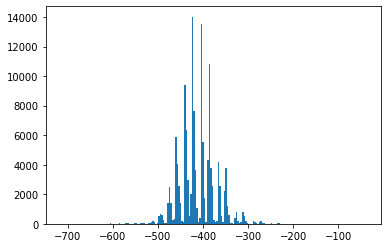

In [779]:
plt.hist(qm9_df["Free Energy at 298.15K"],bins=200)
plt.show()

In [800]:
from sklearn.gaussian_process import GaussianProcessRegressor
import sklearn 

rep = cm_mols

signal = qm9_df.iloc[:500]["Free Energy at 298.15K"].to_numpy()
#scaler = sklearn.preprocessing.StandardScaler().fit(signal.reshape(-1,1))
#signal = scaler.transform(signal.reshape(-1,1))

gpr = MyGPR(kernel=RBF(115),random_state=10, max_iter=1000).fit(rep[:400], signal[:400])
print(gpr.score(rep[400:500], signal[400:500]))
gpr.predict(rep[:2], return_std=True)

0.9947298975649075


(array([-40.49859704, -56.544961  ]), array([1.00001281e-05, 9.96362441e-06]))

In [801]:
gpr.kernel_

RBF(length_scale=103)

In [803]:
gpr.predict(rep[400:])

array([-264.93387785, -270.5997574 , -285.91108684, ..., -220.56230632,
       -236.28044526, -250.73959408])

In [802]:
signal[400:]

array([-265.429201, -269.205558, -285.310299, -265.437265, -269.205661,
       -285.311886, -270.468877, -286.507087, -306.388334, -306.393465,
       -271.648484, -287.693286, -307.575814, -235.727158, -271.653614,
       -271.652038, -271.641692, -307.574152, -270.477179, -286.54679 ,
       -286.522434, -306.427029, -286.514513, -306.394728, -286.544706,
       -302.564883, -322.468624, -306.398118, -322.46623 , -322.44232 ,
       -342.344721, -235.726894, -271.652386, -271.651656, -307.575262,
       -307.579988, -281.520391, -269.292553, -285.364182, -301.424079,
       -321.299312, -285.339869, -269.299973, -285.36533 , -286.544899,
       -322.462711, -322.472719, -270.501576, -286.571234, -306.447148,
       -306.415468, -342.36377 , -302.627663, -322.505169, -342.380838,
       -234.551976, -270.468829, -286.546498, -234.545523, -286.539796,
       -270.470141, -234.545692, -286.53756 , -270.466917, -270.470414,
       -235.754746, -271.67776 , -271.673114, -307.599195, -307.

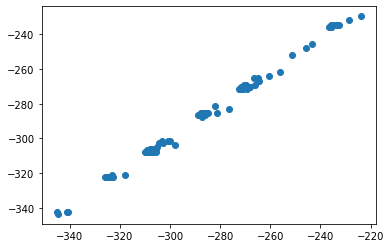

In [804]:
plt.scatter(gpr.predict(rep[400:500]),signal[400:])

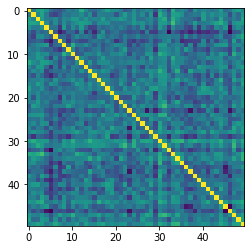

In [129]:
RBF_kernel = RBF(30)
plt.imshow(RBF_kernel(random))

In [199]:
# Manually adding this as this was the version when downloaded from Github.
#dscribe.__version__ = '1.1'

import scipy
import ase
import sklearn

imported_modules = [tqdm,np,pd,nx,sns,mpl,mhfp,rdkit,scipy,"dscribe",sklearn,"ase"]

for module in imported_modules:
    if module == "dscribe":
        print("dscribe : 1.1")
        continue
    elif module == "ase":
        print("ase : 3.22.0")
        continue
    print(getattr(module,"__name__") + " : " + getattr(module,"__version__"))



tqdm : 4.62.2
numpy : 1.20.3
pandas : 1.3.2
networkx : 2.5
seaborn : 0.11.2
matplotlib : 3.4.2
mhfp : 1.9.2
rdkit : 2021.03.4
scipy : 1.6.2
dscribe : 1.1
sklearn : 0.24.2
ase : 3.22.0
